<div align="center">
<h1> 
Analytics and Application - WS2021/22 <br>
Master of Science WI / IS <br>
Faculty of Management, Economics, and Social Sciences <br>
Department of Information Systems for Sustainable Society University of Cologne </h1>
</div>
    
<hr>

<div align="center"> 
    <b>Instructor </b> Prof. Dr. Wolfgang Ketter <br>
    <b> TA </b> Nastaran Naseri
</div>

<hr>

<div align="center">
<h3> 
Team Assignment - Team 06 <br>
Data Miners CABIB <br>
Isabel Wittmann, Bastian Schneider, Andrej Kotsovolos, Björn Reibke & Carsten Stukenborg </h3>
</div>

<hr>

<div align="center">
<h5> Dataset Chicago 2019 </h5>
</div>

<hr>
    
<div align="center">
<h2> 3. Cluster Analysis </h2>
</div>

# 3.0 Introduction

In the following section, mainly two perspectives will be taken in terms of what will be clustered: 
Firstly, we will create clusters based on trip durations, weather (temperatures and precip) and revenue characteristics as described and calculated in the descriptive section. Thus, we develop station-related clusters and transaction-related clusters. 
Secondly, we will try to develop clusters of stations based on activity measures. Activity measures in this context means mainly two measures: Firstly, the KPI2 as described and developed/illustrated in the descriptive section of this assignment. Firstly, the KPI2 as described and developed/illustrated in the descriptive section of this assignment and secondly, the number of starting rides per station.


As also non-technical persons might belong to the audience of this assignment, we would like to give a brief description of what clustering in the context of machine learning is and what the main issues are related to this technique. The individual algorithms will be described once they are introduced in the code. 
Clustering is a type of unsupervised learning, which means that one tries to detect certain patterns in the data without the availability of labels. What are labels? Labels are predefined values describing the data. In the example of our bike renting data, labels could be the customer/subscriber type. Whilst the (supervised learning) technique of classification would for example try to find similar or distinguishing characteristics of those subscribers/customers, clustering is interested in discovering structures that are based on common characteristics of the respective data points within a (potential) cluster, however where no label for those clusters exist. This leads to a major issue when applying clustering algorithms: We usually do not know how to evaluate whether a given cluster is "good" or "bad". Thus, the main measure of how well a clustering algorithm has subsumed data points will be mainly based on how similar the datapoints are within the respective cluster and how distinct they are in between clusters.  

<b>Overview<b>
- 3.0 Introduction
- 3.1 Clustering of duration
- 3.2 Clustering of duration and temperature
- 3.3 Clustering of duration, temperature and precip
- 3.4 Clustering of Rides based on revenue
- 3.5 Clustering of stations based on different features
- 3.6 Summary of the most important findings

In [1]:
#Import the libraries necessary for plotting
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
#Import time related libraries
import datetime
from datetime import datetime, timedelta
from datetimerange import DateTimeRange
#Import geospatial libraries
import geopandas
from geopandas import GeoDataFrame
#Import illustrative libraries
from shapely.geometry import Point, Polygon
from scipy.cluster.hierarchy import dendrogram
#Import clustering related libraries
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from scipy.spatial import ConvexHull

Read the required data files. Firstly, we need the kpi2 csv file, which stores the kpi2 values as defined in the
descriptive analytics part. Moreover, we need the trip- and weatherdata, together with the station locations.

In [2]:
divvy_bike_set = pd.read_csv("../data/bike_weather_clean.csv", parse_dates=["start_time", "end_time", "full_hour_start", "full_hour_end"])
weather_set = pd.read_csv("../data/weather_clean_interpol.csv", parse_dates=["full_hour_start"])
location = pd.read_csv("../data/Divvy_Bicycle_Stations-2.csv")
kpi2 = pd.read_csv("../data/kpi2.csv", parse_dates=["Hour"])

# 3.1. Clustering of duration

## 3.1.1 First inspection of the duration data by graphical plotting

After the initial inspection of the data with regard to duration as input feature for a possible clustering, it quickly became clear that an aggregation is necessary. A meaningful representation as well as an execution of K-Mean in a reasonable computational time for each individual trip duration with over 3 million data points is not feasible.
<br>
Therefore for all trips starting within one hour, the average duration time was calculated. Consequently, 365 days and 24 hours per day result in 8760 data points. In the case of our data, we have calculated a number of data points that is less than 8760. This is due to the fact that for some time periods there are no registered trips.  
<br>
In the following we would like to refer to the mean duration of each available hour to one 'trip'. A 'trip' thus describes the average of the duration times of a specific hour. 

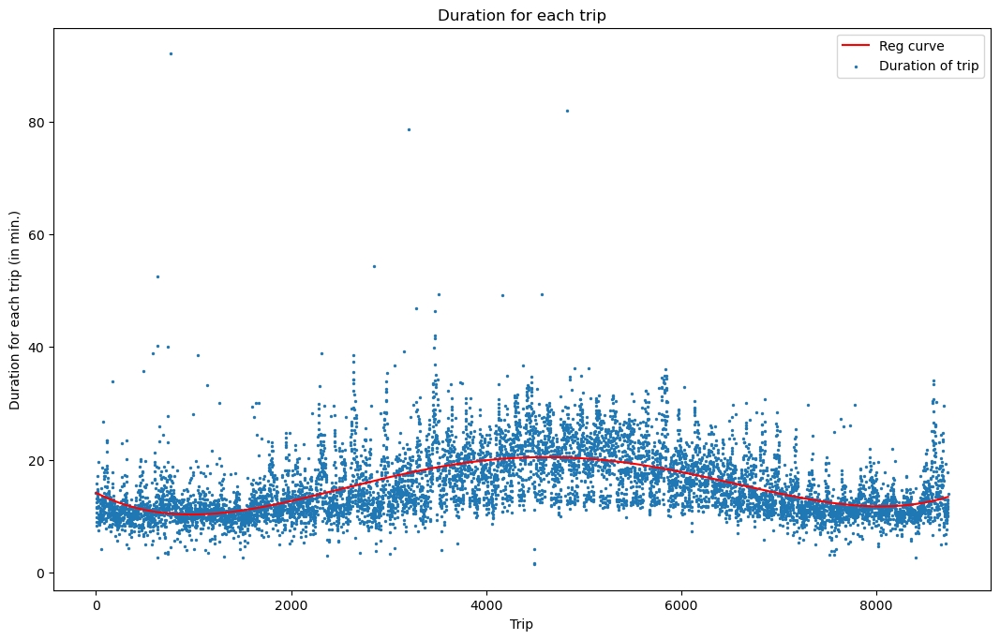

In [3]:
# First inspection of the duration data by graphical plotting

def plotDuration(data):
    # Group data by mean, otherwise to many data points for good visualization
    data_hour = data.groupby(by=["full_hour_start"]).mean()
    
    # Create figure and axes
    fig = plt.figure(figsize=(10,6),dpi = 100)
    axe = fig.add_axes([0,0,1,1])
    
    # Set x values and scatter duration
    x = (range(len(data_hour)))
    axe.scatter(x,data_hour["duration_min"], s=2, label="Duration of trip")

    # Reg curve
    polyReg = np.poly1d(np.polyfit(x, data_hour["duration_min"], 4))
    x_ = np.arange(0, len(x), 1)
    axe.plot(x_, polyReg(x_), label="Reg curve", color="red")

    # Labels
    axe.set_xlabel("Trip")
    axe.set_ylabel("Duration for each trip (in min.)")
    axe.set_title("Duration for each trip")
    
    plt.legend()
    plt.show()

# Execute method plotDuration(data=divvy_bike_set)
plotDuration(divvy_bike_set)

The graph above shows the trips on the x-axis with the corresponding durations on the y-axis. The first view reveals that most trips last between 5 min and 30 minutes. Trips shorter than 5 minutes or longer than 30 minutes are the minority. Now we have to find corresponding clusters that describe these observations and allow further conclusions.   

<br>
<i> Note:</i> A regression curve with degree four was overlaid on the data to reflect structure of the data. This helps the viewer to better understand the data. 

## 3.1.2 Application of K-Means (++) to duration as input feature

In the following we will apply the so called K-means algorithm iteratively (multiple times) to evaluate the best cluster performance. K-means works as follows: You pre-define a number of cluster centers, i.e. a number of data points. Then, the algorithm will try to find data point centres (as many as you have pre-defined) in a way, that the mean squared distance of all data points to those centres is minimized. Thus, the clusters are created based on similarity measures in terms of distance to a pre-selected number of centres and the more centres you select, the smaller will be the error. This error is measured based on the average distance of each point to its assigned cluster centre.  

At this point, we only use the trip duration as an input feature for the algorithm. The procedure is as follows: 
<ol>
    <li>The dataset is aggregated as explained in the above section (3.1.2.1). </li>
    <li>The number of clusters is determined (3.1.2.2). Here, the loss for possible cluster structures is specified and the Elbow method is applied. The Elbow point is again examined in more detail with the delta loss.    </li>
    <li>The ratio of the data points to the total number of datapoints for each cluster is calculated to further strengthen the Elbow method.  </li>
    <li>The four most interesting clusters derived from the Elbow area are visualized and compared (3.1.2.3). In the end labels are assigned.  </li>
</ol>
In addition, the Gaussian Mixture Model is applied in section 3.1.3 to show a comparison to the K-Means clustering results. 


### 3.1.2.1 Aggregation of dataset

The original bike set is copied to a specific dataframe used in the following sections for the K-Means algorithm. The data is grouped by the hour and the mean is calculated. 

In [4]:
dbs_dur = divvy_bike_set.copy()
dbs_dur = dbs_dur.groupby("full_hour_start").mean()
dbs_dur = dbs_dur.reset_index()
dbs_dur["trips"] = dbs_dur.index

### 3.1.2.2 Determination of the number of clusters

As described we calculate the loss for all possible cluster numbers. We set the maximum number of cluster to 25. 

In [5]:
# Max number of possible clusters
k_max = 25

For better clustering results, the input feature is standardized with the StandardScaler. Then the duration column will have a mean of 0 and a standard deviation of 1.   

In [6]:
# Define Standard Scaler
# Converting input feature duration so that the mean of observed values is 0 and the standard deviation is 1
standardScaler = StandardScaler()

# First fit the dataframe by computing the mean and standard deviation
# Second transform the dataframe by computing y = (x – mean) / standard_deviation
dbs_dur["duration_min_stand"] = standardScaler.fit_transform(dbs_dur[["duration_min"]])
print("Duration as input feature is standarized to mean {} with std.dev of {}".format(dbs_dur["duration_min_stand"].mean(),round(dbs_dur["duration_min_stand"].std(),3))) 

Duration as input feature is standarized to mean -9.08374692008418e-16 with std.dev of 1.0


25 different K-Means clusters are created, trained and cluster assignments are stored with the corresponding losses. 

In [7]:
clusters_dur = []
losses_dur = []
S_kmeans_dur = []
# Calculate for each number of cluster (1..25) the loss
for k in range(1,k_max+1):
    # Create kmeans model with k cluster and the classical EM-style algorithm is “full” 
    m_dur = KMeans(n_clusters=k, algorithm="full", random_state=1)
    # Fit the model with duration_min data
    m_dur.fit(dbs_dur[["duration_min_stand"]])
    # For each number of cluster, append the "inertia_" as loss
    # (sum of squared distances of samples to their closest cluster center) 
    clusters_dur.append(k)
    losses_dur.append(m_dur.inertia_)
    # Match cluster to each record in dbs_dur
    col_name = "cluster_"+str(k)
    dbs_dur[col_name] = m_dur.predict(dbs_dur[["duration_min_stand"]])
    # Calculate Silhoutte Score and append to a list (start at k=2, since gaussian also starts there)
    if k >=2:
        S_kmeans_dur.append(silhouette_score(dbs_dur[["duration_min_stand"]], dbs_dur[col_name], metric='euclidean'))

We further plot the loss to be able to determine which number of clusters seems reasonable. 

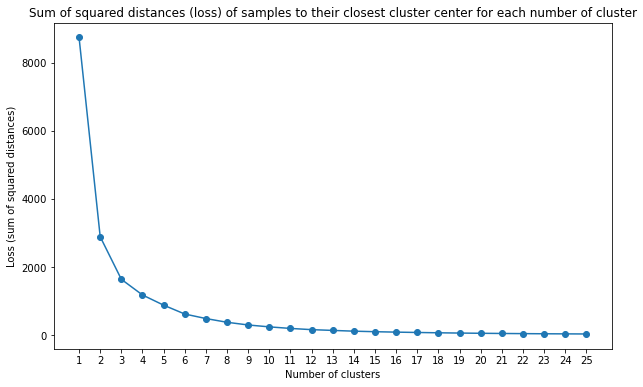

In [8]:
# Plot loss
# Create fig and axes
fig, axe = plt.subplots(nrows = 1, ncols = 1, figsize= (10,6))
# Plot cluster on x axsis and loss on y axsis
axe.plot(clusters_dur, losses_dur, 'o-',label="loss function")
# Labels
axe.set_xlabel("Number of clusters")
axe.set_ylabel("Loss (sum of squared distances)")
axe.set_title("Sum of squared distances (loss) of samples to their closest cluster center for each number of cluster")
# Set x ticks
axe.set_xticks(np.arange(1,len(clusters_dur)+1,1))
plt.show()

The above graph shows the sum of squared distances of samples to their closest cluster center. This describes the loss of the algorithm. It can be stated that the smaller the loss, the better cluster structures were found. However, one must be careful that no overfitting occurs and a too detailed splitting of the data into clusters appears. This would make the interpretation of the corresponding labels very difficult. <br> 
Consequently, the Elbow method was introduced. The method describes the procedure of choosing that number of clusters so that adding another cluster does not improve the loss much better. However, one can also deviate from this procedure, if one prefers another number of clusters with the help of domain knowledge.  <br>
Following the Elbow approach, three clusters seem to be a reasonable cluster result in our case with the input feature duration. Since the loss units on the y-axis represent relatively large units, it can be assumed that there are still significant reductions in loss between the results of 3, 4, and 5. A closer look is therefore suggested.

For a more detailed examination, the delta loss is calculated. This indicates the difference in loss between two cluster results.

In [9]:
# Calculate delta loss
losses_delta_dur = losses_dur.copy()
for i in range(1,len(losses_dur)): 
    losses_delta_dur[i-1] = losses_dur[i-1]-losses_dur[i]

<function matplotlib.pyplot.show(close=None, block=None)>

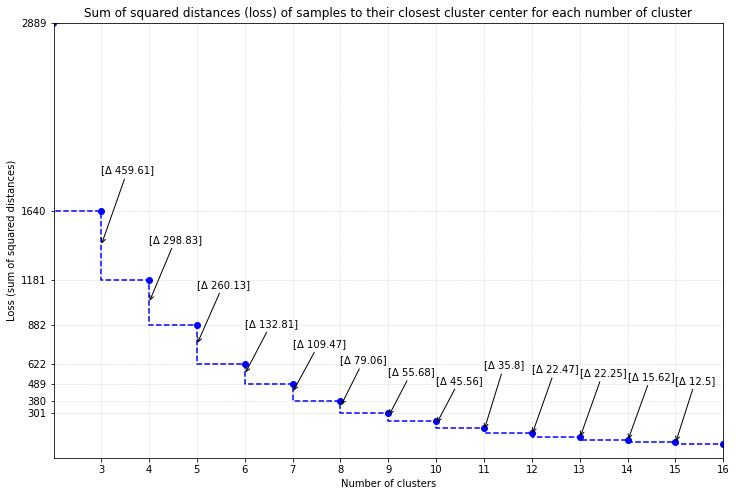

In [10]:
# Zoom into loss function (elbow) and show delta values
fig, axe = plt.subplots(nrows = 1, ncols = 1, figsize= (12,8))

# Plot losses with steps
axe.step(clusters_dur, losses_dur, "bo--")

# Label
axe.set_xlabel("Number of clusters")
axe.set_ylabel("Loss (sum of squared distances)")
axe.set_title("Sum of squared distances (loss) of samples to their closest cluster center for each number of cluster")

# Transform x and y ticks
axe.set_xticks(np.arange(3,17,1))
axe.set_yticks(losses_dur[:9])

# Set scale of y-axis and x.axis
axe.set_xlim([2.01,16])
axe.set_ylim([0,losses_dur[1]])

# Annotate with delta values
y_old=0
for i in range(2,15):
    y_pos_middle = (losses_dur[i] + losses_dur[i+1]) / 2
    axe.annotate("[\u0394 {}]".format(round(losses_delta_dur[i],2)),
                  xy=(clusters_dur[i],y_pos_middle),
                  xytext=((clusters_dur[i],losses_dur[i]+250) if i<=9 else (clusters_dur[i],y_old)),
                  fontsize=10,
                  #horizontalalignment="center",
                  arrowprops=dict(arrowstyle="->",facecolor='black') )
    if i == 9: 
        y_old = losses_dur[i]+350
    if i>=10:
        y_old = y_old - 25

plt.grid(True, linestyle=':', linewidth=0.5)
plt.show

The above graph starts at the identified Elbow point with three clusters. The delta values show that a reduction in loss of above 450 is achieved between clusters 3 and 4. Between clusters 4 and 5, a reduction of above 290 is still achieved. The significance of these values only decreases significantly from cluster 6 and onwards. Therefore, the graph clearly shows that the cluster results with 4, 5 and 6 computed clusters could also be of interest for our use case.

To get a final impression of the number of clusters, the ratio of data points in each cluster to the total number of data entries is calculated and presented graphically. 

In [11]:
# Calculate the ratio of datapoints for each cluster

origin_len = len(dbs_dur)
n_cluster = np.arange(1,len(clusters_dur)+1,1)

# colors 
c = ['#641E16', '#78281F', '#512E5F', '#4A235A', '#154360', '#1B4F72', '#0E6251', '#0B5345', '#145A32', '#186A3B', '#7D6608',
     '#7E5109', '#784212', '#6E2C00', '#7B7D7D', '#626567', '#4D5656', '#424949', '#1B2631', '#E6B0AA', '#D7BDE2', '#A9CCE3', 
     '#A3E4D7', '#F9E79F', '#EDBB99']

dict_perc = {}
dict_abs = {}
for k in range(1,len(clusters_dur)+1):
    bottom=0
    percs = []
    abss = []
    cluster_col = "cluster_"+str(k)
    for i in range(0,len(clusters_dur)):
        n_abs = len(dbs_dur[dbs_dur[cluster_col] == i])
        perc = n_abs / origin_len
        #print("Clustermodel {} contains {} cluster(s): cluster {} contains {}% (abs. {}) of all available datapoints".format(k,k,i,perc*100, n_abs))
        percs.append(perc)
        abss.append(n_abs)
        
    dict_perc[cluster_col] = percs
    dict_abs[cluster_col] = abss

# Create dataframe for percentage numbers
df_perc=pd.DataFrame.from_dict(dict_perc)
df_perc = df_perc.T
df_perc['cluster_name'] = df_perc.index

# Create dataframe for absolute numbers
df_abs=pd.DataFrame.from_dict(dict_abs)
df_abs = df_abs.T
df_abs['cluster_name'] = df_perc.index

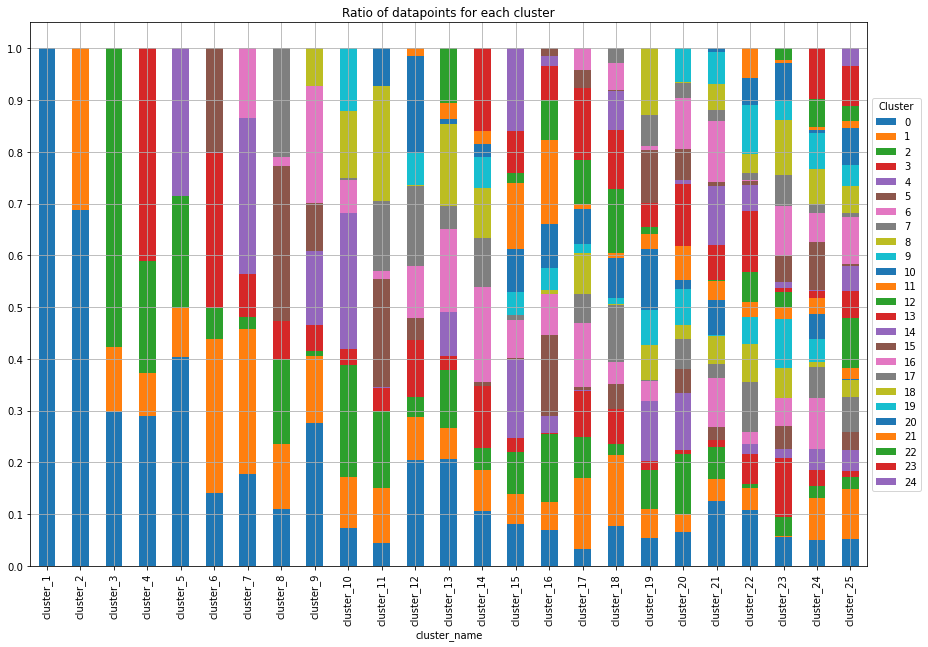

In [12]:
axe = df_perc.plot(x='cluster_name', kind='bar', stacked=True, title='Ratio of datapoints for each cluster', figsize= (15,10))
axe.set_yticks(np.arange(0,1.1,0.1))
axe.legend(title="Cluster",loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
axe.grid(True)

The barplots show how many data points were assigned to each cluster. In the case of one cluster ("cluster_1"), of course, 100 percent of the data is in that single cluster. The cluster result with 2 clusters ("cluster_2) shows that just over 30 percent were assigned to the first cluster (orange bar) and the remaining 70 percent to the second cluster (blue bar).  It seems that this 70 percent is further divided in the next cluster results ("cluster_3", "cluster_4"). The 30 percent cluster remains unchanged (blue bar for "cluster_3"). The cluster derived from the above elaborations ("cluster_3", "cluster_4", "cluster_5" and "cluster_6) also seem to show a reasonable data splitting concerning the ratio calculated here. <br>
In particular, the graph supports the decision to exclude the clusters from the result with 7 clusters onwards. From this point on each result contains at least one cluster with a very small number of assigned data points. These types of clusters obviously contain only a fraction of the total data points and can therefore be considered as irrelevant.   


### 3.1.2.3 Final plotting of four different cluster results

The final four cluster results with 3, 4, 5 and 6 clusters are plotted and interpreted.

In [13]:
# Create 4 different models
numbers = ["zero", "one", "two", "three","four","five","six","seven","eight","nine","ten", 
           "eleven", "twelve" "thirteen", "fourteen", "fifteen", "sixteen"]

# Transform integeter cluster numbers to string cluster numbers 
for k in range(1,len(numbers)):
    colName = "cluster_"+str(k)
    dbs_dur[colName] = dbs_dur[colName].apply(lambda x: numbers[x])

In [14]:
# PLOTTING METHODS

# colors 
cluster_colors = ['#C0392B', '#E74C3C', '#8E44AD', '#2980B9', '#3498DB', '#1ABC9C','#16A085', '#27AE60', 
                  '#2ECC71', '#F1C40F', '#F39C12', '#E67E22', '#D35400', '#BDC3C7', '#7F8C8D','#34495E'] 

# Plot single clustering result
def plotSingleClustering(data, n_cluster, xColumnToPlot, yColumnToPlot, figsize, xLabel,
                         yLabel, title, alphaOfContur, nColsLegend, locLegend, colors): 
    
    if len(colors) < (n_cluster): 
        colors = cluster_colors
        
    col_name = "cluster_"+str(n_cluster)
    fig, axe = plt.subplots(nrows = 1, ncols = 1, figsize= figsize, dpi=280)
    
    # Scatter each cluster
    for c in range(n_cluster): 
            axe.scatter(data[data[col_name]==numbers[c]][xColumnToPlot],data[data[col_name]==numbers[c]][yColumnToPlot], s=10, label=numbers[c],c=colors[c])
            points = data[data[col_name]==numbers[c]][[xColumnToPlot,yColumnToPlot]].values
            # get convexHull 
            hull = ConvexHull(points)
            # get x and y coordinates
            # repeat last point to close the polygon
            x_hull = np.append(points[hull.vertices,0],
                               points[hull.vertices,0][0])
            y_hull = np.append(points[hull.vertices,1],
                               points[hull.vertices,1][0])
            # plot shape
            axe.fill(x_hull, y_hull, alpha=alphaOfContur, c=colors[c])
    
    # Y-axis Stepsize of 2
    ystart, yend = axe.get_ylim()
    ystart=0
    plt.yticks(np.arange(ystart,yend,2))
    
    # Label
    axe.set_xlabel(xLabel)
    axe.set_ylabel(yLabel)
    axe.set_title(title)
    
    # Legend
    axe.legend(title=col_name, ncol=nColsLegend, loc=locLegend)

    plt.grid(True)
    #plt.show()
    return axe, plt


# Plot n clustering results
def plotNClustering(data, n_cluster, xColumnToPlot, yColumnToPlot, nrowsSubplots, ncolsSubplots, figsize, 
                    xLabel, yLabel, title, alphaOfContur, nColsLegend, locLegend, colors): 
    
    if len(colors) < max(n_cluster): 
        colors = cluster_colors
    
    # Create fig with subplots
    fig, axes = plt.subplots(nrows=nrowsSubplots, ncols=ncolsSubplots, figsize=figsize, dpi=280)
    
    # Loop through all axes
    counter=0
    for row in range(0,nrowsSubplots):
        for column in range(0,ncolsSubplots):
            axe = axes[row][column] 
            col_name = "cluster_"+str(n_cluster[counter])
            # Scatter each cluster
            for c in range(n_cluster[counter]): 
                    axe.scatter(data[data[col_name]==numbers[c]][xColumnToPlot],data[data[col_name]==numbers[c]][yColumnToPlot], s=10, label=numbers[c],c=colors[c])
                    points = data[data[col_name]==numbers[c]][[xColumnToPlot,yColumnToPlot]].values
                    # get convexHull 
                    hull = ConvexHull(points)
                    # get x and y coordinates
                    # repeat last point to close the polygon
                    x_hull = np.append(points[hull.vertices,0],
                                       points[hull.vertices,0][0])
                    y_hull = np.append(points[hull.vertices,1],
                                       points[hull.vertices,1][0])
                    # plot shape
                    axe.fill(x_hull, y_hull, alpha=alphaOfContur, c=colors[c])

            
            # Y-axis Stepsize of 2
            plt.sca(axe)
            ystart, yend = axe.get_ylim()
            ystart=0
            plt.yticks(np.arange(ystart,yend,2))

            # Label
            axe.set_xlabel(xLabel)
            axe.set_ylabel(yLabel)
            axe.set_title(title)

            # Legend
            axe.legend(title=col_name, ncol=nColsLegend, loc=locLegend)

            axe.grid(True)
            counter = counter + 1
    
    plt.show()

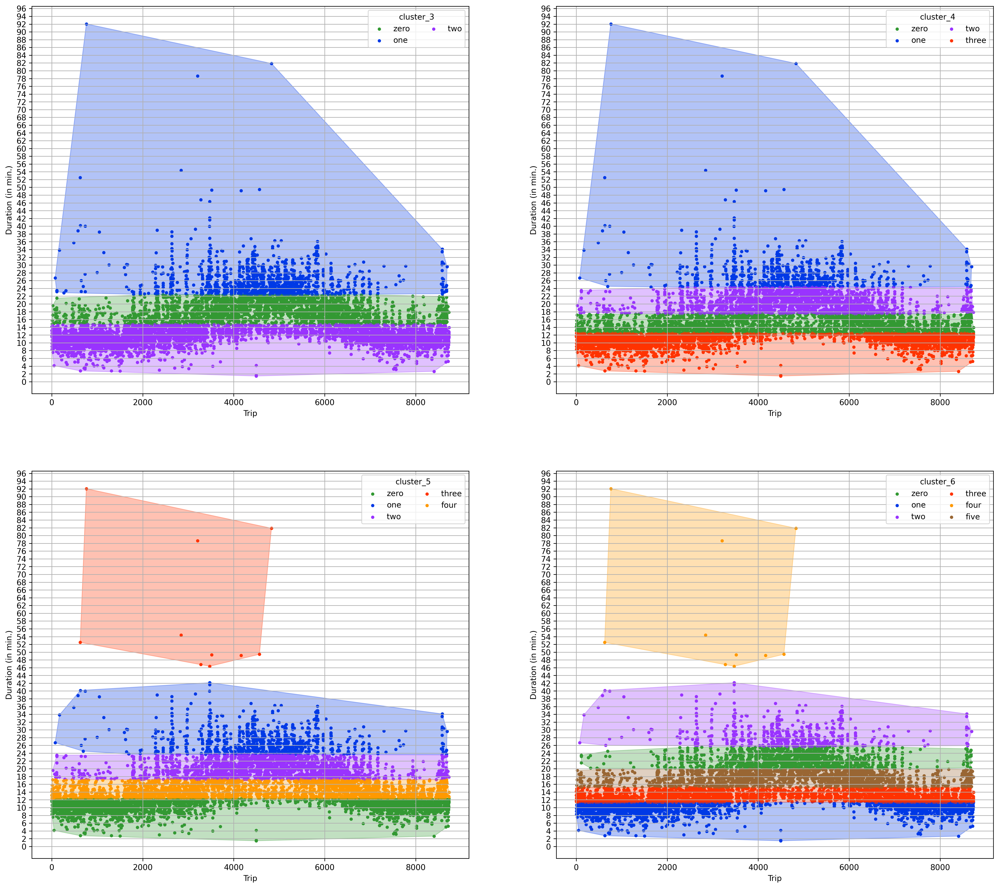

In [15]:
plotNClustering(data=dbs_dur,
                n_cluster=[3,4,5,6],
                xColumnToPlot="trips", 
                yColumnToPlot="duration_min", 
                nrowsSubplots=2, 
                ncolsSubplots=2, 
                figsize=(22,20), 
                xLabel="Trip", 
                yLabel="Duration (in min.)", 
                title="", 
                alphaOfContur=0.3, 
                nColsLegend=2, 
                locLegend="upper right",
                colors = ['#339933','#0039e6','#9933ff','#ff3300','#ff9900','#996633'])

The graphs show the cluster results for 3, 4, 5 and 6 clusters. Since only the duration was taken as input feature, horizontal segments are created for each cluster. As the number of clusters increases, these segments become more and more fine-grained.<br>

The first cluster or segment  for outcome "cluster_3" ("two") and "cluster_4" ("three") remains unchanged and shows trips with an average duration of up to 14 minutes. The core of this cluster can also be seen in the result of "cluster_5" ("zero") and "cluster_6" ("one"). Here, however, the maximum average duration has been pushed down to just under 12 minutes. It can be concluded, that this cluster is important, as it is represented in all cluster results. <br>

The upper cluster ("one") of "cluster_3" describes long trips with a travel time of just 24 minutes and longer. This segment can also be found in "cluster_4". The results in "cluster_5" and "cluster_6" are further splitting these long trips into long trips up to 42 minutes and "very long" trips starting at 46 minutes of duration time. Since this further splitting does not create any further insight, the upper cluster of "cluster_3" and "cluster_4" are describing the long trips sufficiently. <br>

Now the medium trips are missing, which last from about 14 minutes to 24 minutes. Depending on the cluster result, they are divided differently. The result "cluster_3" uses one cluster ("zero"), the result of "cluster_4" and "cluster_5" both use two clusters and "cluster_6" shows three segments. It can be debated which classification makes the most sense for our use case. For simplicity, we decide to use the result of "cluster_3".
<br><br>
In summary, the cluster result with 3 clusters describes all important ride types, combines all patterns from the other results and reflects the calculated Elbow point. Therefore it is plotted again and labels are assigned.

Text(5000, 44, 'Long trips')

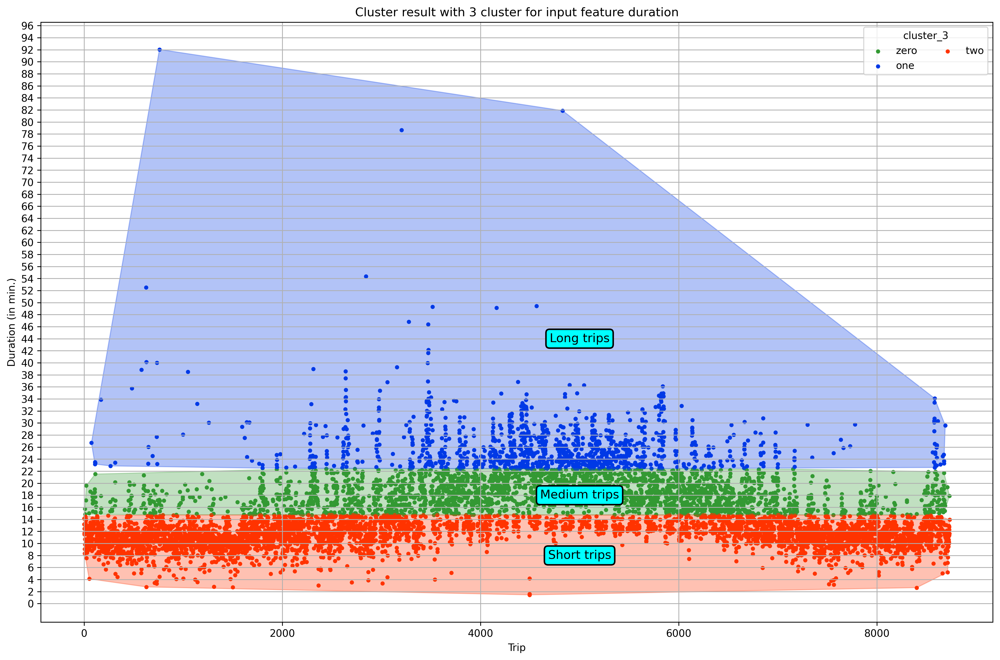

In [16]:
axe, plt = plotSingleClustering(data=dbs_dur, 
                     n_cluster=3, 
                     xColumnToPlot="trips", 
                     yColumnToPlot="duration_min", 
                     figsize=(17,11), 
                     xLabel="Trip",
                     yLabel="Duration (in min.)", 
                     title="Cluster result with 3 cluster for input feature duration", 
                     alphaOfContur=0.3, 
                     nColsLegend=2, 
                     locLegend="upper right",
                     colors = ['#339933','#0039e6','#ff3300'])

axe.text(
    5000, 8, "Short trips", ha="center", va="center", rotation=0, size=12,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))
axe.text(
    5000, 18, "Medium trips", ha="center", va="center", rotation=0, size=12,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))
axe.text(
    5000, 44, "Long trips", ha="center", va="center", rotation=0, size=12,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))

## 3.1.3 Application of Gaussian Mixture Model to duration as input feature

This algorithm is relatively difficult to understand for a non-technical audience. <a href="https://scikit-learn.org/stable/modules/mixture.html">Scikit-Learn</a> describes it as follows: "A Gaussian mixture model is a probabilistic model that assumes all the data points are generated from a mixture of a finite number of Gaussian distributions with unknown parameters. One can think of mixture models as generalizing k-means clustering to incorporate information about the covariance structure of the data as well as the centers of the latent Gaussians." 
We will use <a href="https://towardsdatascience.com/gaussian-mixture-model-clusterization-how-to-select-the-number-of-components-clusters-553bef45f6e4">GMMs</a> mainly to compare their result to the K-Means results to see if both yield (roughly) the same clusters. The Silhouette score is used to evaluate the performance of the Gaussian Mixture Model for different clusters and compare it with the performance of K-Means. 
Silhouette coefficient or silhouette score is a metric used to define the goodness of a clustering technique. Its value ranges from -1 to 1, where 1 implies that the clusters are well apart from each other, 0 indicates an indifference between clusters. The score can be calculated with the following formula 
\begin{equation}
\frac{(b-a)}{max(a,b)}
\end{equation}
where <i>a</i> describes the average intra-cluster distance (the average distance between each point within a cluster) and <i>b</i> the average inter-cluster distance (the average distance between all clusters). You can find more information at the following article of <a href="https://towardsdatascience.com/silhouette-coefficient-validating-clustering-techniques-e976bb81d10c">towardsdatascience<a>.

In the following we apply the Gaussian Mixture Model to find alternative cluster structures. At this point, we still use the trip duration as an input feature for the algorithm. The procedure is as follows:
<ol>
    <li>The dataset is aggregated (3.1.3.1). </li>
    <li>The number of clusters is determined (3.1.3.2). Here, the silhouette score for possible cluster structures is specified. 
    <li>The most interesting clusters are then plotted and compared to the results of K-Means clustering.  </li>
</ol>



### 3.1.3.1 Aggregation of dataset

The original bike set is copied to a specific dataframe used in the following sections for the K-Means algorithm. The data is grouped by the hour and the mean is calculated. 

In [17]:
dbs_dur_g = divvy_bike_set.copy()
dbs_dur_g = dbs_dur_g.groupby("full_hour_start").mean()
dbs_dur_g = dbs_dur_g.reset_index()
dbs_dur_g["trips"] = dbs_dur_g.index

### 3.1.3.2 Determination of the number of clusters

For better clustering results, the input feature is standardized with the StandardScaler. Then the duration column will have a mean of 0 and a standard deviation of 1.  

In [18]:
# Define Standard Scaler
# Converting input feature duration so that the mean of observed values is 0 and the standard deviation is 1
standardScaler = StandardScaler()

# First fit the dataframe by computing the mean and standard deviation
# Second transform the dataframe by computing y = (x – mean) / standard_deviation
dbs_dur_g[["duration_min_stand"]] = standardScaler.fit_transform(dbs_dur_g[["duration_min"]])
print("Duration as input feature is standarized to mean {} with std.dev of {}".format(round(dbs_dur_g["duration_min_stand"].mean(),3),round(dbs_dur_g["duration_min_stand"].std(),3))) 
#print("Temperature as input feature is standarized to mean {} with std.dev of {}".format(round(dbs_durTemp["max_temp_stand"].mean(),3),round(dbs_durTemp["max_temp_stand"].std(),3))) 

Duration as input feature is standarized to mean -0.0 with std.dev of 1.0


In the following we calculate the loss (loss here silhouette score) for all possible cluster numbers. We set the maximum number of cluster to 25. 

In [19]:
# Max number of clusters 
k_max = 25

25 different clusters are created, trained and cluster assignments are stored with the corresponding silhouette score. 

In [20]:
# Step between number of clusterings
steps = 1

# Silhouette score
S_dur =[]

for k in (np.arange(2,k_max+steps,steps)):
    # training gaussian mixture model 
    gmm = GaussianMixture(n_components=k, random_state=10)
    gmm.fit(dbs_dur_g[["duration_min_stand"]])

    #predictions from gmm
    col_name = "cluster_"+str(k)
    dbs_dur_g[col_name] = gmm.predict(dbs_dur_g[["duration_min_stand"]])
    
    # Calculate Silhoutte Score and append to a list
    S_dur.append(silhouette_score(dbs_dur_g[["duration_min_stand"]], dbs_dur_g[col_name], metric='euclidean'))

We further plot the score to be able to determine which number of clusters seems reasonable. We also compare the score to the silhouette score of the K-Means results from above.

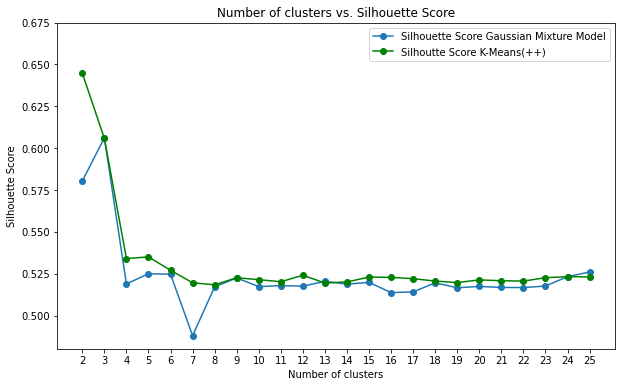

In [21]:
# Plot silhouette score

# Create fig and axes
fig, axe = plt.subplots(nrows = 1, ncols = 1, figsize= (10,6))

# Plot cluster on x axsis and score on y axsis
axe.plot(np.arange(2,k_max+steps,steps), S_dur, 'o-',label="Silhouette Score Gaussian Mixture Model")
axe.plot(np.arange(2,k_max+steps,steps), S_kmeans_dur, 'go-',label="Silhoutte Score K-Means(++)")

# Labels
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Number of clusters vs. Silhouette Score')
# Set x ticks
axe.set_xticks(np.arange(2,k_max+steps,steps))
axe.set_yticks(np.arange(0.5,0.7,0.025))
axe.legend()
plt.show()

Both silhouette scores range from 0.5 to 0.65. In the beginning for a small number of clusters, the silhouette scores show their highest values. Both scores settle then at a value of 0.525. Here it is important to state that there is relatively no difference between K-Means and Gaussian Mixture models for the number of clusters greater than 7. This is consistent with the findings from above that a number of clusters greater than 6 are not adding additional useful information.
The highest value for the Gaussian Mixture model is for 3 clusters, which would also represent the elbow point for the K-Means results. A number of 6 clusters also seems reasonable, as this represents the highest value after the score collapsed. 
As conclusion 3 clusters or 6 clusters are reasonable cluster results for the Gaussian Mixture procedure. We will plot these two clusters in the following. For the purpose of comparability with K-Means, we will also show the results with 4 and 5 clusters. 

### 3.1.3.3 Final plotting of four cluster results

The final four cluster results with 3, 4, 5 and 6 clusters are plotted and interpreted.

In [22]:
numbers = ["zero", "one", "two", "three","four","five","six","seven","eight","nine","ten", 
           "eleven", "twelve" "thirteen", "fourteen", "fifteen", "sixteen"]

# Match cluster with labels from numbers[]
for i in range(2,len(numbers)+1):
    col_name="cluster_"+str(i)
    dbs_dur_g[col_name] = dbs_dur_g[col_name].apply(lambda x: numbers[x])

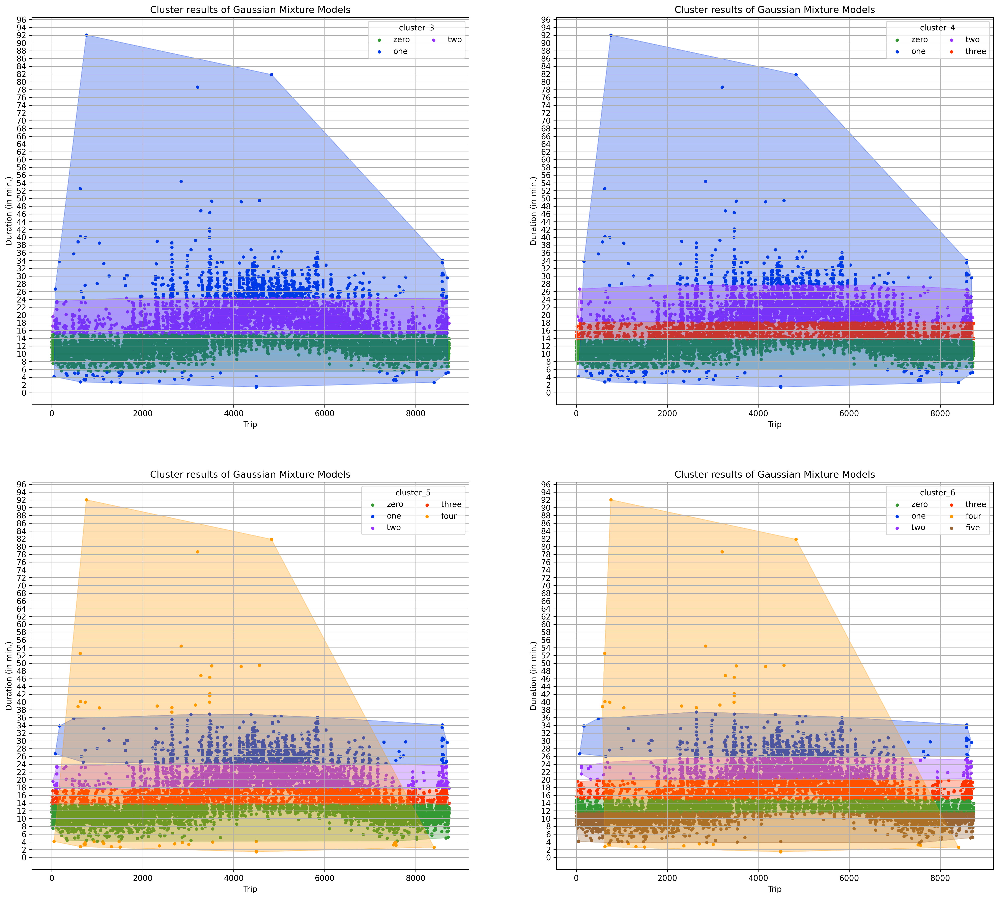

In [23]:
plotNClustering(data=dbs_dur_g,
                n_cluster=[3,4,5,6],
                xColumnToPlot="trips", 
                yColumnToPlot="duration_min", 
                nrowsSubplots=2, 
                ncolsSubplots=2, 
                figsize=(22,20), 
                xLabel="Trip", 
                yLabel="Duration (in min.)", 
                title="Cluster results of Gaussian Mixture Models", 
                alphaOfContur=0.3, 
                nColsLegend=2, 
                locLegend="upper right",
                colors = ['#339933','#0039e6','#9933ff','#ff3300','#ff9900','#996633'])

The graphs show the cluster results for 3, 4, 5 and 6 clusters. Since only the duration was taken as input feature, horizontal segments are also created for each cluster with the Gaussian Mixture procedure. As the number of clusters increases, these segments become more and more fine-grained.<br>

In general, very similar patterns to the results with K-Means can be seen. There is a short trips segment in each result, which shows trips between 6 up to 14 minutes. Medium trips can also be seen, which are divided into one, two or three segments depending on the number of clusters. 

One difference that is immediately noticeable is the cluster that contains both very long trips and very short trips (e.g. blue cluster "one" for "cluster_3"). This cluster - in a slightly different form - can be seen in every result. This cluster shows a new perspective on the data. It marks the extremes in terms of trip times (very long and short). It shifts attention to the two middle clusters (6-16, 16-24), which clearly contain the most data points. The cluster result with three clusters is also selected here as the final cluster. It complements well the result of K-Means with the additional marking of the extrema. 

Text(5000, 44, 'Extreme trips (very short or long)')

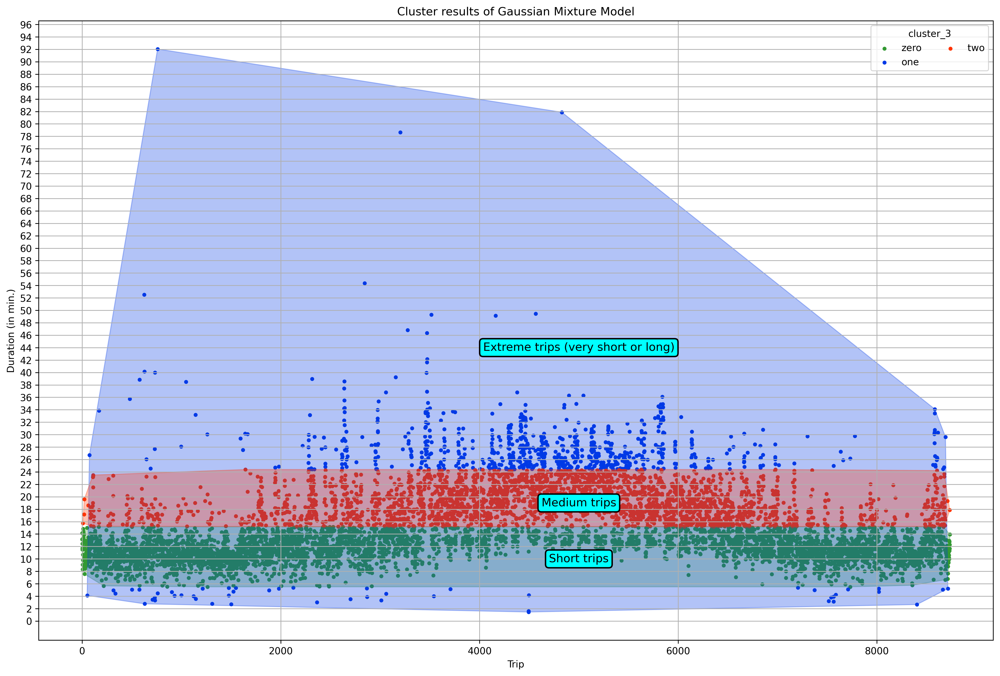

In [24]:
axe, plt = plotSingleClustering(data=dbs_dur_g, 
                     n_cluster=3, 
                     xColumnToPlot="trips", 
                     yColumnToPlot="duration_min", 
                     figsize=(18,12), 
                     xLabel="Trip",
                     yLabel="Duration (in min.)", 
                     title="Cluster results of Gaussian Mixture Model", 
                     alphaOfContur=0.3, 
                     nColsLegend=2, 
                     locLegend="upper right",
                     colors = ['#339933','#0039e6','#ff3300'])
axe.text(
    5000, 10, "Short trips", ha="center", va="center", rotation=0, size=12,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))
axe.text(
    5000, 19, "Medium trips", ha="center", va="center", rotation=0, size=12,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))
axe.text(
    5000, 44, "Extreme trips (very short or long)", ha="center", va="center", rotation=0, size=12,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))

# 3.2 Clustering of duration and temperature

## 3.2.1 First inspection of the duration and weather data by graphical plotting

After the already seen initial inspection of the data with regard to duration as input feature for a possible clustering, it quickly became clear that an aggregation is necessary. This is also the case for a clustering with regard to duration and temperatue as input features. 

As above, we would like to refer to the mean duration of each available hour to one 'trip'. A 'trip' thus describes the average of the duration times of a specific hour. 

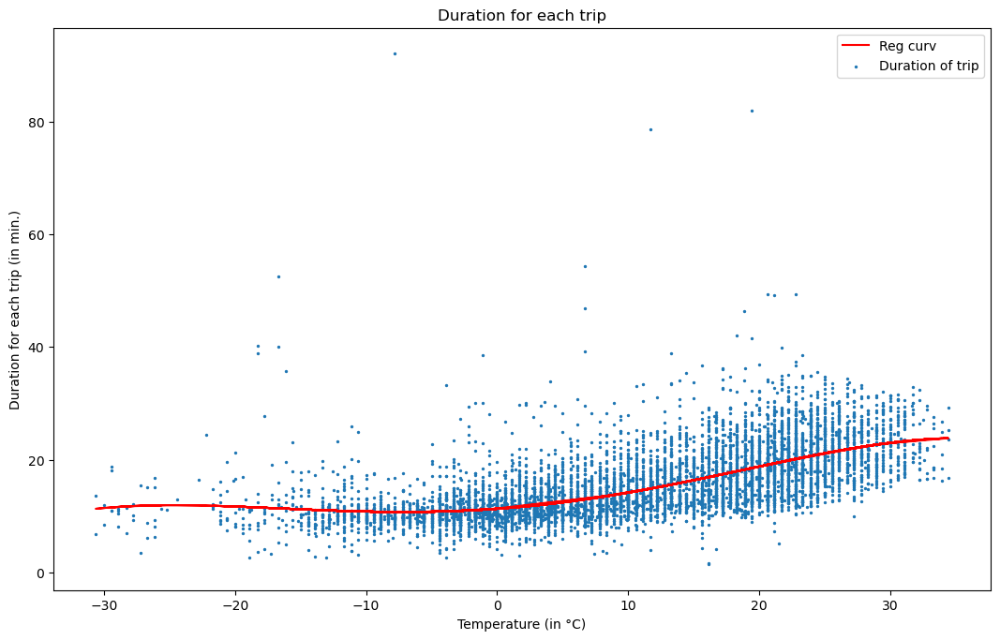

In [25]:
# First inspection of the duration data by graphical plotting

def plotDurationWeather(data):
    # Group data by mean, otherwise to many data points for good visualization
    data_hour = data.groupby(by=["full_hour_start"]).mean()
    
    # Create figure and axes
    fig = plt.figure(figsize=(10,6),dpi = 100)
    axe = fig.add_axes([0,0,1,1])
    
    # Set x values and scatter duration
    axe.scatter(data_hour["max_temp"],data_hour["duration_min"], s=2, label="Duration of trip")

    # Reg curve
    polyReg = np.poly1d(np.polyfit(data_hour["max_temp"], data_hour["duration_min"], 4))
    #x_ = np.arange(0, len(data_hour["max_temp"]), 1)
    axe.plot(data_hour["max_temp"], polyReg(data_hour["max_temp"]), label="Reg curv", color="red")

    # Labels
    axe.set_xlabel("Temperature (in °C)")
    axe.set_ylabel("Duration for each trip (in min.)")
    axe.set_title("Duration for each trip")
    
    plt.legend()
    plt.show()

# Execute method plotDuration(data=divvy_bike_set)
plotDurationWeather(divvy_bike_set)

The graph above shows the trips on the x-axis with the corresponding durations on the y-axis. The first view reveals that there are less trips if the temperatues are cold (<0 degree) and more trips (short and long duration) if the temperatues are above 0 degree.
<br>
<i> Note:</i> A regression curve with degree four was overlaid on the data to reflect the structure of the data. This helps the viewer to better understand the data. 

## 3.2.2 Application of K-Means (++) to duration and temperature as input features

In the following we apply the K-Means clustering algorithm to find appropriate cluster structures. Now we add the temperature as a second input feature for the algorithm. The procedure remains the same as in section 3.1.2: 
<ol>
    <li>The dataset is aggregated as explained in the above section (3.2.2.1). </li>
    <li>The number of clusters is determined (3.2.2.2). Here, the loss for possible cluster structures is specified and the Elbow method is applied. The Elbow point is again examined in more detail with the delta loss.    </li>
    <li>The ratio of the data points to the total number of datapoints for each cluster is calculated to further strengthen the Elbow method.  </li>
    <li>The four most interesting clusters derived from the Elbow area are visualized and compared (3.2.2.3). In the end labels are assigned.  </li>
</ol>
In addition, the Gaussian Mixture Model is applied in section 3.2.3 to show a comparison to the K-Means clustering results.

### 3.2.2.1 Aggregation of data

The original bike set is copied to a specific dataframe used in the following sections for the K-Means algorithm. The data is grouped by the hour and the mean is calculated.

In [26]:
dbs_durTemp = divvy_bike_set.copy()
dbs_durTemp = dbs_durTemp.groupby("full_hour_start").mean()
dbs_durTemp = dbs_durTemp.reset_index()
dbs_durTemp["trips"] = dbs_durTemp.index

### 3.2.2.2 Determination of the number of clusters

In the following we calculate the loss for all possible cluster numbers. We set the maximum number of cluster to 25. 

In [27]:
# Max number of possible clusters
k_max = 25

For better clustering results, the input features are standardized with the StandardScaler.Then the duration and max_temp column will have a mean of 0 and a standard deviation of 1.  

In [28]:
# Define Standard Scaler
# Converting input feature duration so that the mean of observed values is 0 and the standard deviation is 1
standardScaler = StandardScaler()

# First fit the dataframe by computing the mean and standard deviation
# Second transform the dataframe by computing y = (x – mean) / standard_deviation
dbs_durTemp[["duration_min_stand","max_temp_stand"]] = standardScaler.fit_transform(dbs_durTemp[["duration_min","max_temp"]])
print("Duration as input feature is standarized to mean {} with std.dev of {}".format(round(dbs_durTemp["duration_min_stand"].mean(),3),round(dbs_durTemp["duration_min_stand"].std(),3))) 
print("Temperature as input feature is standarized to mean {} with std.dev of {}".format(round(dbs_durTemp["max_temp_stand"].mean(),3),round(dbs_durTemp["max_temp_stand"].std(),3))) 

Duration as input feature is standarized to mean -0.0 with std.dev of 1.0
Temperature as input feature is standarized to mean -0.0 with std.dev of 1.0


25 different K-Means clusters are created, trained and cluster assignments are stored with the corresponding losses. 

In [29]:
clusters_durTemp = []
losses_durTemp = []
S_kmeans_durTemp = []
# Calculate for each number of cluster (1..25) the loss
for k in range(1,k_max+1):
    # Create kmeans model with k cluster and the classical EM-style algorithm is “full” 
    m_durTemp = KMeans(n_clusters=k, algorithm="full", random_state=1)
    # Fit the model with duration_min data
    m_durTemp.fit(dbs_durTemp[["duration_min_stand","max_temp_stand"]])
    # For each number of cluster, append the "inertia_" as loss
    # (sum of squared distances of samples to their closest cluster center) 
    clusters_durTemp.append(k)
    losses_durTemp.append(m_durTemp.inertia_)
    # Match cluster to each record in dbs_durTemp
    col_name = "cluster_"+str(k)
    dbs_durTemp[col_name] = m_durTemp.predict(dbs_durTemp[["duration_min_stand","max_temp_stand"]])
    # Calculate Silhoutte Score and append to a list (start at k=2, since gaussian also starts there)
    if k >1:
        S_kmeans_durTemp.append(silhouette_score(dbs_durTemp[["duration_min_stand","max_temp_stand"]], dbs_durTemp[col_name], metric='euclidean'))

We further plot the loss to be able to determine which number of clusters seems reasonable. 

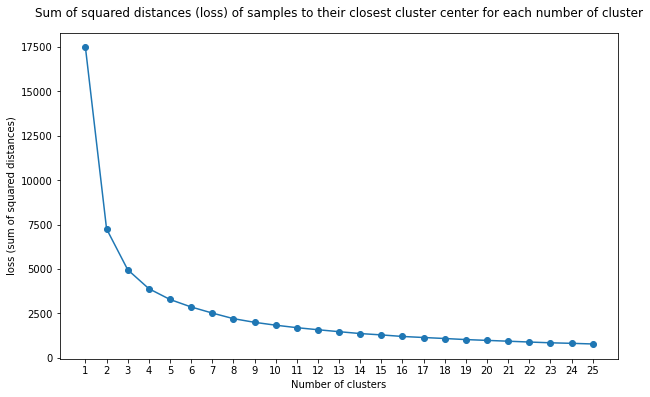

In [30]:
# Plot loss
# Create fig and axes
fig, axe = plt.subplots(nrows = 1, ncols = 1, figsize= (10,6))
# Plot cluster on x axsis and loss on y axsis
axe.plot(clusters_durTemp, losses_durTemp,"o-", label="loss function")
# Labels
axe.set_xlabel("Number of clusters")
axe.set_ylabel("loss (sum of squared distances)")
axe.set_title("Sum of squared distances (loss) of samples to their closest cluster center for each number of cluster",y=1.03)
# Set x ticks
axe.set_xticks(np.arange(1,len(clusters_durTemp)+1,1))
plt.show()

The above graph and the Elbow method was already introduced in section 3.1.2.2.
Following the Elbow approach, three clusters seem to be a reasonable cluster result in our case with the input features duration and temperature. Similar to section 3.1.2.2. the loss units on the y-asis represent relatively large numbers. It can be assumed that there are sill significant reductions in loss between the cluster results 4, 5 and 6. A closer look is therefore also suggested.


For a more detailed examination, the delta loss is calculated. This indicates the difference in loss between two cluster results.

In [31]:
# Calculate delta loss
losses_durTemp_delta = losses_durTemp.copy()
for i in range(1,len(losses_durTemp)): 
    losses_durTemp_delta[i-1] = losses_durTemp[i-1]-losses_durTemp[i]

<function matplotlib.pyplot.show(close=None, block=None)>

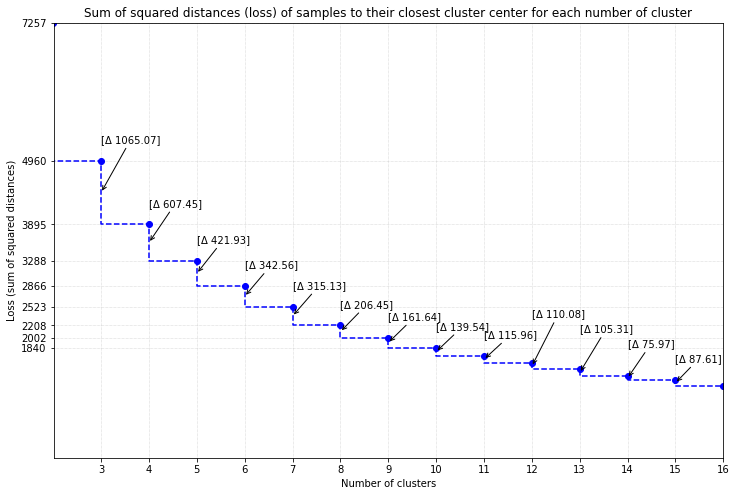

In [32]:
# Zoom into loss function (elbow) and show delta values
fig, axe = plt.subplots(nrows = 1, ncols = 1, figsize= (12,8))

# Plot losses with steps
axe.step(clusters_durTemp, losses_durTemp, "bo--")

# Label
axe.set_xlabel("Number of clusters")
axe.set_ylabel("Loss (sum of squared distances)")
axe.set_title("Sum of squared distances (loss) of samples to their closest cluster center for each number of cluster")

# Transform x and y ticks
axe.set_xticks(np.arange(3,17,1))
axe.set_yticks(losses_durTemp[:10])

# Set scale of y-axis and x.axis
axe.set_xlim([2.01,16])
axe.set_ylim([0,losses_durTemp[1]])

# Annotate with delta values
y_old=0
for i in range(2,15):
    y_pos_middle = (losses_durTemp[i] + losses_durTemp[i+1]) / 2
    axe.annotate("[\u0394 {}]".format(round(losses_durTemp_delta[i],2)),
                  xy=(clusters_durTemp[i],y_pos_middle),
                  xytext=((clusters_durTemp[i],losses_durTemp[i]+300) if i<=10 else (clusters_durTemp[i],y_old)),
                  fontsize=10,
                  arrowprops=dict(arrowstyle="->",facecolor='black') )
    if i == 10: 
        y_old = losses_durTemp[i]+900
    if i>=10:
        y_old = y_old - 250

plt.grid(True, linestyle=':', linewidth=0.5)
plt.show

The above graph starts at the identified Elbow point with three clusters. The delta values show that the reduction in loss is still relevant between the cluster result with 3 and 4 clusters and 4 and 5 clusters. Therefore we derive the same conclusion as in the previous section with only duration as input feature. Cluster results with 3, 4, 5 and 6 clusters are of intereset for our use case. 

To get a final impression of the number of clusters, the ratio of data points in each cluster to the total number of data entries is calculated and presented graphically. 

In [33]:
# Calculate the ratio of datapoints for each cluster

origin_len = len(dbs_durTemp)
n_cluster = np.arange(1,len(clusters_durTemp)+1,1)

# colors 
c = ['#641E16', '#78281F', '#512E5F', '#4A235A', '#154360', '#1B4F72', '#0E6251', '#0B5345', '#145A32', '#186A3B', '#7D6608',
     '#7E5109', '#784212', '#6E2C00', '#7B7D7D', '#626567', '#4D5656', '#424949', '#1B2631', '#E6B0AA', '#D7BDE2', '#A9CCE3', 
     '#A3E4D7', '#F9E79F', '#EDBB99']

dict_perc_durTemp = {}
dict_abs_durTemp = {}
for k in range(1,len(clusters_durTemp)+1):
    bottom=0
    percs = []
    abss = []
    cluster_col = "cluster_"+str(k)
    for i in range(0,len(clusters_durTemp)):
        n_abs = len(dbs_durTemp[dbs_durTemp[cluster_col] == i])
        perc = n_abs / origin_len
        #print("Clustermodel {} contains {} cluster(s): cluster {} contains {}% (abs. {}) of all available datapoints".format(k,k,i,perc*100, n_abs))
        percs.append(perc)
        abss.append(n_abs)
        
    dict_perc_durTemp[cluster_col] = percs
    dict_abs_durTemp[cluster_col] = abss

# Create dataframe for percentage numbers
df_perc_durTemp=pd.DataFrame.from_dict(dict_perc_durTemp)
df_perc_durTemp = df_perc_durTemp.T
df_perc_durTemp['cluster_name'] = df_perc_durTemp.index

# Create dataframe for absolute numbers
df_abs_durTemp=pd.DataFrame.from_dict(dict_abs_durTemp)
df_abs_durTemp = df_abs_durTemp.T
df_abs_durTemp['cluster_name'] = df_perc_durTemp.index

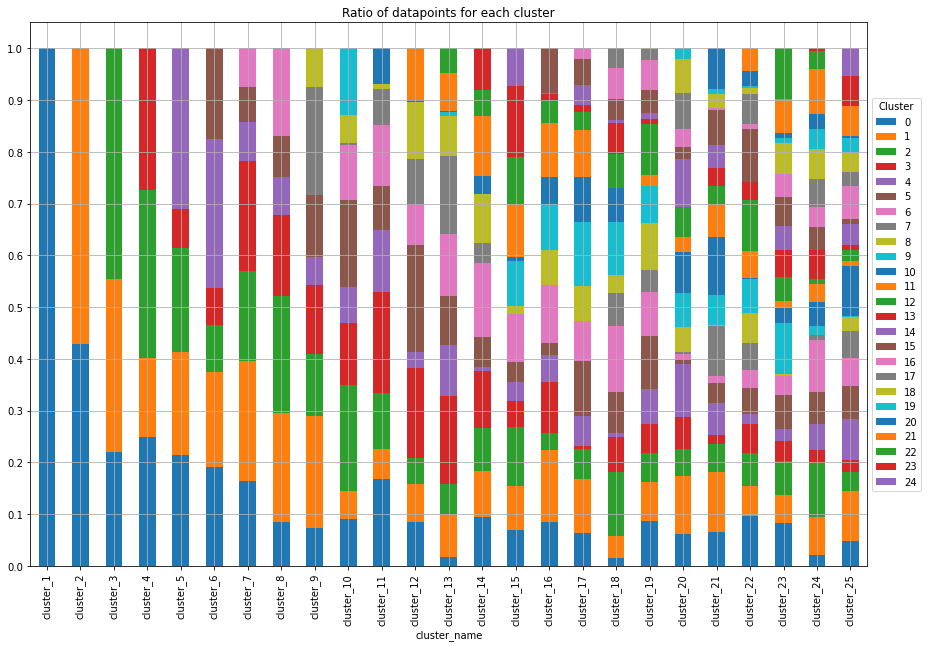

In [34]:
axe = df_perc_durTemp.plot(x='cluster_name', kind='bar', stacked=True, title='Ratio of datapoints for each cluster', figsize= (15,10))
axe.set_yticks(np.arange(0,1.1,0.1))
axe.legend(title="Cluster",loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
axe.grid(True)

The barplots show how many data points were assigned to each cluster. In the case of one cluster ("cluster_1"), of course, 100 percent of the data is in that single cluster. The cluster result with 2 clusters ("cluster_2) shows that slighty 45 percent of data is assigned to the blue cluster and 55 percent to the orange cluster.
The more clusters are assigned, the chances are increasing concerning clusters with only a very small amount of assigned data points. These cluster results seem not reasonable as cluster with a low single-digit percentage are irrelvant for appropriate interpretations.
This strenghten the above findings of choosing a cluster result with 3 clusters up to 6 clusters. 

### 3.2.2.3 Final Plotting of 4 different clusters

The final four cluster results with 3, 4, 5 and 6 clusters are plotted and interpreted.

In [35]:
# Create 4 different models
numbers = ["zero", "one", "two", "three","four","five","six","seven","eight","nine","ten", 
           "eleven", "twelve" "thirteen", "fourteen", "fifteen", "sixteen"]

for k in range(1,len(numbers)):
    colName = "cluster_"+str(k)
    dbs_durTemp[colName] = dbs_durTemp[colName].apply(lambda x: numbers[x])

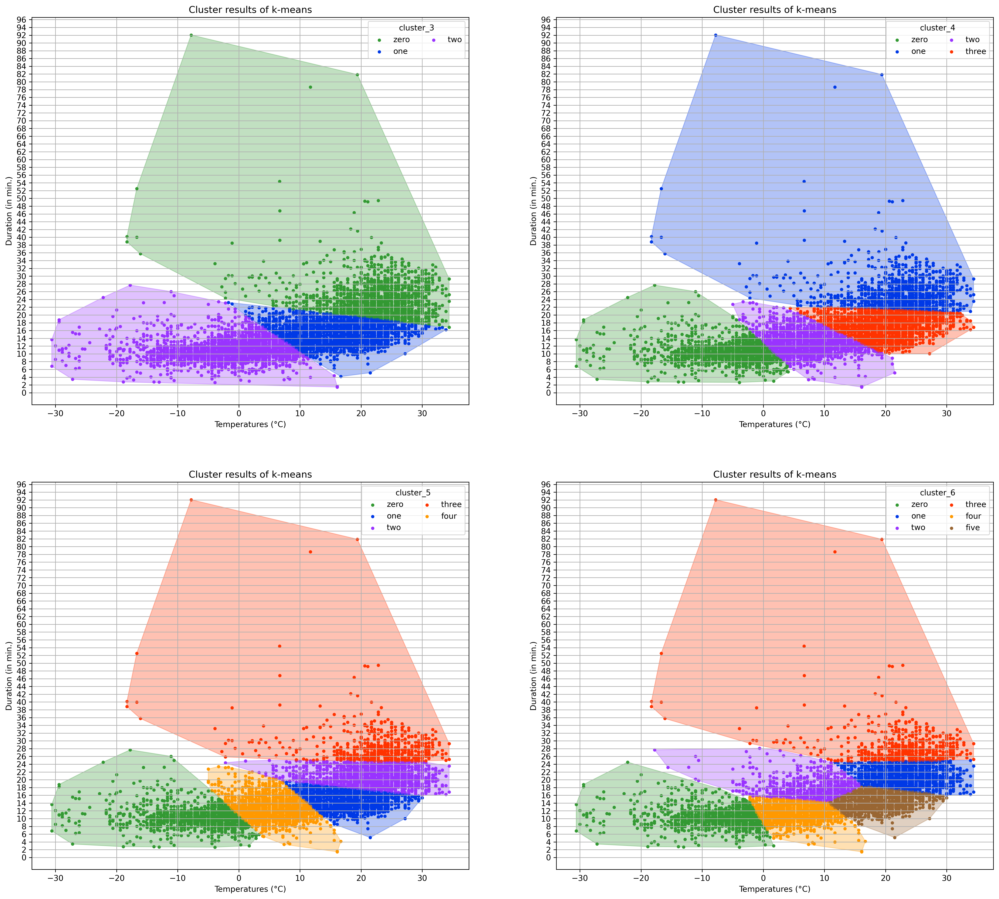

In [36]:
plotNClustering(data=dbs_durTemp,
                n_cluster=[3,4,5,6],
                xColumnToPlot="max_temp", 
                yColumnToPlot="duration_min", 
                nrowsSubplots=2, 
                ncolsSubplots=2, 
                figsize=(22,20), 
                xLabel="Temperatures (°C)", 
                yLabel="Duration (in min.)", 
                title="Cluster results of k-means", 
                alphaOfContur=0.3, 
                nColsLegend=2, 
                locLegend="upper right", 
                colors = ['#339933','#0039e6','#9933ff','#ff3300','#ff9900','#996633'])

The graphs show the cluster results for 3, 4, 5 and 6 clusters.

The cluster at the left bottom corner can be identified in all four cluster results. It describes trips with temperatures below zero degree and trip durations lasting up to 28 minutes. Taking previous insights concerning trip durations into account, this cluster combines short and medium trips in one cluster. 

The long trip duration cluster of the last section can also be found here in all four cluster results. It is mainly influenced by high temperatures (>15 degree) and is positioned in the upper right corner (e.g. red cluster "three" for "cluster_5" or "cluster_6"). 

Trips that are not assigned to the cluster in the upper right corner or lower left corner are located between these two clusters. Depending on the number of clusters, these trips are grouped into one, two, three or four clusters. Following the Elbow method, one would choose the cluster result with 3 clusters ("cluster_3") and assign all these trips to a single cluster (blue cluster "one" in "cluster_3" result). However, this assignment seems too superficial. A nice division can be reached with the result "cluster_6", where you can differentiate trips with low temperatures (< 0 °C), medium temperatues (< 15 °C), high temperatures (> 15 °C), short trip durations (< 16 min.), medium trip durations (< 26 min.) and log trip durations (> 24 min.). Therefore it is plotted in the following again with assigend labels combining trip durations and temperatures.  

Text(23, 20, 'Medium trip durations \n with high  temperatures (> 15 °C)')

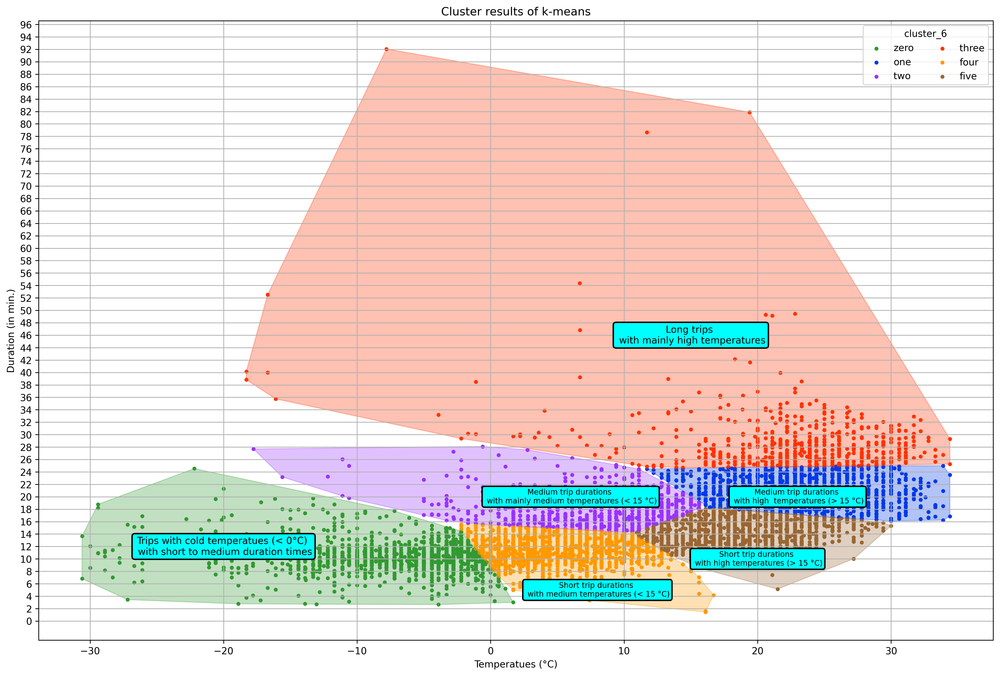

In [37]:
axe, plt = plotSingleClustering(data=dbs_durTemp, 
                     n_cluster=6, 
                     xColumnToPlot="max_temp", 
                     yColumnToPlot="duration_min", 
                     figsize=(18,12), 
                     xLabel="Temperatues (°C)",
                     yLabel="Duration (in min.)", 
                     title="Cluster results of k-means", 
                     alphaOfContur=0.3, 
                     nColsLegend=2, 
                     locLegend="upper right", 
                     colors = ['#339933','#0039e6','#9933ff','#ff3300','#ff9900','#996633'])
axe.text(
    15, 46, "Long trips \n with mainly high temperatures", ha="center", va="center", rotation=0, size=10,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))
axe.text(
    -20, 12, "Trips with cold temperatues (< 0°C) \n with short to medium duration times", ha="center", va="center", rotation=0, size=10,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))
axe.text(
    8, 5, "Short trip durations \n with medium temperatures (< 15 °C)", ha="center", va="center", rotation=0, size=8,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))
axe.text(
    6, 20, "Medium trip durations \n with mainly medium temperatures (< 15 °C)", ha="center", va="center", rotation=0, size=8,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))
axe.text(
    20, 10, "Short trip durations \n with high temperatures (> 15 °C)", ha="center", va="center", rotation=0, size=8,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))
axe.text(
    23, 20, "Medium trip durations \n with high  temperatures (> 15 °C)", ha="center", va="center", rotation=0, size=8,
    bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5))

| Cluster | Long trip durations (>24) | Medium trip durations (>16) | Short trip durations (<16) | Low temperatures (<0) | Medium temperatures (<15) | High temperatures (>15) |
| :-:   | :-: | :-: | :-: | :-: | :-: | :-: |
| zero  | -   | X   | X   | X   | -   | - |
| one   | -   | X   | -   | -   | -   | X |
| two   | -   | X   | -   | -   | X   | - |
| three | X   | -   | -   | -   | -   | X |
| four  | -   | -   | X   | -   | X   | - |
| five  | -   | -   | X   | -   | -   | X |


## 3.2.3 Application of Gaussian Mixture Model to duration and temperature as input features

In the following we apply the Gaussian Mixture Model to find alternative cluster structures. At this point, we still use the trip duration and temperature as input features for the algorithm. The procedure is as follows:
<ol>
    <li>The dataset is aggregated (3.2.3.1). </li>
    <li>The number of clusters is determined (3.2.3.2). Here, the silhouette score for possible cluster structures is specified. 
    <li>The four most interesting clusters are then plotted and compared to the results of K-Means clustering.  </li>
</ol>

In general Gaussian Mixture models are useful in situations where clusters have an “elliptical” shape. While K-Means only use means (centroids) to find clusters, GMMs also include variance/covariance. This is exactly what gives GMMs an advantage over K-Means when identifying non-circular clusters. This characteristic could make it useful for our current cluster problem, since one can certainly detect longitudinal elliptical structures in the direction of high temperature values in the temperature/duration data.

### 3.2.3.1 Aggregation of dataset

The original bike set is copied to a specific dataframe used in the following sections for the K-Means algorithm. The data is grouped by the hour and the mean is calculated. 

In [38]:
dbs_durTemp_g = divvy_bike_set.copy()
dbs_durTemp_g = dbs_durTemp_g.groupby("full_hour_start").mean()
dbs_durTemp_g = dbs_durTemp_g.reset_index()
dbs_durTemp_g["trips"] = dbs_durTemp_g.index

### 3.2.3.2 Determination of the number of clusters

For better clustering results, the input feature is standardized with the StandardScaler. Then the duration column will have a mean of 0 and a standard deviation of 1. 

In [39]:
# Define Standard Scaler
# Converting input feature duration so that the mean of observed values is 0 and the standard deviation is 1
standardScaler = StandardScaler()

# First fit the dataframe by computing the mean and standard deviation
# Second transform the dataframe by computing y = (x – mean) / standard_deviation
dbs_durTemp_g[["duration_min_stand","max_temp_stand"]] = standardScaler.fit_transform(dbs_durTemp_g[["duration_min","max_temp"]])
print("Duration as input feature is standarized to mean {} with std.dev of {}".format(round(dbs_durTemp_g["duration_min_stand"].mean(),3),round(dbs_durTemp_g["duration_min_stand"].std(),3))) 
print("Temperature as input feature is standarized to mean {} with std.dev of {}".format(round(dbs_durTemp_g["max_temp_stand"].mean(),3),round(dbs_durTemp_g["max_temp_stand"].std(),3))) 

Duration as input feature is standarized to mean -0.0 with std.dev of 1.0
Temperature as input feature is standarized to mean -0.0 with std.dev of 1.0


In the following we calculate the loss (loss here silhouette score) for all possible cluster numbers. We set the maximum number of cluster to 25.

In [40]:
# Max number of clusters 
k_max = 25

25 different clusters are created, trained and cluster assignments are stored with the corresponding silhouette score.

In [41]:
# Step between number of clusterings
steps = 1

# Silhouette score
S_durTemp =[]

for k in (np.arange(2,k_max+steps,steps)):    
    # training gaussian mixture model 
    gmm = GaussianMixture(n_components=k, random_state=2)
    gmm.fit(dbs_durTemp_g[["duration_min_stand","max_temp_stand"]])

    #predictions from gmm
    col_name = "cluster_"+str(k)
    dbs_durTemp_g[col_name] = gmm.predict(dbs_durTemp_g[["duration_min_stand","max_temp_stand"]])
    
    # Calculate Silhoutte Score and append to a list
    S_durTemp.append(silhouette_score(dbs_durTemp_g[["duration_min_stand","max_temp_stand"]], dbs_durTemp_g[col_name], metric='euclidean'))

We further plot the score to be able to determine which number of clusters seems reasonable. We also compare the score to the silhouette score of the K-Means results from above.

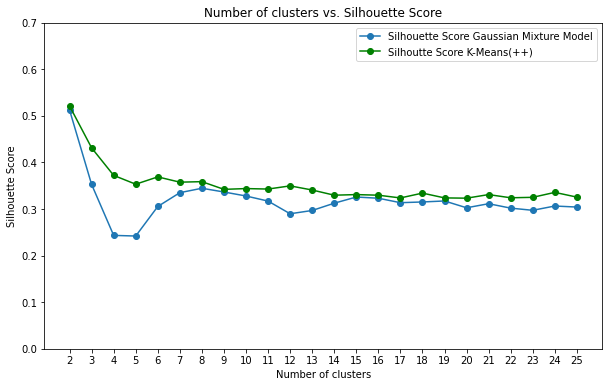

In [42]:
# Plot silhouette score

# Create fig and axes
fig, axe = plt.subplots(nrows = 1, ncols = 1, figsize= (10,6))

# Plot cluster on x axsis and score on y axsis
axe.plot(np.arange(2,k_max+steps,steps), S_durTemp, 'o-',label="Silhouette Score Gaussian Mixture Model")
axe.plot(np.arange(2,k_max+steps,steps), S_kmeans_durTemp, 'go-',label="Silhoutte Score K-Means(++)")

# Labels
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Number of clusters vs. Silhouette Score')
# Set x ticks
axe.set_xticks(np.arange(2,k_max+steps,steps))
axe.set_yticks(np.arange(0.0,0.8,0.1))
axe.legend()
plt.show()

The silhouette score beginns to stabilize from 5 clusters onwards. It then remains always slightly below the score of the results with K-Means. Taking the Elbow method result into account, 3 as the number of clusters or following the silhouette score strictly 8 clusters seem reasonable. For comparison, the results of 3 to 8 clusters are considered in more detail in the following paragraph.  

### 3.2.3.3 Final plotting of cluster

The final results with 3, 4, 5, 6, 7 and 8 clusters are plotted and interpreted.

In [43]:
numbers = ["zero", "one", "two", "three","four","five","six","seven","eight","nine","ten", 
           "eleven", "twelve" "thirteen", "fourteen", "fifteen", "sixteen"]

# Match cluster with labels from numbers[]
for i in range(2,len(numbers)+1):
    col_name="cluster_"+str(i)
    dbs_durTemp_g[col_name] = dbs_durTemp_g[col_name].apply(lambda x: numbers[x])

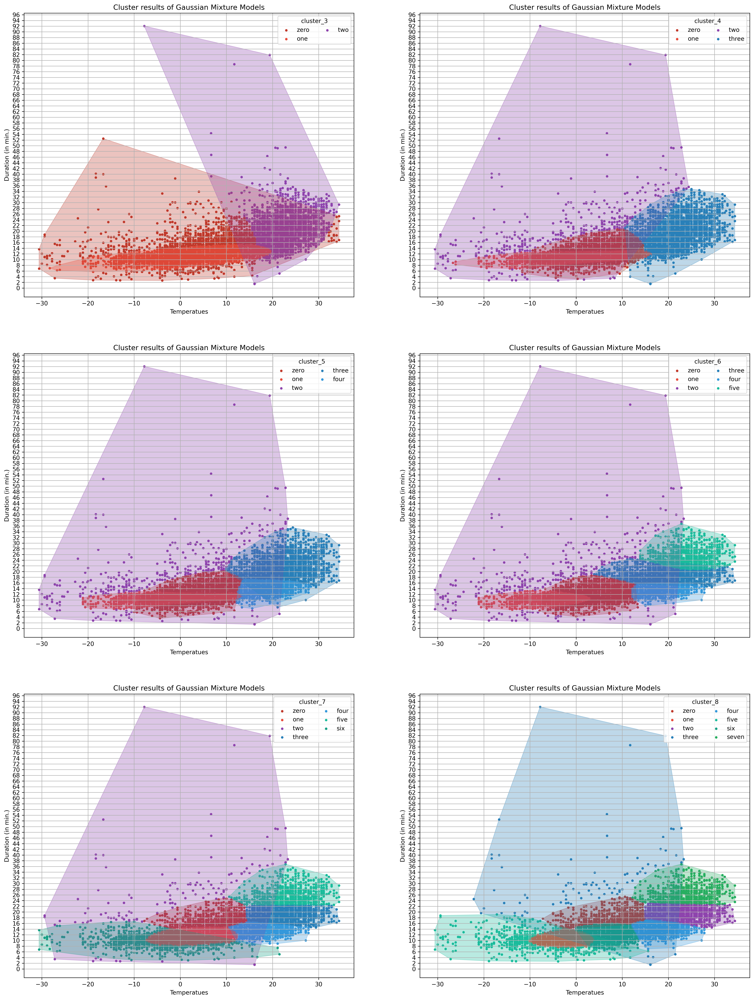

In [44]:
plotNClustering(data=dbs_durTemp_g,
                n_cluster=[3,4,5,6,7,8],
                xColumnToPlot="max_temp", 
                yColumnToPlot="duration_min", 
                nrowsSubplots=3, 
                ncolsSubplots=2, 
                figsize=(22,30), 
                xLabel="Temperatues", 
                yLabel="Duration (in min.)", 
                title="Cluster results of Gaussian Mixture Models", 
                alphaOfContur=0.3, 
                nColsLegend=2, 
                locLegend="upper right",
                colors = ['#339933','#0039e6','#9933ff','#ff3300','#ff9900','#996633'])

The gaussian model adds a new perspective, as the data is now largely represented by elliptical cluster structures. The clusters leave a large scope for interpretation. Despite the better coverage of elliptical structures as explained at the beginning of this chapter, a better classification as in the previous section with K-Means cannot be found. Some clusters span the whole temperature range or even the whole duration range, so that differentiated statements are difficult. In conclusion, the results of K-Means with more appropriate labels are classified as more suitable for the present use case.

# 3.3 Clustering of duration, temperature and precip 

## 3.3.1 First inspection of data by graphical plotting

As in the two previous chapters, it quickly became clear that an aggregation of the data is necessary. Furthermore, this also increases the comparability with the previous chapters if the same aggregations are performed. 

Therefore we also would like to refer to the mean duration of each available hour to one 'trip'. A 'trip' thus describes the average of the duration times of a specific hour.

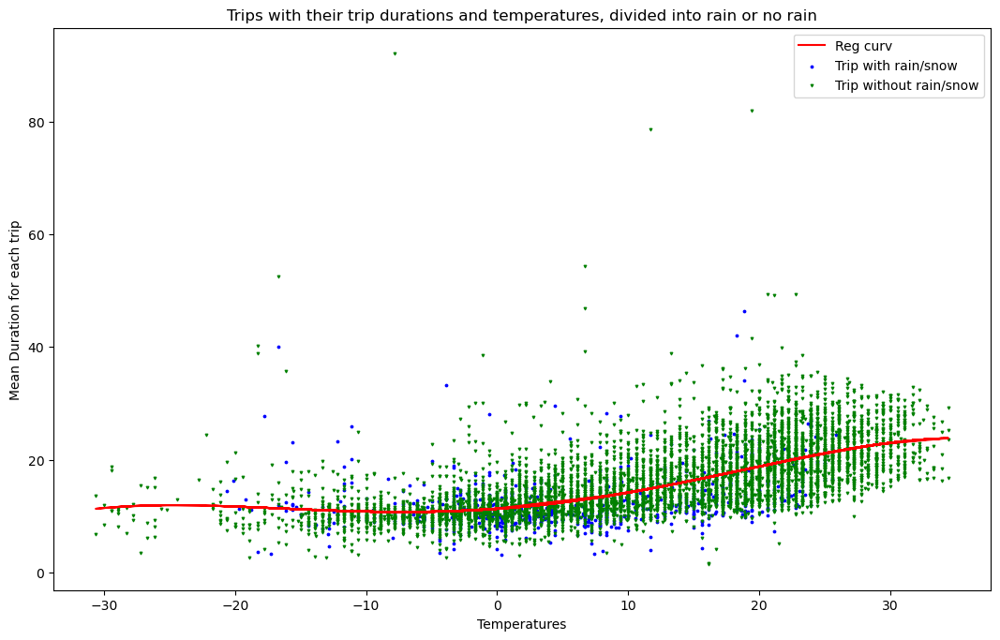

In [45]:
# First inspection of the duration data by graphical plotting

def plotDuration(data):
    # Group data by mean, otherwise to many data points for good visualization
    data_hour = data.groupby(by=["full_hour_start"]).mean()
    
    # Create figure and axes
    fig = plt.figure(figsize=(10,6),dpi = 100)
    axe = fig.add_axes([0,0,1,1])
    
    # Set x values and scatter duration
    axe.scatter(data_hour[(data_hour["precip"]==1.0)]["max_temp"],data_hour[(data_hour["precip"]==1.0)]["duration_min"], s=3, label="Trip with rain/snow", color="blue")
    axe.scatter(data_hour[(data_hour["precip"]==0.0)]["max_temp"],data_hour[(data_hour["precip"]==0.0)]["duration_min"], s=3, label="Trip without rain/snow", marker="v",color="green")
    
    # Reg curve
    polyReg = np.poly1d(np.polyfit(data_hour["max_temp"], data_hour["duration_min"], 4))
    axe.plot(data_hour["max_temp"], polyReg(data_hour["max_temp"]), label="Reg curv", color="red")

    # Labels
    axe.set_xlabel("Temperatures")
    axe.set_ylabel("Mean Duration for each trip")
    axe.set_title("Trips with their trip durations and temperatures, divided into rain or no rain")
    
    plt.legend()
    plt.show()

# Execute method plotDuration(data=divvy_bike_set)
plotDuration(divvy_bike_set)

The graph above shows the trips on the x-axis with the corresponding durations on the y-axis. Furthermore, a distinction is made as to whether it rained (snowed) or was dry. For this purpose, the blue circles mark rainy trips and the green triangles dry trips.

Note: A regression curve with degree four was overlaid on the data to reflect the trend and structure of the data. This helps the viewer to better understand the data.

## 3.3.2 Application of K-Means (++) to duration, temperature and precip as input features

In the following we apply the K-Means clustering algorithm to find appropriate cluster structures. Now we add the precip as a third input feature for the algorithm. The procedure remains the same as in section 3.2.2: 
<ol>
    <li>The dataset is aggregated as explained in the above section (3.3.2.1). </li>
    <li>The number of clusters is determined (3.3.2.2). Here, the loss for possible cluster structures is specified and the Elbow method is applied. The Elbow point is again examined in more detail with the delta loss.    </li>
    <li>The ratio of the data points to the total number of datapoints for each cluster is calculated to further strengthen the Elbow method.  </li>
    <li>The most interesting clusters derived from the Elbow area are visualized and compared (3.3.2.3). In the end labels are assigned.  </li>
</ol>
The Gaussian Mixture Model is not applied to show a comparison to the K-Means clustering results. Unfortunately, the Gaussian Mixture Model results from the previous chapter did not provide much insight. Consequently, it is now dropped, since the data structures have not hardly changed. Only the binary distinction "rain or no rain" is added as an input feature. 

### 3.3.2.1 Aggregation of data

The original bike set is copied to a specific dataframe used in the following sections for the k-means algorithm. The data is grouped by the hour and the mean is calculated.

In [46]:
dbs_durTempPrecip = divvy_bike_set.copy()
dbs_durTempPrecip = dbs_durTempPrecip.groupby("full_hour_start").mean()
dbs_durTempPrecip = dbs_durTempPrecip.reset_index()
dbs_durTempPrecip["trips"] = dbs_durTempPrecip.index

### 3.3.2.2 Determination of the number of clusters

For better clustering results, the input features are standardized with the StandardScaler.Then the duration and max_temp column will have a mean of 0 and a standard deviation of 1. 

In [47]:
# Define Standard Scaler
# Converting input feature duration so that the mean of observed values is 0 and the standard deviation is 1
standardScaler = StandardScaler()

# First fit the dataframe by computing the mean and standard deviation
# Second transform the dataframe by computing y = (x – mean) / standard_deviation
#divvy_bike_set_p_stand[["duration_sec","duration_min","duration_hour", "max_temp", "precip"]] = standardScaler.fit_transform(divvy_bike_set_p_stand[["duration_sec","duration_min","duration_hour", "max_temp", "precip"]])
dbs_durTempPrecip[["duration_min_stand", "max_temp_stand", "precip_stand"]] = standardScaler.fit_transform(dbs_durTempPrecip[["duration_min", "max_temp", "precip"]])
print("Duration as input feature is standarized to mean {} with std.dev of {}".format(round(dbs_durTempPrecip["duration_min_stand"].mean(),3),round(dbs_durTempPrecip["duration_min_stand"].std(),3))) 
print("Temperature as input feature is standarized to mean {} with std.dev of {}".format(round(dbs_durTempPrecip["max_temp_stand"].mean(),3),round(dbs_durTempPrecip["max_temp_stand"].std(),3)))
print("Precip as input feature is standarized to mean {} with std.dev of {}".format(round(dbs_durTempPrecip["precip_stand"].mean(),3),round(dbs_durTempPrecip["precip_stand"].std(),3)))

Duration as input feature is standarized to mean -0.0 with std.dev of 1.0
Temperature as input feature is standarized to mean -0.0 with std.dev of 1.0
Precip as input feature is standarized to mean -0.0 with std.dev of 1.0


In the following we calculate the loss for all possible cluster numbers. We set the maximum number of cluster to 25. 

In [48]:
# Max number of possible clusters
k_max = 25

25 different K-Means clusters are created, trained and cluster assignments are stored with the corresponding losses. 

In [49]:
clusters_p = []
losses_p = []
S_kmeans_p = []
# Calculate for each number of cluster (1..25) the loss
for k in range(1,k_max+1):
    # Create kmeans model with k cluster and the classical EM-style algorithm is “full” 
    m_p = KMeans(n_clusters=k, algorithm="full", random_state=20) #10
    # Fit the model with duration_min data
    m_p.fit(dbs_durTempPrecip[["duration_min_stand","max_temp_stand", "precip_stand"]])
    # For each number of cluster, append the "inertia_" as loss
    # (sum of squared distances of samples to their closest cluster center) 
    clusters_p.append(k)
    losses_p.append(m_p.inertia_)
    # Match cluster to each record
    col_name = "cluster_"+str(k)
    dbs_durTempPrecip[col_name] = m_p.predict(dbs_durTempPrecip[["duration_min_stand","max_temp_stand", "precip_stand"]])
    # Calculate Silhoutte Score and append to a list (start at k=2, since gaussian also starts there)
    if k >1:
        S_kmeans_p.append(silhouette_score(dbs_durTempPrecip[["duration_min_stand","max_temp_stand","precip_stand"]], dbs_durTempPrecip[col_name], metric='euclidean'))

We further plot the loss to be able to determine which number of clusters seems reasonable. 

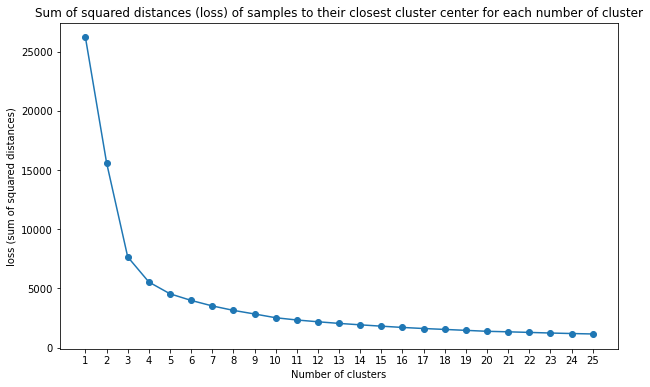

In [50]:
# Plot loss
# Create fig and axes
fig, axe = plt.subplots(nrows = 1, ncols = 1, figsize= (10,6))
# Plot cluster on x axsis and loss on y axsis
axe.plot(clusters_p, losses_p,"o-", label="loss function")
# Labels
axe.set_xlabel("Number of clusters")
axe.set_ylabel("loss (sum of squared distances)")
axe.set_title("Sum of squared distances (loss) of samples to their closest cluster center for each number of cluster")
# Set x ticks
axe.set_xticks(np.arange(1,len(clusters_p)+1,1))
plt.show()

The above graph and the Elbow method was already introduced in section 3.1.2.2. Following the Elbow approach, three clusters seem to be a reasonable cluster result in our case with the input features duration, temperature and precip. Similar to above sections it can be assumed that there are sill significant reductions in loss between the cluster results 4, 5 and 6. A closer look is therefore also suggested.

For a more detailed examination, the delta loss is calculated. This indicates the difference in loss between two cluster results.

In [51]:
# Calculate delta loss
losses_p_delta = losses_p.copy()
for i in range(1,len(losses_p)): 
    losses_p_delta[i-1] = losses_p[i-1]-losses_p[i]

<function matplotlib.pyplot.show(close=None, block=None)>

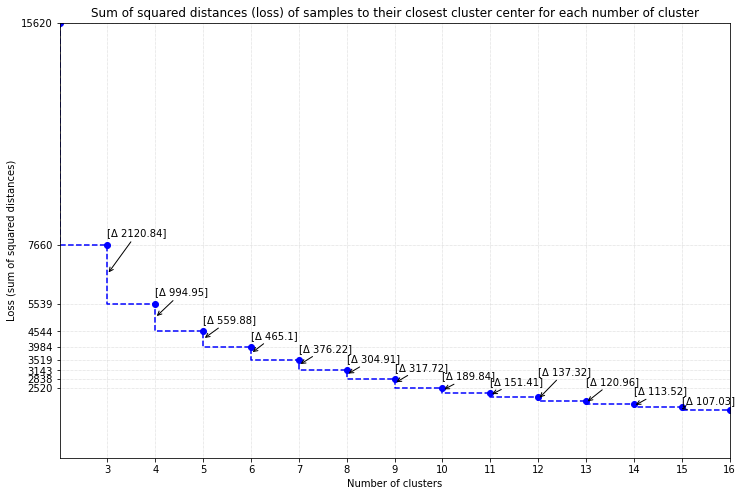

In [52]:
# Zoom into loss function (elbow) and show delta values
fig, axe = plt.subplots(nrows = 1, ncols = 1, figsize= (12,8))

# Plot losses with steps
axe.step(clusters_p, losses_p, "bo--")

# Label
axe.set_xlabel("Number of clusters")
axe.set_ylabel("Loss (sum of squared distances)")
axe.set_title("Sum of squared distances (loss) of samples to their closest cluster center for each number of cluster")

# Transform x and y ticks
axe.set_xticks(np.arange(3,17,1))
axe.set_yticks(losses_p[:10])

# Set scale of y-axis and x.axis
axe.set_xlim([2.01,16])
axe.set_ylim([0,losses_p[1]])

# Annotate with delta values
y_old=0
for i in range(2,15):
    y_pos_middle = (losses_p[i] + losses_p[i+1]) / 2
    axe.annotate("[\u0394 {}]".format(round(losses_p_delta[i],2)),
                  xy=(clusters_p[i],y_pos_middle),
                  xytext=((clusters_p[i],losses_p[i]+300) if i<=10 else (clusters_p[i],y_old)),
                  fontsize=10,
                  arrowprops=dict(arrowstyle="->",facecolor='black') )
    if i == 10: 
        y_old = losses_p[i]+1000
    if i>=10:
        y_old = y_old - 350

plt.grid(True, linestyle=':', linewidth=0.5)
plt.show

The pattern from the previous chapters is repeated. Significant loss reductions can also be seen after the identified Elbow point (three cluster). However, these reductions are faster than in the previous chapters. The result with 5 or 6 clusters show low delta values compared to the previous values and therefore do not seem to offer much added value anymore. However, since this impression can be deceptive and for consistency with the previous chapters, are comparision will be performend.

### 3.3.2.3 Comparision cluster result with precip data and without precip data

The clusters are very similar to the results from the previous chapter. The only difference is that K-Means now summarizes most of the rain trips (snow trips) in a separate cluster.The next part contrasts the cluster results of K-Means with precip and without precip.

In [53]:
numbers = ["zero", "one", "two", "three","four","five","six","seven","eight","nine","ten", 
           "eleven", "twelve" "thirteen", "fourteen", "fifteen", "sixteen"]

for k in range(1,len(numbers)):
    colName = "cluster_"+str(k)
    dbs_durTempPrecip[colName] = dbs_durTempPrecip[colName].apply(lambda x: numbers[x])

In [54]:
def compareCluster(data,data2, n_cluster, xColumnToPlot, yColumnToPlot, nrowsSubplots, ncolsSubplots, figsize, 
                    xLabel, yLabel, title, alphaOfContur, nColsLegend, locLegend, colors): 
    
    if len(colors) < max(n_cluster): 
        colors = cluster_colors2
    
    # Create fig with subplots
    fig, axes = plt.subplots(nrows=nrowsSubplots, ncols=ncolsSubplots, figsize=figsize, dpi=250, squeeze=False)
    
    counter=0
    for z in range(0,ncolsSubplots):
        axe = axes[0][z] 
        col_name = "cluster_"+str(n_cluster[counter])
            
        # Scatter each cluster
        if z==0: 
            for c in range(n_cluster[counter]): 
                axe.scatter(data[data[col_name]==numbers[c]][xColumnToPlot],data[data[col_name]==numbers[c]][yColumnToPlot], s=10, label=numbers[c],c=colors[c])
        else: 
            for c in range(n_cluster[counter]):
                axe.scatter(data2[ (data2[col_name]==numbers[c]) & (data2["precip"]==1.0) ][xColumnToPlot] , data2[(data2[col_name]==numbers[c]) & (data2["precip"]==1.0)][yColumnToPlot], s=10, label=numbers[c]+" (Rain/Snow)",c=colors[c], alpha=1)
                axe.scatter(data2[ (data2[col_name]==numbers[c]) & (data2["precip"]==0.0) ][xColumnToPlot] , data2[(data2[col_name]==numbers[c]) & (data2["precip"]==0.0)][yColumnToPlot], s=10, label=numbers[c],c=colors[c], alpha=1, marker="v") 

        # Y-axis Stepsize of 2
        plt.sca(axe)
        ystart, yend = axe.get_ylim()
        ystart=0
        plt.yticks(np.arange(ystart,yend,2))

        # Label
        axe.set_xlabel(xLabel)
        axe.set_ylabel(yLabel)
        axe.set_title(title[z])

        # Legend
        axe.legend(title=col_name, ncol=nColsLegend, loc=locLegend)

        axe.grid(True)
        counter = counter + 1
    
    #plt.show()
    return axes

<b> Comparision cluster_3 vs. cluster_4 (with precip) <b>

Text(-20, 32, 'Rain(Snow) Cluster')

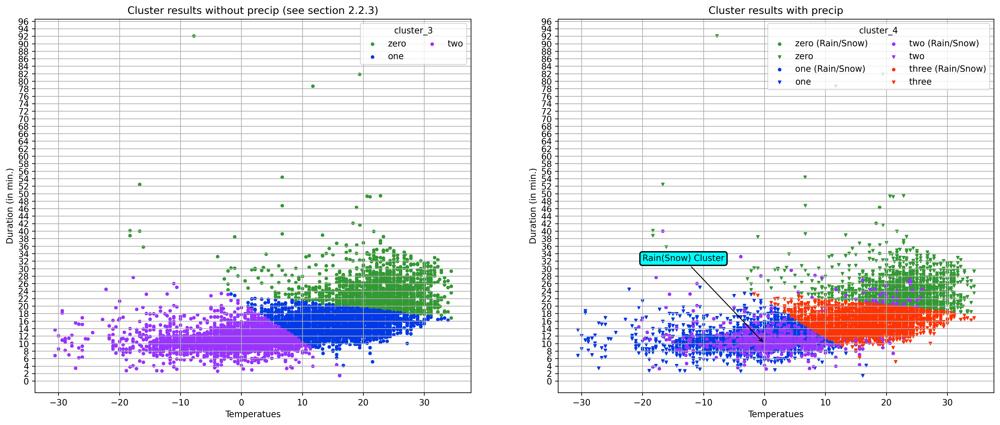

In [55]:
axes = compareCluster(data=dbs_durTemp,
                data2=dbs_durTempPrecip,
                n_cluster=[3,4],
                xColumnToPlot="max_temp", 
                yColumnToPlot="duration_min", 
                nrowsSubplots=1, 
                ncolsSubplots=2, 
                figsize=(20,8), 
                xLabel="Temperatues", 
                yLabel="Duration (in min.)", 
                title=["Cluster results without precip (see section 2.2.3)","Cluster results with precip"], 
                alphaOfContur=0.3, 
                nColsLegend=2, 
                locLegend="upper right",
                colors = ['#339933','#0039e6','#9933ff','#ff3300','#ff9900','#996633','#7F8C8D','#11ed5e','#1ABC9C'])

axes[0][1].annotate('Rain(Snow) Cluster',
                  xy=(0,10),
                  xytext=(-20,32),
                  fontsize=10,
                  bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5),
                  arrowprops=dict(arrowstyle="->",facecolor='black') )

Here the cluster result "cluster_3" and "cluster_4" are compared. The structure of the three basic clusters is almost identical. The cluster result with precip only highlights the rain trips with an additional cluster (purple cluster "two" for "cluster_4"). It seems that rain trips mainly occur for short to medium trip durations and for relatively low temperaturs. Longer trips with higher tempertures do not have many trips with rain.

<b> Comparision cluster_6 vs. cluster_8 (with precip)

Text(-15, 45, 'Rain(Snow) Cluster II')

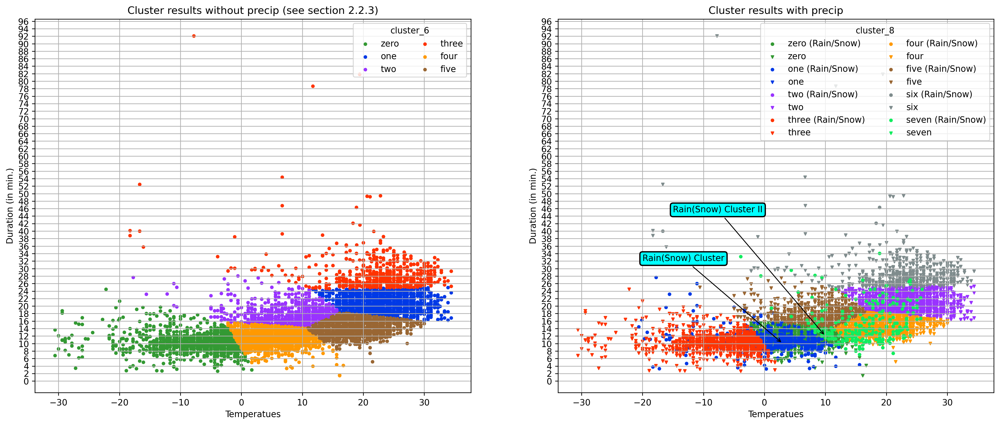

In [56]:
axes = compareCluster(data=dbs_durTemp,
                data2=dbs_durTempPrecip,
                n_cluster=[6,8],
                xColumnToPlot="max_temp", 
                yColumnToPlot="duration_min", 
                nrowsSubplots=1, 
                ncolsSubplots=2, 
                figsize=(20,8), 
                xLabel="Temperatues", 
                yLabel="Duration (in min.)", 
                title=["Cluster results without precip (see section 2.2.3)","Cluster results with precip"], 
                alphaOfContur=0.3, 
                nColsLegend=2, 
                locLegend="upper right",
                colors = ['#339933','#0039e6','#9933ff','#ff3300','#ff9900','#996633','#7F8C8D','#11ed5e','#1ABC9C'])

axes[0][1].annotate('Rain(Snow) Cluster',
                  xy=(3,10),
                  xytext=(-20,32),
                  fontsize=10,
                  bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5),
                  arrowprops=dict(arrowstyle="->",facecolor='black') )

axes[0][1].annotate('Rain(Snow) Cluster II',
                  xy=(10,12),
                  xytext=(-15,45),
                  fontsize=10,
                  bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="black", lw=1.5),
                  arrowprops=dict(arrowstyle="->",facecolor='black') )

In the previous section, the cluster result with 6 different clusters provided a good classification in the following categories: 
- Long trips with mainly high temperatures
- Trips with cold temperatues (< 0°C) with short to medium duration times
- Short trip durations with medium temperatures (< 15 °C)
- Medium trip durations with mainly medium temperatures (< 15 °C)
- Short trip durations with high temperatures (> 15 °C)
- Medium trip durations with high  temperatures (> 15 °C)

This result is shown on the left plotting. The complementary cluster result with precip can be found on the right side. The K-Means algorithm found the same 6 clusters, but additionally differentiate rain trips by adding two rain clusters. The first rain clusters mainly summarizes short trips with low temperatures (< 10 °C). In contrast the second rain cluster represents rain trips with longer duration times and higher temperatures.

# 3.4. Clustering of Rides based on revenue
In the following we will cluster transactional data, namely the revenue gained by every ride. The concrete concept of revenue and how it is calculated can be read in the descriptive analysis section. However, depicting every single ride and cluster it accordingly is not feasible, as we decided that it cannot be properly plotted and that it was computationally too demanding. Thus, similar to the clustering based on duration etc., we decided to cluster based on the average revenue per hour, thereby creating a total of 365*24 individual instances.
The functions below are the same as in the descriptive part to initially yield the revenue for each ride for customers and subscribers, respectively.


## 3.4.1 Preparation of data and calculation of revenue

In [129]:
# K-MEANS VERSION: Write a function that iterates a certain number of clusters to evaluate the metric and thus the number of clusters.
#By that, we are able to evaluate different hyperparameters for the K-Means-Algortihm according to the error metric
#of measuring the average distance of the individual data points to the mean value of their assigned cluster.
def iterate_clusters(data, c_num, standardize):
    #We can optionally standardize the Input-Data
    if (standardize == True):
        scaler = StandardScaler()
        scaler.fit(data)
        data = scaler.transform(data)
    #We keep track of the errors and the number of clusters    
    errors = []
    clusters = []
    for i in range(c_num):
        #For every number of clusters, we apply the algorithm
        model = KMeans(i + 1, random_state=1)
        model.fit(data)
        clusters.append(i)
        errors.append(model.inertia_)
    #Finally, we plot the respective error measure per hyperparameter iteratively
    fig = plt.figure(figsize = (7,10))
    plt.plot(clusters, errors, "o--")
    plt.ylabel("Loss")
    plt.xlabel("Number of clusters")
    plt.show()

In [132]:
# GAUSSIAN MIXTURE MODEL VERSION: Write a function that iterates a certain number of clusters to evaluate the metric and thus the number of clusters.
#By that, we are able to evaluate different hyperparameters for the Gaussian Mixture Models according to the error metric
#of measuring the average distance of the individual data points to the mean value of their assigned cluster.
def iterate_clusters_gaussian(data, c_num, standardize):
    #We can optionally standardize the Input-Data
    if (standardize == True):
        scaler = StandardScaler()
        scaler.fit(data)
        data = scaler.transform(data)
    #We keep track of the errors and the number of clusters    
    errors = []
    clusters = []
    for i in range(c_num):
        #For every number of clusters, we apply the algorithm
        model = GaussianMixture(n_components = i + 2, random_state=1)
        model.fit(data)
        clusters.append(i+2)
        errors.append(silhouette_score(data, list(model.predict(data)), metric='euclidean'))
    #Finally, we plot the respective error measure per hyperparameter iteratively
    fig = plt.figure(figsize = (7,10))
    plt.plot(clusters, errors, "o-")
    plt.ylabel("Silhouette Score")
    plt.xticks(range(c_num+2))
    plt.xlabel("Number of clusters")
    plt.show()

In [59]:
#We begin by calculating the revenue per trip as done and described in the descriptive part of the assignment.  

#round duration up to calculate minutes that have to be paid
divvy_bike_set = pd.read_csv("../data/bike_weather_clean.csv", parse_dates=["start_time", "end_time", "full_hour_start", "full_hour_end"])
divvy_bike_set["duration_min_rounded"] = np.ceil(divvy_bike_set["duration_min"])
divvy_bike_set.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,duration_time,duration_sec,...,duration_hour,weekday_start,full_hour_start,full_hour_end,max_temp,precip,hour,interpol,Quarter,duration_min_rounded
0,2019-01-01 00:04:37,2019-01-01 00:11:07,199,84,Wabash Ave & Grand Ave,Milwaukee Ave & Grand Ave,2167,Subscriber,0 days 00:06:30,390.0,...,0.108333,True,2019-01-01,2019-01-01 00:00:00,1.1,1.0,0,False,1,7.0
1,2019-01-01 00:08:13,2019-01-01 00:15:34,44,624,State St & Randolph St,Dearborn St & Van Buren St (*),4386,Subscriber,0 days 00:07:21,441.0,...,0.122500,True,2019-01-01,2019-01-01 00:00:00,1.1,1.0,0,False,1,8.0
2,2019-01-01 00:13:23,2019-01-01 00:27:12,15,644,Racine Ave & 18th St,Western Ave & Fillmore St (*),1524,Subscriber,0 days 00:13:49,829.0,...,0.230278,True,2019-01-01,2019-01-01 00:00:00,1.1,1.0,0,False,1,14.0
3,2019-01-01 00:13:45,2019-01-01 00:43:28,123,176,California Ave & Milwaukee Ave,Clark St & Elm St,252,Subscriber,0 days 00:29:43,1783.0,...,0.495278,True,2019-01-01,2019-01-01 01:00:00,1.1,1.0,0,False,1,30.0
4,2019-01-01 00:14:52,2019-01-01 00:20:56,173,35,Mies van der Rohe Way & Chicago Ave,Streeter Dr & Grand Ave,1170,Subscriber,0 days 00:06:04,364.0,...,0.101111,True,2019-01-01,2019-01-01 00:00:00,1.1,1.0,0,False,1,7.0


In [60]:
#function to calculate the revenue from customers
def calc_revenue_cus(z):
    if (z<30):
        a=3.3
    else: 
        a=3.3+0.15*(z-30)
       
    return a

In [61]:
#function to calculate the revenue from subscribers without their membership costs
def calc_revenue_sub(z):
    if z<45:
        a=0
    else: 
        a=0.15*(z-45)
        
    return a


In [62]:
#calcultate price per use for costumers and additional costs for subscribers per use 

divvy_bike_set["revenue"] = np.where(divvy_bike_set["user_type"]== "Subscriber", list(map(lambda z: calc_revenue_sub(z) , divvy_bike_set["duration_min_rounded"])), list(map(lambda z: calc_revenue_cus(z), divvy_bike_set["duration_min_rounded"]))) 
pd.set_option('display.max_rows', 100)

In [63]:
#Group by hour and customer type, since the original dataset is too large to be plotted and too ineffcient for the
#Algorithms
divvy_bike_set = divvy_bike_set[["full_hour_start", "revenue", "user_type", "max_temp", "precip", "start_station_id", "end_station_id", "duration_min"]]

divvy_bike_set_g = divvy_bike_set.groupby(["full_hour_start", "user_type"]).mean()

divvy_bike_set_g.reset_index(inplace = True)

divvy_bike_set_g2 = divvy_bike_set.groupby(["full_hour_start"]).mean()

divvy_bike_set_g2.reset_index(inplace = True)

## 3.4.2 Plotting and clustering the revenue using K-Means

We begin by differentiating the average hourly revenue by customer and subscriber. However, it becomes clear that while there is a clear separation (due to the fact that subscribers have a higher free time), this is not feasible for clustering algorithms, as those would separate both groups in separate clusters, which is not the goal of this section, as this type of distinction is already available and thus, does not need to be "revealed" by a clustering algorithm.


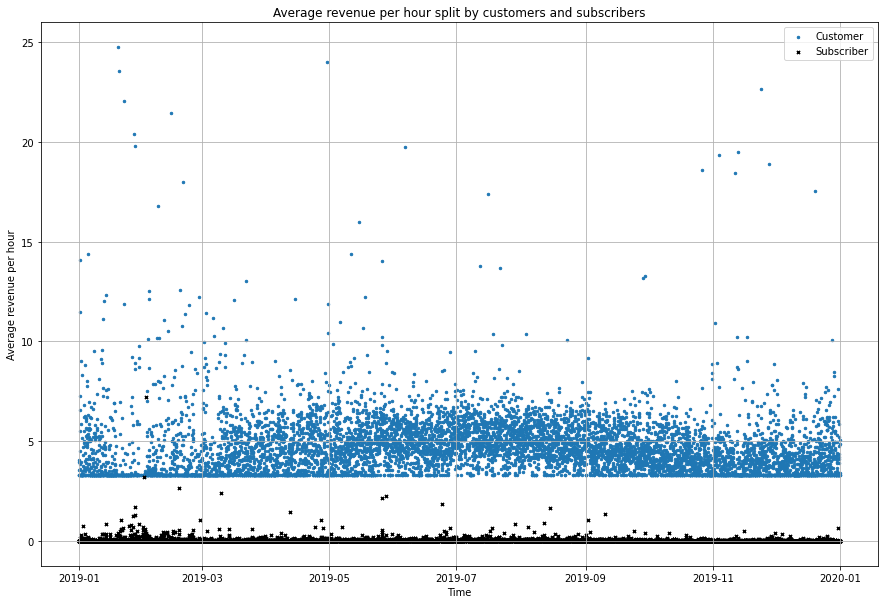

In [64]:
#We plot the average ride duration per station against the total number of starting rides per station
fig1 = plt.figure(figsize = (15,10))
plt.scatter(divvy_bike_set_g[divvy_bike_set_g["user_type"] == "Customer"]["full_hour_start"], divvy_bike_set_g[divvy_bike_set_g["user_type"] == "Customer"]["revenue"], s = 6, label = "Customer")
plt.scatter(divvy_bike_set_g[divvy_bike_set_g["user_type"] == "Subscriber"]["full_hour_start"], divvy_bike_set_g[divvy_bike_set_g["user_type"] == "Subscriber"]["revenue"], s = 10, marker = "x", color = "black", label = "Subscriber")

plt.grid(True)
plt.xlabel("Time")
plt.ylabel("Average revenue per hour")
plt.title("Average revenue per hour split by customers and subscribers")
plt.legend()
plt.show()
#However, it can be seen that it is not useful to plot the customer and subscriber revenue separately, thus
#we combine the data

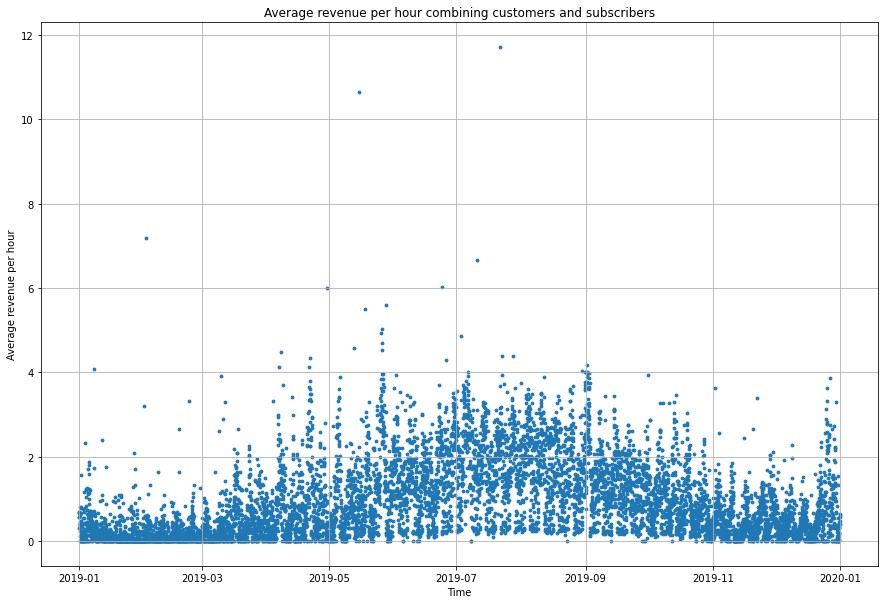

In [65]:
#We plot the average hourly revenue combining customers and subscriber
fig1 = plt.figure(figsize = (15,10))
plt.scatter(divvy_bike_set_g2["full_hour_start"], divvy_bike_set_g2["revenue"], s = 8)

plt.grid(True)
plt.xlabel("Time")
plt.ylabel("Average revenue per hour")
plt.title("Average revenue per hour combining customers and subscribers")
plt.show()

#### Iterate clusters based on revenue

We again use the iterative function and the Elbow method to yield the optimal number of clusters. In this case, we decide to select 3 clusters. 


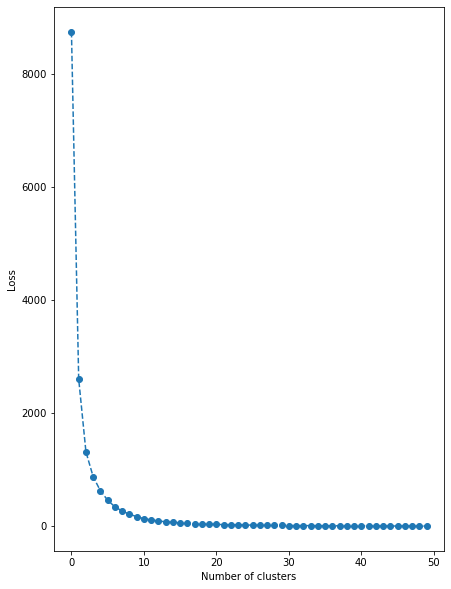

In [130]:
#Again, iterate different hyperparameter values
iterate_clusters(divvy_bike_set_g2[["revenue"]], 50, True)

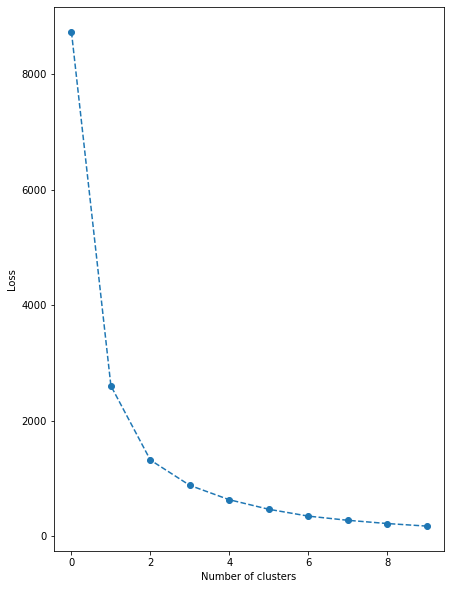

In [67]:
#Again, iterate different hyperparameter values
iterate_clusters( divvy_bike_set_g2[["revenue"]], 10, True)

In [131]:
#We scale the data and cluster it according to the identified optimal feasible cluster
scaler = StandardScaler()
scaler.fit(divvy_bike_set_g2[["revenue"]])
scaled = scaler.transform(divvy_bike_set_g2[["revenue"]])
model = KMeans(3, random_state=1)
model.fit(scaled)
divvy_bike_set_g2["class"] = model.predict(scaled)

#### Plotting the revenue clusters

Both the green and blue cluster account for roughly the same revenue interval size, that is, their variance is lower compared to that of the red cluster, namely around 1 dollar on average for the green and blue cluster and around 2.5 dollars for the red one, taking the min-max difference into account. Thus, the red cluster works as a "collector" of the most profitable rides. We will investigate this structure further later. 


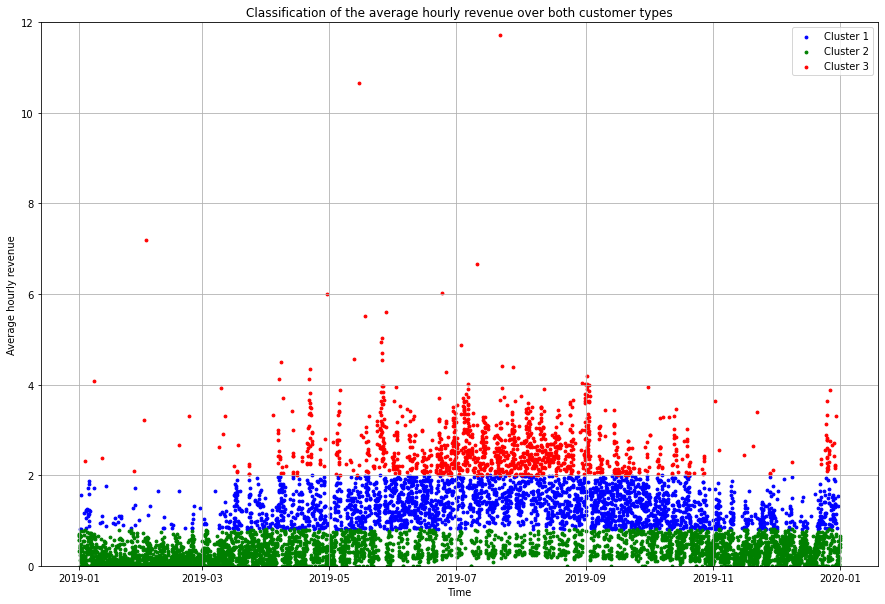

In [188]:
#We plot the result of the classification. 

fig1 = plt.figure(figsize = (15, 10))
plt.scatter(divvy_bike_set_g2[divvy_bike_set_g2["class"] == 0]["full_hour_start"], divvy_bike_set_g2[divvy_bike_set_g2["class"] == 0]["revenue"], color = "blue", label = "Cluster 1", s = 8)
plt.scatter(divvy_bike_set_g2[divvy_bike_set_g2["class"] == 1]["full_hour_start"], divvy_bike_set_g2[divvy_bike_set_g2["class"] == 1]["revenue"], color = "green", label = "Cluster 2", s = 8)
plt.scatter(divvy_bike_set_g2[divvy_bike_set_g2["class"] == 2]["full_hour_start"], divvy_bike_set_g2[divvy_bike_set_g2["class"] == 2]["revenue"], color = "red", label = "Cluster 3", s = 8)
plt.grid(True)
plt.ylim(0.0, 12)
plt.xlabel("Time")
plt.ylabel("Average hourly revenue")
plt.title("Classification of the average hourly revenue over both customer types")
plt.legend()
plt.show()

## 3.4.3 Clustering the revenue using Gaussian Mixture Models

Here, we use the same data as above but use the function that applies GMM to find the appropriate number of clusters. Remember that, as described in the introduction to this section, the higher the Silhouette Score is, the better is the number of clusters. Thus, in this case, we use 3 as the appropriate number of clusters and subsequently apply GMM.


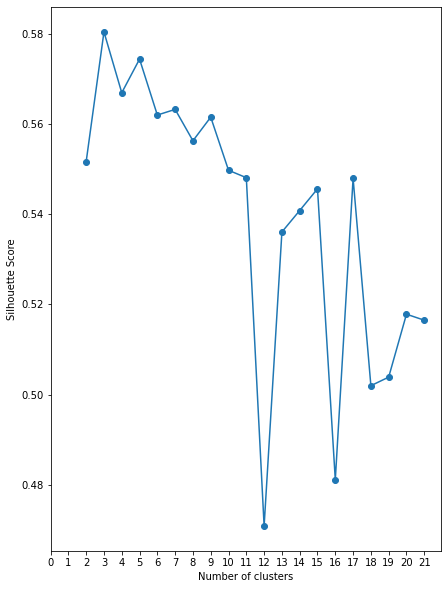

In [70]:
#Now, we want to create a clustering based on Gaussian Mixture Models in order to evaluate whether this yields 
#clusters that are notably different from those yielded by K Means
iterate_clusters_gaussian(divvy_bike_set_g2[["revenue"]], 20, True)

In [133]:
#We scale the data and cluster it using Gaussian Mixture Models
scaler = StandardScaler()
scaler.fit(divvy_bike_set_g2[["revenue"]])
scaled = scaler.transform(divvy_bike_set_g2[["revenue"]])
model = GaussianMixture(n_components = 3, random_state=1)
model.fit(scaled)
divvy_bike_set_g2["class_gaussian"] = model.predict(scaled)

#### Plotting the hourly average revenue clustered by GMM

The structure that is returned by applying GMM is slightly different than that by K-means: The green layer is smaller while the blue one is larger. As we consider this to be more realistic (there are often very short rides below 30 minutes that create only low revenue) we will continue to work with the clustering created by GMM.


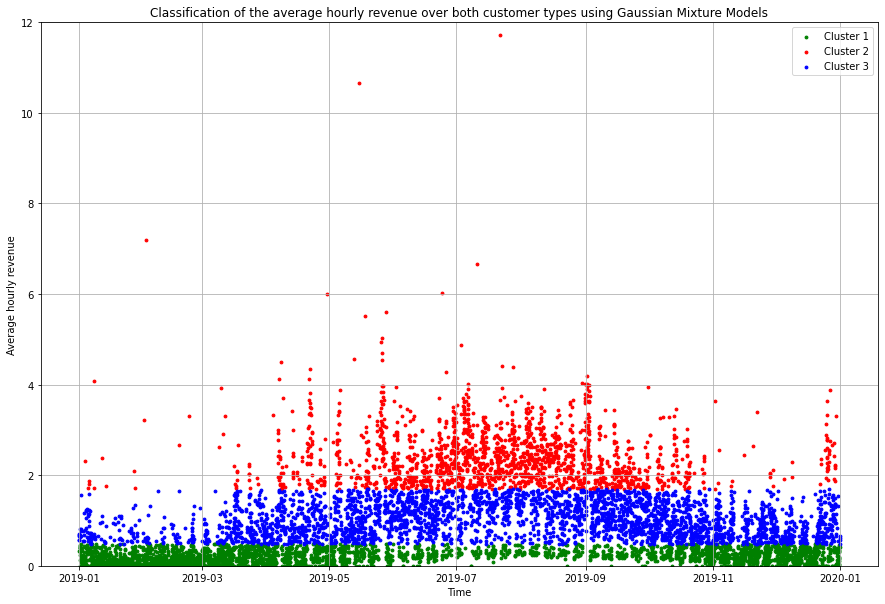

In [189]:
#We plot the result of the classification with Gaussian Mixture Models 

fig1 = plt.figure(figsize = (15, 10))
plt.scatter(divvy_bike_set_g2[divvy_bike_set_g2["class_gaussian"] == 0]["full_hour_start"], divvy_bike_set_g2[divvy_bike_set_g2["class_gaussian"] == 0]["revenue"], color = "green", label = "Cluster 1", s = 8)
plt.scatter(divvy_bike_set_g2[divvy_bike_set_g2["class_gaussian"] == 1]["full_hour_start"], divvy_bike_set_g2[divvy_bike_set_g2["class_gaussian"] == 1]["revenue"], color = "red", label = "Cluster 2", s = 8)
plt.scatter(divvy_bike_set_g2[divvy_bike_set_g2["class_gaussian"] == 2]["full_hour_start"], divvy_bike_set_g2[divvy_bike_set_g2["class_gaussian"] == 2]["revenue"], color = "blue", label = "Cluster 3", s = 8)
plt.grid(True)
plt.ylim(0.0, 12)
#plt.xlim(-5,700)
plt.xlabel("Time")
plt.ylabel("Average hourly revenue")
plt.title("Classification of the average hourly revenue over both customer types using Gaussian Mixture Models")
plt.legend()
plt.show()

## 3.4.4 Further investigation of the GMM-Clusters

Now, we will investigate the total revenue for each month split by the three clusters in order to see, how much each ride/revenue type (i.e., cluster) contributed to the overall revenue for each month. 


In [73]:
#Now, we are going to model the development of the revenue per trip type over the year
divvy_bike_set_g2.head(3)

,full_hour_start,revenue,max_temp,precip,start_station_id,end_station_id,duration_min,class,class_gaussian
0,2019-01-01 00:00:00,0.691304,1.1,1.0,143.347826,217.521739,14.123188,1,2
1,2019-01-01 01:00:00,0.682143,1.1,0.0,268.976190,260.452381,13.158730,1,2
2,2019-01-01 02:00:00,0.321951,1.1,0.0,154.804878,221.829268,11.727236,1,0


In [74]:
#Here, we add a Month indicator (1 to 12) and group the revenue by summing it per class created by
#the Gaussian Mixture Model and the individual day
divvy_bike_set_g2["month"] = list(map(lambda x: x.month, divvy_bike_set_g2["full_hour_start"]))
divvy_bike_rev_dev = divvy_bike_set_g2.groupby(["class_gaussian", "month"]).sum()
divvy_bike_rev_dev.reset_index(inplace = True)
divvy_bike_rev_dev.head(3)

,class_gaussian,month,revenue,max_temp,precip,start_station_id,end_station_id,duration_min,class
0,0,1,72.506421,-3847.450000,128.0,127654.546883,127150.645255,6683.783420,621
1,0,2,75.351998,-2009.325000,127.0,128035.554734,128698.659811,6587.445353,612
2,0,3,89.984495,51.741667,68.0,104979.057019,104810.524651,5352.362911,502


#### Illustrating the share of each cluster in terms of revenue per month

While obviously, the overall revenue during summer months is higher than during autumn and winter, the share of each cluster varies. During winter, autumn and spring, usually the blue cluster accounts for most of the revenue, although in January and February, the share of the green cluster is nearly equally high. During summer however, especially in July and August, the red cluster accounts for the absolute majority of the revenue. Thus, when it is not summer, the rides classified by green and blue clusters are equally relevant. However, during summer, the rides that belong to the red clusters are the most significant, indicating the importance of long rides during the warm summer months for the ride sharing system. 


<ipython-input-247-6482b391c54b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_perc["helpIndex"] = range(0, 36)


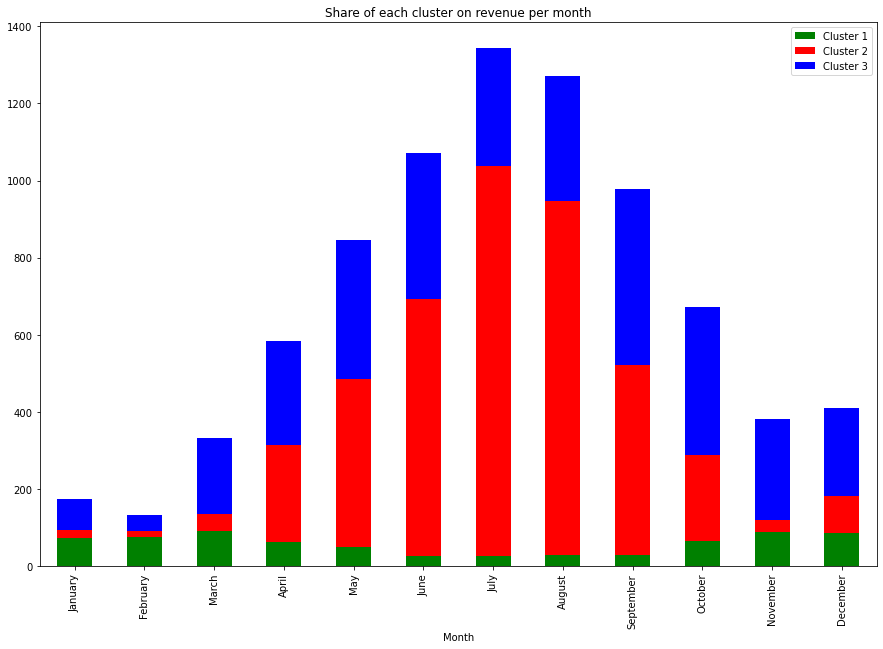

In [247]:
#We now plot the revenue per month per class to investigate the share of each cluss and thus, the share
#of each trip type over the year.

#Create a subset of the dataframe and put it in a dictionary to be able to create a barchart
df_perc = divvy_bike_rev_dev
df_perc = df_perc[["class_gaussian", "revenue"]]
df_perc["helpIndex"] = range(0, 36)
dic = {"Cluster 1": df_perc[df_perc["helpIndex"] <= 11]["revenue"].values, "Cluster 2": df_perc[(df_perc["helpIndex"] > 11) & (df_perc["helpIndex"] <= 23)]["revenue"].values, "Cluster 3": df_perc[df_perc["helpIndex"] > 23]["revenue"].values, "Month": ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]}
df = pd.DataFrame(dic)
#Create the barchart
axe = df.plot(x='Month', kind='bar', stacked=True, title='Share of each cluster on revenue per month', figsize= (15,10), color = ["green", "red", "blue"])


#### Investigating the total share in terms of yearly revenue of each cluster

It becomes clear that although the red cluster is not very relevant during the winter, autumn and spring months, it nevertheless accounts for the absolute majority of the total yearly income of the ride sharing system. This underlines the tremendous importance of the summer months and the long rides (in terms of duration) for the bike sharing system in terms of revenue. 


In [76]:
#Now, we want to create a pie chart illustrating the total revenue share over the year 2019 per class
divvy_bike_rev_pie = divvy_bike_set_g2.groupby("class_gaussian").sum()
divvy_bike_rev_pie.head(3)

,revenue,max_temp,precip,start_station_id,end_station_id,duration_min,class,month
class_gaussian,,,,,,,,
0,696.802314,7844.086548,614.0,798311.235092,783062.976060,41298.587315,3770,20909
1,4213.576606,36796.205357,56.0,359463.717623,365178.803339,42016.414374,2508,12409
2,3285.445495,42189.149762,213.0,690561.174995,708548.514925,49995.305164,1080,23751


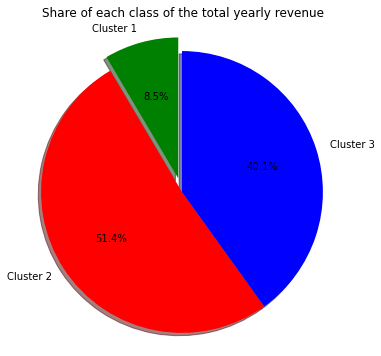

In [190]:
# Plot the share of each class in terms of summed revenue
labels = 'Cluster 1', 'Cluster 2', 'Cluster 3'
sizes = divvy_bike_rev_pie["revenue"].values
explode = (0.1, 0, 0)  # only "explode" the 2nd slice 
colors = ["green", "red", "blue"]

fig1, ax1 = plt.subplots(figsize = (6,6))
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90, colors = colors)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title("Share of each class of the total yearly revenue")
plt.show()

## 3.4.5 Clustering the revenue using K-Means with Temperature as additional feature

We will now take into account the average temperature per hour and the average revenue created within that hour. We select 4 clusters to be the appropriate number of clusters via the Elbow method. 


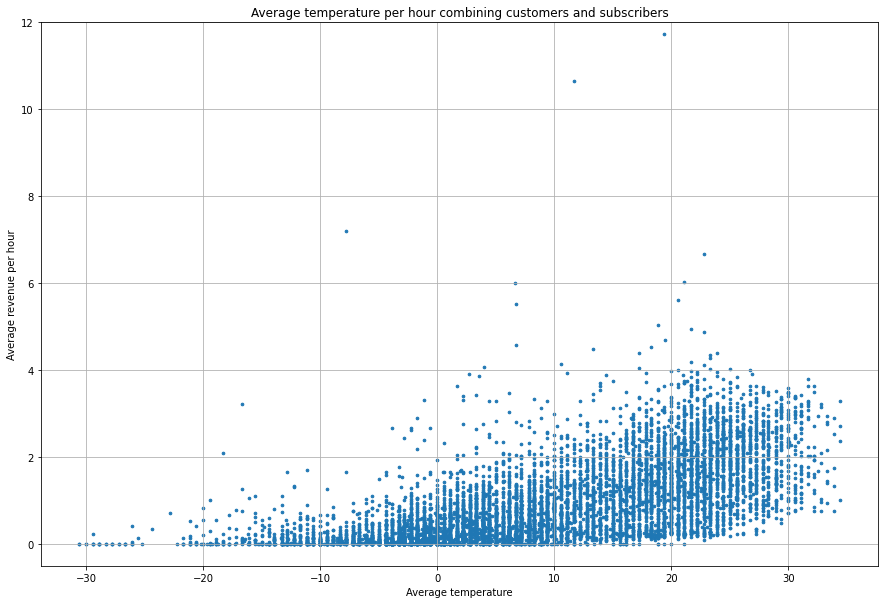

In [78]:
#We plot the average temperature against the average revenue to cluster this.
fig1 = plt.figure(figsize = (15,10))
plt.scatter(divvy_bike_set_g2["max_temp"], divvy_bike_set_g2["revenue"], s = 7)
plt.ylim(-0.5,12)
plt.grid(True)
plt.xlabel("Average temperature")
plt.ylabel("Average revenue per hour")
plt.title("Average temperature per hour combining customers and subscribers")
plt.show()

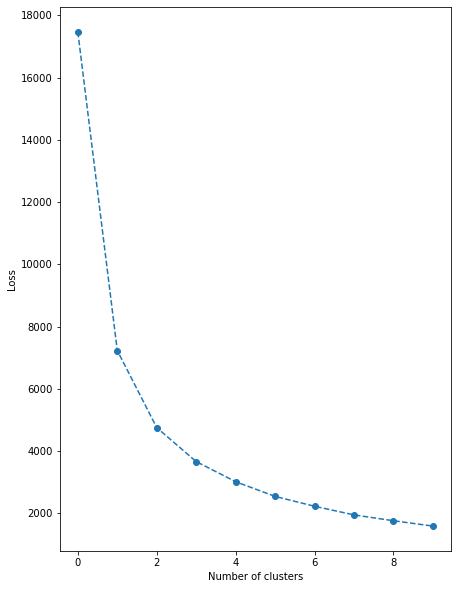

In [79]:
#Again, iterate different hyperparameter values
iterate_clusters(divvy_bike_set_g2[["revenue", "max_temp"]], 10, True)

In [134]:
#We scale the data and cluster it
scaler = StandardScaler()
scaler.fit(divvy_bike_set_g2[["revenue", "max_temp"]])
scaled = scaler.transform(divvy_bike_set_g2[["revenue", "max_temp"]])
model = KMeans(4, random_state=1)
model.fit(scaled)
divvy_bike_set_g2["class_temp"] = model.predict(scaled)

#### Clustering of hourly revenue and temperature

The green, cyan and blue clusters exhibit roughly the same revenue and are mainly distinguished by the average maximum temperature per respective hour. The red cluster exhibits the highest average hourly revenue, together with the highest variance in terms of average hourly temperature, although, as it is to expect, the data points are nevertheless skewed towards temperatures above 0 degrees. 


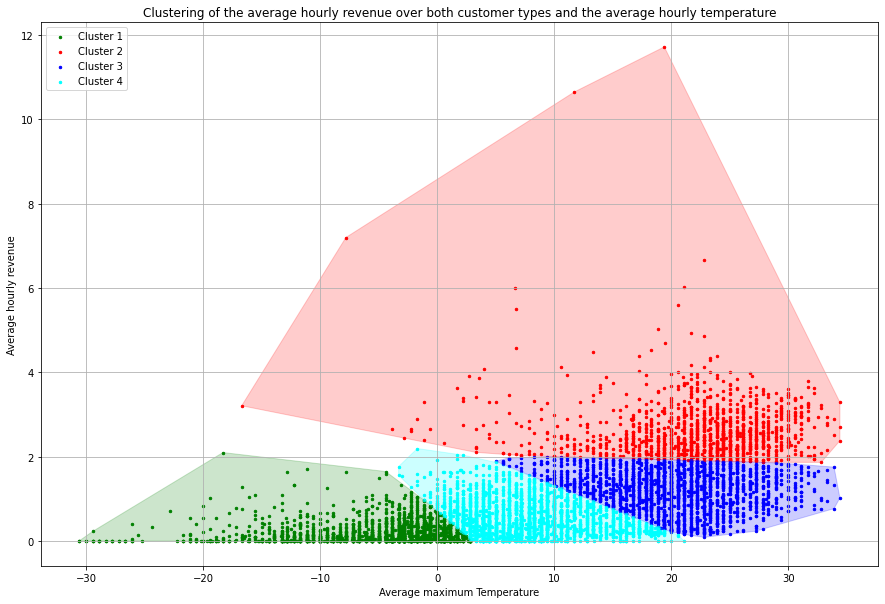

In [191]:
#We plot the result of the classification. 

fig1 = plt.figure(figsize = (15, 10))
plt.scatter(divvy_bike_set_g2[divvy_bike_set_g2["class_temp"] == 0]["max_temp"], divvy_bike_set_g2[divvy_bike_set_g2["class_temp"] == 0]["revenue"], color = "green", label = "Cluster 1", s = 6)
plt.scatter(divvy_bike_set_g2[divvy_bike_set_g2["class_temp"] == 1]["max_temp"], divvy_bike_set_g2[divvy_bike_set_g2["class_temp"] == 1]["revenue"], color = "red", label = "Cluster 2", s = 6)
plt.scatter(divvy_bike_set_g2[divvy_bike_set_g2["class_temp"] == 2]["max_temp"], divvy_bike_set_g2[divvy_bike_set_g2["class_temp"] == 2]["revenue"], color = "blue", label = "Cluster 3", s = 6)
plt.scatter(divvy_bike_set_g2[divvy_bike_set_g2["class_temp"] == 3]["max_temp"], divvy_bike_set_g2[divvy_bike_set_g2["class_temp"] == 3]["revenue"], color = "cyan", label = "Cluster 4", s = 6)
plt.grid(True)
#Plot the convex hull to illustrate the cluster better
for (i, color) in zip(range(4), ["green", "red", "blue", "cyan"]): 
    points = divvy_bike_set_g2[divvy_bike_set_g2["class_temp"]==i][["max_temp","revenue"]].values
    hull = ConvexHull(points)
    x_hull = np.append(points[hull.vertices,0], points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
    points[hull.vertices,1][0])
    # plot shape
    plt.fill(x_hull, y_hull, alpha=0.2, c= color)
#plt.ylim(0.0, 12)
#plt.xlim(-5,700)
plt.xlabel("Average maximum Temperature")
plt.ylabel("Average hourly revenue")
plt.title("Clustering of the average hourly revenue over both customer types and the average hourly temperature")
plt.legend()
plt.show()

## 3.4.6 Clustering the revenue using GMM with temperature as additional feature

When applying GMM on the above introduced setting, the Silhouette Score indicates that the optimal number of clusters is two. We decided that this would be a too low degree of differentiation and thus concluded, that the clusters yielded by K-means were most suitable. 


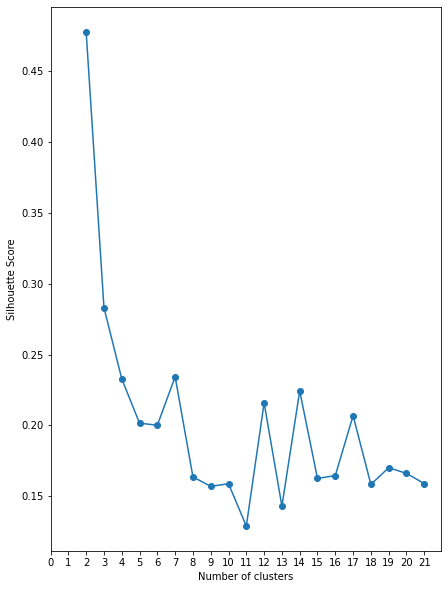

In [82]:
#We again iterate the clusters to investigate the optimal number of clusters, using Gaussian Mixture Models
iterate_clusters_gaussian(divvy_bike_set_g2[["revenue", "max_temp"]], 20, True)

In [83]:
#As only two clusters exihibt an adequate performance, we conclude that Gaussian Mixture models are inapropriate for this case

## 3.4.7 Clustering the ride data using K-Means with location and starting time as additional features

Last but not least, we will cluster each individual trip based on its starting time and the latitude and longitude of the station where it started to gain another perspective on our data. 


In [84]:
#To take into account the time when the rides started, we have to convert them into float numbers. 

def datetime_to_float(d):
    epoch = datetime.utcfromtimestamp(0)
    total_seconds =  (d - epoch).total_seconds()
    # total_seconds will be in decimals (millisecond precision)
    return total_seconds

In [85]:
#We then select the apropriate dataframe and rename the columns to be able to merge the ride data with the location
#/station data. Subsequently, we apply the above defined function on every start_time to convert it into
#float.
bike_weather = pd.read_csv("../data/bike_weather_clean.csv", parse_dates=["start_time", "end_time", "full_hour_start", "full_hour_end"])
bike_weather_time = bike_weather[["start_station_id", "duration_sec", "start_time", "full_hour_start"]]
bike_weather_time.rename(columns = {"start_station_id": "Station_id"}, inplace = True)
location.rename(columns = {"ID": "Station_id"}, inplace = True)
bike_weather_time = bike_weather_time.merge(location, on = "Station_id")
bike_weather_time["start_time_fl"] = list(map(lambda x: datetime_to_float(x), bike_weather_time["start_time"]))

/Users/Bjorn/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4441: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


#### Iterating the number of clusters

Two or three clusters seem to be reasonable in terms of the elbow method, so we decide to again use three clusters and subsequently apply the K-means with this hyperparameter.


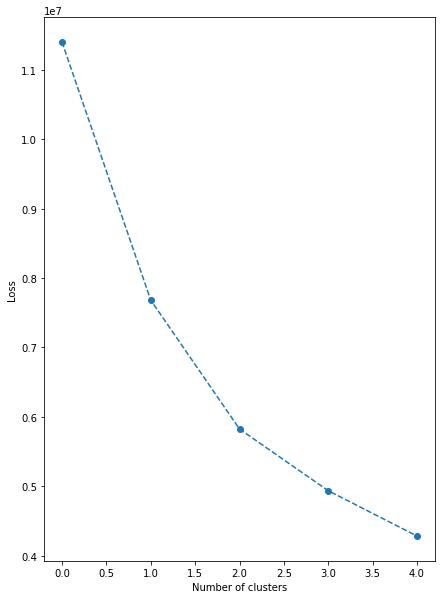

In [86]:
#We again apply K-means to find the apropriate number of clusters
iterate_clusters(bike_weather_time[["start_time_fl", "Latitude", "Longitude"]], 5, True)

In [135]:
#We scale the data and cluster it using K-Means
scaler = StandardScaler()
scaler.fit(bike_weather_time[["start_time_fl", "Latitude", "Longitude"]])
scaled = scaler.transform(bike_weather_time[["start_time_fl", "Latitude", "Longitude"]])
model = KMeans(3, random_state=1)
model.fit(scaled)
bike_weather_time["class"] = model.predict(scaled)

## 3.4.8 More thorough investigation of the clusters using K-Means with location and starting time as features

After having assigned each individual trip a cluster 1 to 3, we want to count how many rides on average belong to each of the clusters over the day, per hour. 
Logically, during night, the figure is very low. However, investigating the figure from around 7 o' clock until around 20 o' clock, an interesting situation arises: While the green and red cluster figures in this time period roughly remain the same (accounting for around 180 and 125 starting rides per hour on average, respectively), the blue cluster is the main contributor to the overall numbers. It varies over the time period, peaking at the already described commuter patterns. This once again illustrates the importance of commuters for the ride sharing system - their rides account, by far, for the most significant share of the rides over an average day.


In [88]:
#Now, we will use the class and the full_hour_Start attribute to count, how many rides per hour are
#started per cluster. 
bwt_g = bike_weather_time.groupby(["class", "full_hour_start"]).count()
bwt_g.reset_index(inplace = True)
bwt_g["hour_index"] = list(map(lambda x: x.hour, bwt_g["full_hour_start"]))
#Afterwards, we group by the mean of this figure for each hour index (0-23) to yield the average number of
#starting rides per cluster per hour over one day.
bwt_g = bwt_g.groupby(["class", "hour_index"]).mean()
bwt_g.reset_index(inplace = True)


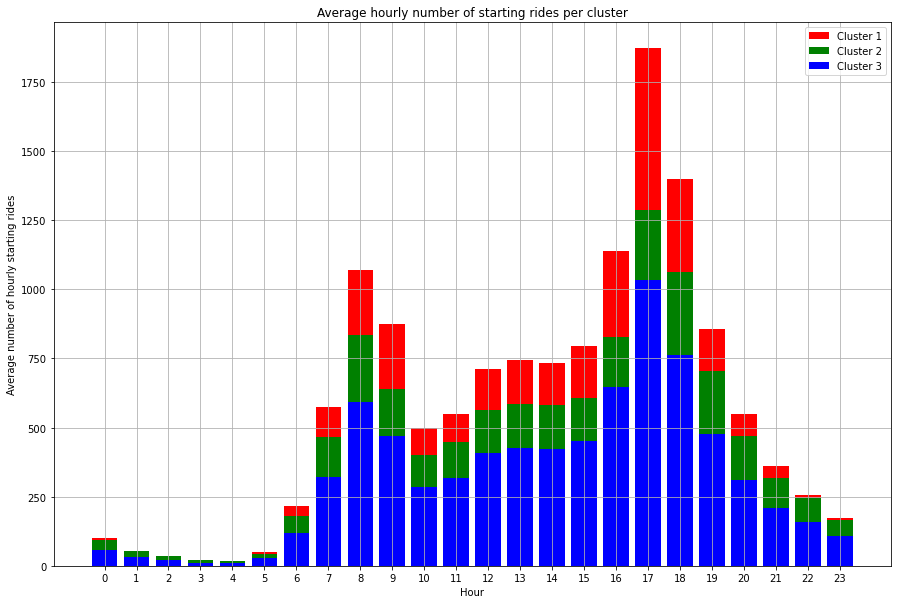

In [192]:
#Now, we create a barplot illustrating the average number of starting rides per hour per above defined cluster.


fig, ax = plt.subplots(figsize = (15,10))

ax.bar(range(0,24), bwt_g[bwt_g["class"] == 0]["Status"], label='Cluster 1', color = "red", bottom = bwt_g[bwt_g["class"] == 2]["Status"])
ax.bar(range(0,24), bwt_g[bwt_g["class"] == 1]["Status"], label='Cluster 2', color = "green", bottom = bwt_g[bwt_g["class"] == 2]["Status"])
ax.bar(range(0,24), bwt_g[bwt_g["class"] == 2]["Status"],  label='Cluster 3', color = "blue")

plt.title("Average hourly number of starting rides per cluster")
plt.ylabel("Average number of hourly starting rides")
plt.xlabel("Hour")
plt.xticks(range(0,24))
plt.legend()
plt.grid(True)
plt.show()

# 3.5 Clustering of stations based on different features

## 3.5.1 Data preparation

Here, we will import the necessary KPIs (KPI 2) and the location- and trip/weather data that will be used in the clustering process. 


In [90]:
#Read the required data files. Firstly, we need the kpi2 csv file, which stores the kpi2 values as defined in the
#descriptive analytics part. Moreover, we need the trip- and weatherdata, together with the station locations.
kpi2 = pd.read_csv("../data/kpi2.csv", parse_dates=["Hour"])
bike_weather = pd.read_csv("../data/bike_weather_clean.csv", parse_dates=["start_time", "end_time", "full_hour_start", "full_hour_end"])
location = pd.read_csv("../data/Divvy_Bicycle_Stations-2.csv")

In [91]:
#Begin with KPI2 clustering
#Drop columns erraneously inserted during the import
kpi2.drop(columns = {"Unnamed: 0"}, inplace = True)
kpi2.head()

,Hour,Station_id,Incoming,Outgoing,Docks in Service,maximum,Demand_Capacity
0,2019-01-01 00:00:00,35,3,2,47,3,0.063830
1,2019-01-01 19:00:00,35,2,6,47,6,0.127660
2,2019-01-02 17:00:00,35,2,2,47,2,0.042553
3,2019-01-02 21:00:00,35,1,1,47,1,0.021277
4,2019-01-03 13:00:00,35,2,7,47,7,0.148936


In [92]:
#Now, we create a dataframe containg the average temperature per station over the year to use this later on
#as an input feature for the clustering algorithms
station_temp = bike_weather.groupby("start_station_id").mean()
station_temp.reset_index(inplace = True)
station_temp.rename(columns = {"start_station_id": "Station_id"}, inplace = True)
station_temp = station_temp[["Station_id", "max_temp"]]
station_temp.head(2)

,Station_id,max_temp
0,1,9.400000
1,2,20.571229


## 3.5.2 Station clustering based on KPI 2 (Demand-Capacity) using K-Means

As a brief recap, KPI 2 measures how many rides are starting and arriving per hour per station in relation to the respective station's capacity, thereby measuring not only the station's activity but also its activity with respect to its capacity. 
The plot depicts the average yearly KPI 2 value per station.

In [93]:
#We group the kpi2 table by stations to yield the average kpi2 value over the year per station. 
kpi2_station = kpi2.groupby("Station_id").mean()
kpi2_station.reset_index(inplace = True)

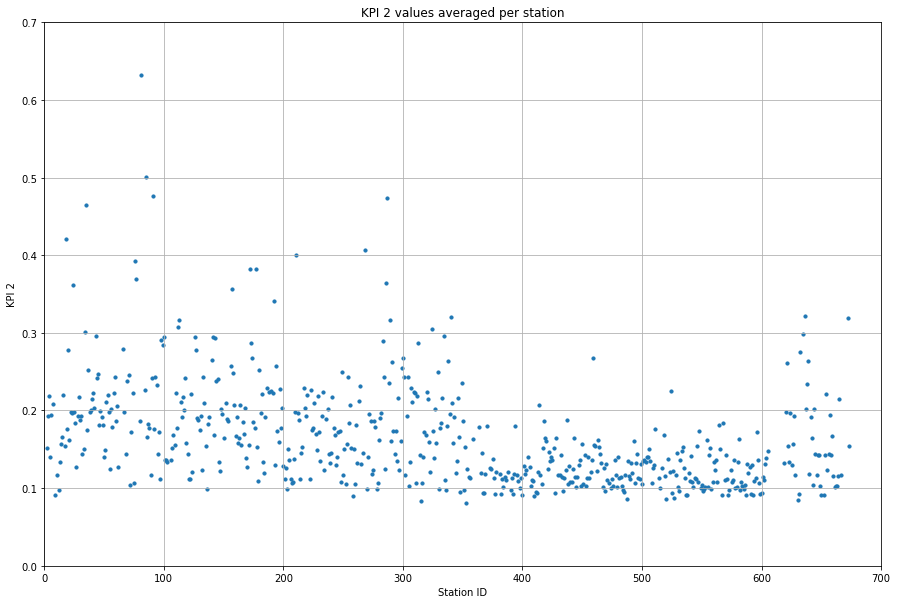

In [94]:
#Now, we plot the station ID on the x-axis and the average kpi2 value per station on the y-axis. 
fig1 = plt.figure(figsize = (15,10))
plt.scatter(kpi2_station["Station_id"], kpi2_station["Demand_Capacity"], s = 10)
plt.grid(True)
plt.ylim(0.0, 0.7)
plt.xlim(0,700)
plt.xlabel("Station ID")
plt.ylabel("KPI 2")
plt.title("KPI 2 values averaged per station")
plt.show()

#### Iterating different K-means cluster numbers

Now, the number of clusters are iterated using the above described function. In this particular case, we will refrain from using the elbow method: We have seen in the descriptive analysis part of the assignment, that the stations based on their respective KPI 2 values exhibit a clear three-ring structure, structuring the stations in heavily, mediocre-used and lowly-used (peripheral) stations. Thus, our domain-knowledge allows to ignore the elbow-method and yields three clusters. 


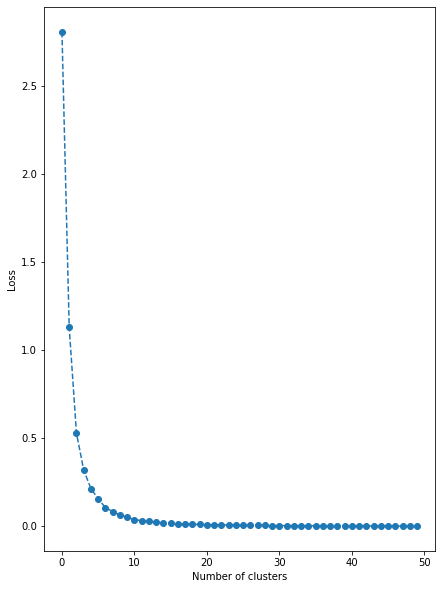

In [95]:
#We now use the above defined method to plot the error of the K_means-Algorithm in a hyperparametersearch in
#the intervall [1, 50]
iterate_clusters(kpi2_station["Demand_Capacity"].values.reshape(-1,1), 50, False)

#### Final application of K-means and illustration of clusters

Now, we will use the same illustration as above to separate the stations into clusters. Additionally, the convex hull of each cluster is plotted to describe the expansion of the clusters. 


In [136]:
#Now, we apply the K-Means directly with the selected hyperparameter 3, which will yield three different station
#clusters. 
model = KMeans(3, random_state=1)
model.fit(kpi2_station["Demand_Capacity"].values.reshape(-1,1))
#We create a separate class column, that classifies each entry and thus, each station. 
kpi2_station["class"] = model.predict(kpi2_station["Demand_Capacity"].values.reshape(-1,1))

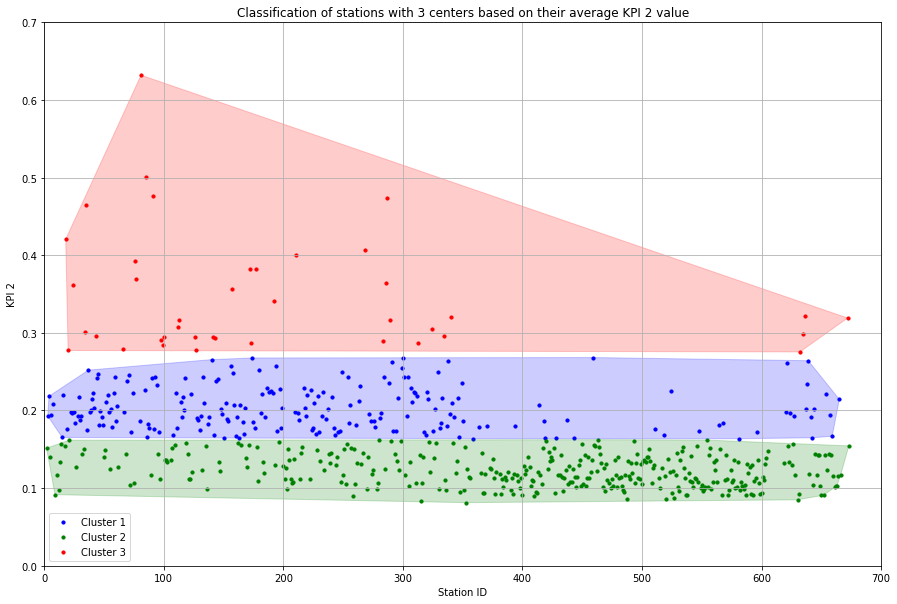

In [193]:
#Now, we create the same plot as above, however this time the stations are colored according to the class they have
#been assigned to by the K-Means algorithm. 
fig1 = plt.figure(figsize = (15, 10))
plt.scatter(kpi2_station[kpi2_station["class"] == 0]["Station_id"], kpi2_station[kpi2_station["class"] == 0]["Demand_Capacity"], color = "blue", label = "Cluster 1", s = 10)
plt.scatter(kpi2_station[kpi2_station["class"] == 1]["Station_id"], kpi2_station[kpi2_station["class"] == 1]["Demand_Capacity"], color = "green", label = "Cluster 2", s = 10)
plt.scatter(kpi2_station[kpi2_station["class"] == 2]["Station_id"], kpi2_station[kpi2_station["class"] == 2]["Demand_Capacity"], color = "red", label = "Cluster 3", s = 10)
plt.grid(True)
plt.ylim(0.0, 0.7)
plt.xlim(0,700)
#Plot the convex hull to illustrate the cluster better
for (i, color) in zip(range(3), ["blue", "green", "red"]): 
    points = kpi2_station[kpi2_station["class"]==i][["Station_id", "Demand_Capacity"]].values
    hull = ConvexHull(points)
    x_hull = np.append(points[hull.vertices,0], points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
    points[hull.vertices,1][0])
    # plot shape
    plt.fill(x_hull, y_hull, alpha=0.2, c= color)
plt.xlabel("Station ID")
plt.ylabel("KPI 2")
plt.title("Classification of stations with 3 centers based on their average KPI 2 value")
plt.legend()
plt.show()

#### Plotting the KPI 2 value per cluster over time

Before we map the stations according to their cluster, we want to investigate the average KPI 2 value per cluster over the entire year. 


In [158]:
#Here, we group the kpi2 table by hour and station id. The reason to do this is, that this will allow us
#to plot the average KPI2 value per station per cluster per hour over the year to evaluate, whether the 
#clusters have been grouped reasonably by the algorithm. 
kpi2_eval = kpi2[["Station_id", "Demand_Capacity", "Hour"]]
kpi2_eval = kpi2_eval.groupby(["Hour", "Station_id"]).mean()
kpi2_eval.reset_index(inplace = True)
kpi2_class_eval = kpi2_eval.merge(kpi2_station[["Station_id", "class"]], on = "Station_id")
kpi2_class_eval["Day"] = list(map(lambda x: x.round("D"), kpi2_class_eval["Hour"]))
kpi2_class_eval.head()

,Hour,Station_id,Demand_Capacity,class,Day
0,2019-01-01 00:00:00,35,0.063830,2,2019-01-01
1,2019-01-01 19:00:00,35,0.127660,2,2019-01-02
2,2019-01-02 17:00:00,35,0.042553,2,2019-01-03
3,2019-01-02 21:00:00,35,0.021277,2,2019-01-03
4,2019-01-03 13:00:00,35,0.148936,2,2019-01-04


In [159]:
#We now group the values by class to be able to plot their development over time. 
kpi2_class_eval = kpi2_class_eval.groupby(["Day", "class"]).mean()
kpi2_class_eval.reset_index(inplace = True)
kpi2_class_eval.head()

,Day,class,Station_id,Demand_Capacity
0,2019-01-01,0,191.307692,0.065488
1,2019-01-01,1,243.187500,0.063643
2,2019-01-01,2,216.833333,0.082713
3,2019-01-02,0,186.081013,0.108705
4,2019-01-02,1,251.345865,0.079345


## 3.5.3 Investigation of the clusters based on KPI 2 (Demand-Capacity)

It becomes clear that the red cluster exhibits drastically higher KPI 2 values than the other two clusters. The blue and green cluster exhibit on average a relatively similar pattern. Interestingly, the pattern for the red cluster exhibits much more variance than that of the two other ones and peaks more significantly during summer. 


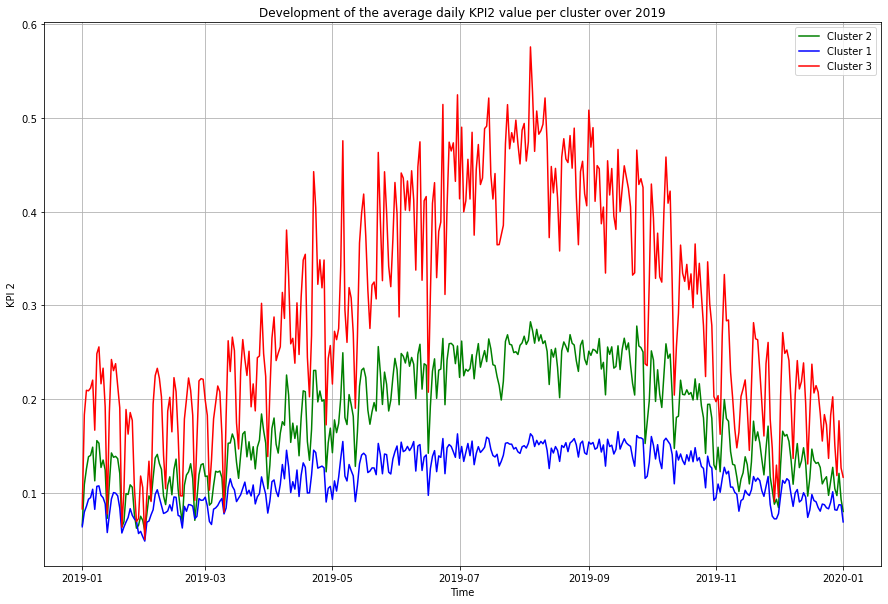

In [194]:
#Now, the plot of the average KPI value per cluster over the year is created. 
fig1 = plt.figure(figsize = (15, 10))
plt.plot(kpi2_class_eval[kpi2_class_eval["class"] == 0]["Day"], kpi2_class_eval[kpi2_class_eval["class"] == 0]["Demand_Capacity"], color = "green", label = "Cluster 2")
plt.plot(kpi2_class_eval[kpi2_class_eval["class"] == 1]["Day"], kpi2_class_eval[kpi2_class_eval["class"] == 1]["Demand_Capacity"], color = "blue", label = "Cluster 1")
plt.plot(kpi2_class_eval[kpi2_class_eval["class"] == 2]["Day"], kpi2_class_eval[kpi2_class_eval["class"] == 2]["Demand_Capacity"], color = "red", label = "Cluster 3")
plt.grid(True)
plt.xlabel("Time")
plt.ylabel("KPI 2")
plt.title("Development of the average daily KPI2 value per cluster over 2019")
plt.legend()
plt.show()

#### Plotting the stations according to their KPI 2 clusters

Subsequently, as the stations are mainly geospatial data, we will plot them colored according to their assigned clusters.


In [164]:
#We are now going to map the clustered stations. To do so, we firstly rename the columns to be able to merge
#the data with the locations. 
location.rename(columns = {"ID": "Station_id"}, inplace = True)
location.head()

,Station_id,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location
0,373,Kedzie Ave & Chicago Ave,11,11,In Service,41.895465,-87.706128,"(41.89546530305, -87.7061278837)"
1,186,Ogden Ave & Race Ave,15,15,In Service,41.891795,-87.658751,"(41.891795, -87.658751)"
2,102,Stony Island Ave & 67th St,11,11,In Service,41.773458,-87.585340,"(41.77345849948, -87.5853397391)"
3,438,Central Park Ave & Ogden Ave,15,15,In Service,41.854064,-87.715117,"(41.854063503874464, -87.71511733531952)"
4,656,Damen Ave & Walnut (Lake) St,15,15,In Service,41.885951,-87.677009,"(41.885951, -87.677009)"


In [165]:
#Now, we merge the kpi table with the location data. 
kpi2_class_loc = kpi2_station.merge(location[["Station_id", "Latitude", "Longitude"]], on = "Station_id")
kpi2_class_loc.head()

,Station_id,Incoming,Outgoing,Docks in Service,maximum,Demand_Capacity,class,Latitude,Longitude
0,2,4.632479,4.083868,38.0,5.758547,0.151541,1,41.876535,-87.620473
1,3,8.740768,7.301007,55.0,10.613950,0.192981,0,41.867226,-87.615355
2,4,3.928186,4.118721,23.0,5.019925,0.218258,0,41.856268,-87.613348
3,5,2.537719,2.392982,23.0,3.212281,0.139664,1,41.874053,-87.627716
4,6,6.407689,5.455429,39.0,7.595691,0.194761,0,41.886976,-87.612813


In [166]:
#Read the location data

#First, read the map of Chicago

chic = geopandas.read_file('../data/Geodata/geo_export_47a238d3-5bf0-4900-bed9-7bd4e1bc537b.shp')

#Create the geometry points to use the in the geopanda plot function
geometry = [Point(xy) for xy  in zip(kpi2_class_loc["Longitude"], kpi2_class_loc["Latitude"])]

#Set the coordinates to standard 
crs = {'init':'EPSG:4326'}

#create a geopanda dataframe with defined coordinates and geometry
geo_df = geopandas.GeoDataFrame(kpi2_class_loc, crs = crs, geometry = geometry)

/Users/Bjorn/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


#### Mapping the stations according to their KPI 2 clusters

We can clearly observe the above mentioned three-ring-structure that was already found in the descriptive part. This shows that our initial investigations were reasonable and that they are backed by a typical clustering algorithm. 
Interpretation: If you compare the sketch map in the notebook eg with a google maps representation of the map of Chicago, it gets clear that the majority of the red stations are located to the north of "Navy Pier" and around "Lincoln Park" up until "Belmont Harbor". All these sites are part of a major recreational area close to lake Michigan. A second smaller cluster of red stations seems to be located in downtown/roughly north to the University of Illinois/Chicago. The green stations and the blue stations cannot be broken down that thoroughly, the only major difference is that the blue stations are more remotely situated than the green ones.
We deduce the following hypothesis: The red stations comprise mainly leisure stations, that is stations that are used by riders who want to make use of the bikes for recreational purposes. This is backed by the figure above, where the red KPI 2 development is largely season dependent - this makes sense, as during summer, there are obviously more rides related to recreational purposes. The second smaller red cluster located more in in the centre of Chicago could however be also related to commuter travel and similar.
The blue and green cluster cannot be significantly distinguished. As they do not exhibit significant seasonality and are not predominantly located around parks and similar sites, we expect them to be stations that are used mainly by commuters and day-to-day riders. 


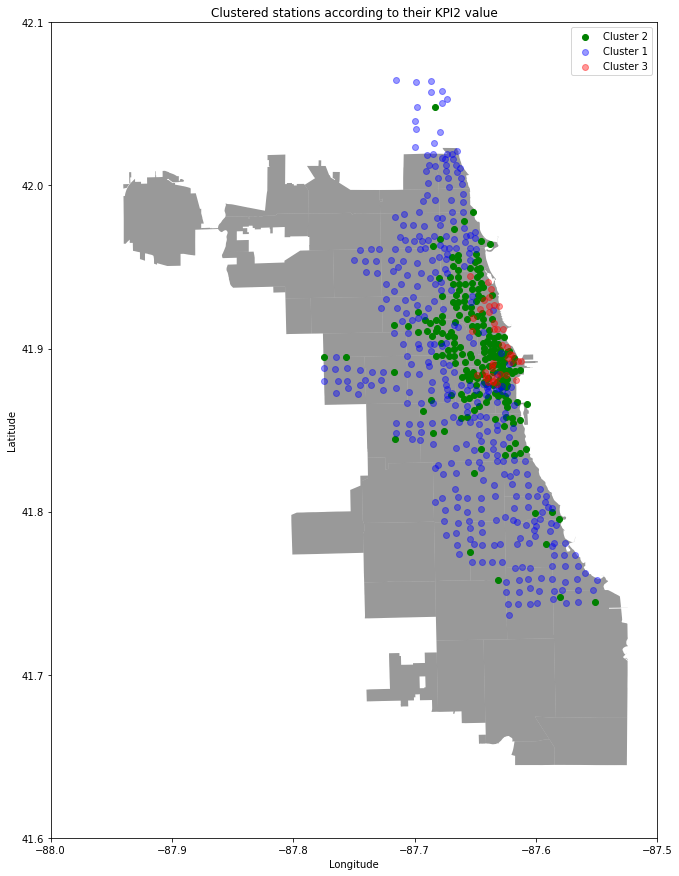

In [199]:
#Now, we plot the stations as they are clustered. The same color is used for the station-dots as in the illustrations
#above.
stations_0 = geo_df[geo_df["class"] == 0]
stations_1 = geo_df[geo_df["class"] == 1]
stations_2 = geo_df[geo_df["class"] == 2]

fig, ax = plt.subplots(figsize=(15, 15))

chic.to_crs(epsg=4326).plot(ax=ax, color="black", alpha=0.4)

ax.set_xlim(-88, -87.5)
ax.set_ylim(41.6, 42.1)
stations_0.plot(ax = ax, color = "green", label = "Cluster 2")
stations_1.plot(ax = ax, color = "blue", label = "Cluster 1", alpha = 0.4)
stations_2.plot(ax = ax, color = "red", label = "Cluster 3", alpha = 0.4)

plt.title("Clustered stations according to their KPI2 value")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.show()

## 3.5.4 Investigation of the clusters based on KPI 2 (Demand-Capacity) and temperature

Our goal is to try to further differentiate the (former/above described) green and blue clusters to see if any new patterns can be derived. Therefore, we add another feature - the average yearly temperature per station that was present when a ride started. 


In [105]:
#Now, we merge the kpi2 table with the table created earlier, that contains information on the average starting ride
#temperature per station.
kpi2_station_temp = kpi2_station.merge(station_temp, on = "Station_id")
kpi2_station_temp.head(3)

,Station_id,Incoming,Outgoing,Docks in Service,maximum,Demand_Capacity,class,max_temp
0,2,4.632479,4.083868,38.0,5.758547,0.151541,2,20.571229
1,3,8.740768,7.301007,55.0,10.613950,0.192981,0,20.749577
2,4,3.928186,4.118721,23.0,5.019925,0.218258,0,20.960997


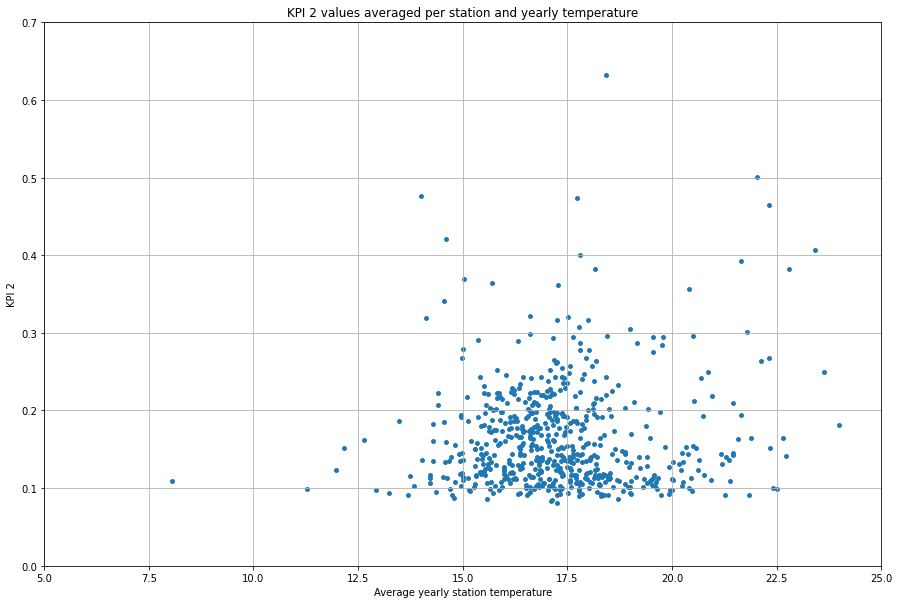

In [169]:
#Subsequently, we plot the average KPI values and the average temperature for the stations over the year.
fig1 = plt.figure(figsize = (15,10))
plt.scatter(kpi2_station_temp["max_temp"], kpi2_station_temp["Demand_Capacity"], s = 15)
plt.grid(True)
plt.ylim(0.0, 0.7)
plt.xlim(5,25)
plt.xlabel("Average yearly station temperature")
plt.ylabel("KPI 2")
plt.title("KPI 2 values averaged per station and yearly temperature")
plt.show()

#### Applying K-means and the elbow-method

Now, we will apply the K-means iteratively. In the second graph, it seems reasonable to select a parameter of four clusters/centres as it lies within the "elbow range". 


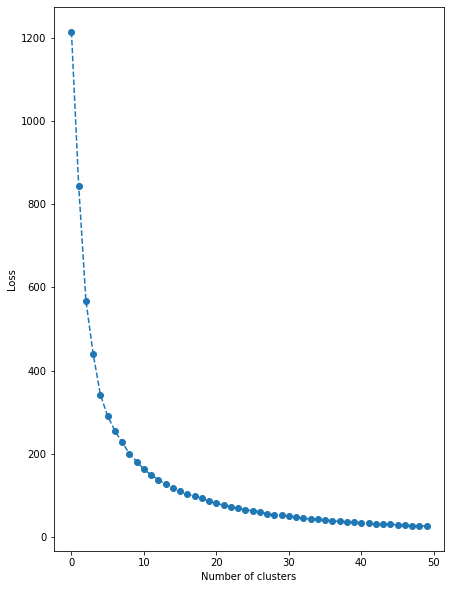

In [107]:
#We again apply the iterate clusters function to evaluate different hyperparameters, now on the temperature and
#KPI2 values as input features. 
iterate_clusters(kpi2_station_temp[["max_temp", "Demand_Capacity"]], 50, True)

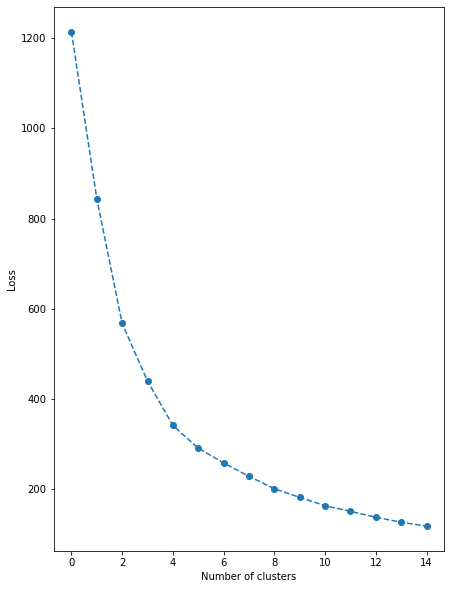

In [108]:
#We reduce the scope to 15 to be able to evaluate the "ellbow"
iterate_clusters(kpi2_station_temp[["max_temp", "Demand_Capacity"]], 15, True)

#### Plotting the clusters for average temperature and average KPI 2

Now, we will apply K-means with four clusters and plot the data points that were already illustrated above, however this time colored according to their respective cluster and together with a convex hull of each cluster. Note, that we normalized the data this time, as we made use of two input features with different scales. 


In [170]:
#As we have two input features now, we will have to normalize the features. 
#Afterwards, we again apply K-means, this time with 4 target clusters. 
scaler = StandardScaler()
scaler.fit(kpi2_station_temp[["max_temp", "Demand_Capacity"]])
kpi_scaled = scaler.transform(kpi2_station_temp[["max_temp", "Demand_Capacity"]])

model = KMeans(4, random_state=1)
model.fit(kpi_scaled)
kpi2_station_temp["class_temp"] = model.predict(kpi_scaled)

#### First interpretation

In terms of KPI 2, again three layers arise. However, the lowest layer (black and blue), while exhibiting roughly the same distribution in terms of KPI 2, shows a significant difference in terms of the average temperature of starting rides there. The red cluster is pretty predominant in terms of both temperature and KPI 2. 


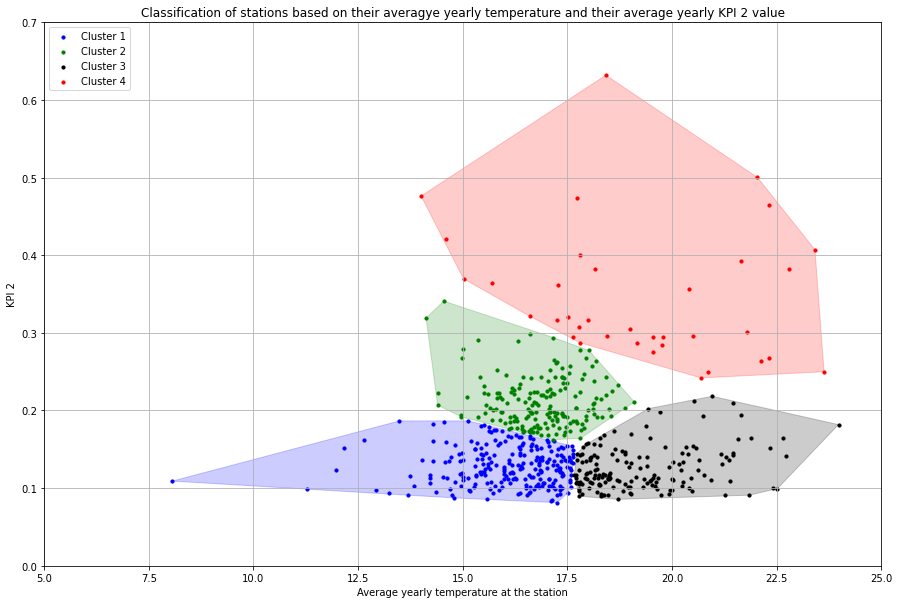

In [196]:
#We subsequently plot the result of the clustering process.  
fig1 = plt.figure(figsize = (15, 10))
plt.scatter(kpi2_station_temp[kpi2_station_temp["class_temp"] == 0]["max_temp"], kpi2_station_temp[kpi2_station_temp["class_temp"] == 0]["Demand_Capacity"], color = "blue", label = "Cluster 1", s = 10)
plt.scatter(kpi2_station_temp[kpi2_station_temp["class_temp"] == 1]["max_temp"], kpi2_station_temp[kpi2_station_temp["class_temp"] == 1]["Demand_Capacity"], color = "green", label = "Cluster 2", s = 10)
plt.scatter(kpi2_station_temp[kpi2_station_temp["class_temp"] == 2]["max_temp"], kpi2_station_temp[kpi2_station_temp["class_temp"] == 2]["Demand_Capacity"], color = "black", label = "Cluster 3", s = 10)
plt.scatter(kpi2_station_temp[kpi2_station_temp["class_temp"] == 3]["max_temp"], kpi2_station_temp[kpi2_station_temp["class_temp"] == 3]["Demand_Capacity"], color = "red", label = "Cluster 4", s = 10)
#Plot the convex hull to illustrate the cluster better
for (i, color) in zip(range(4), ["blue", "green", "black", "red"]): 
    points = kpi2_station_temp[kpi2_station_temp["class_temp"]==i][["max_temp", "Demand_Capacity"]].values
    hull = ConvexHull(points)
    x_hull = np.append(points[hull.vertices,0], points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
    points[hull.vertices,1][0])
    # plot shape
    plt.fill(x_hull, y_hull, alpha=0.2, c= color)
plt.grid(True)
plt.ylim(0.0, 0.7)
plt.xlim(5,25)
plt.xlabel("Average yearly temperature at the station")
plt.ylabel("KPI 2")
plt.title("Classification of stations based on their averagye yearly temperature and their average yearly KPI 2 value")
plt.legend()
plt.show()

#### Geospatial investigation

Interestingly, although we now implemented four clusters, the general structure derived from only taking KPI 2 into account remains steady: We still see highly used stations around the lake and two large rings around them. The red stations are still situated mainly around parks etc. and at one small cluster downtown, just as above. However, the "outskirt" stations were differentiated by adding another cluster. While occasionally, there are some areas where black stations are predominant and others where blue stations are predominant, no real differentiation can be made. Thus, average yearly ride starting temperature does not seem to be a very good way to further distinguish the stations. 


In [175]:
#Now, we merge the location-kpi-temperature data with the locations to be again able to plot them on a map.
kpi2_station_temp_loc = kpi2_station_temp.merge(location[["Station_id", "Latitude", "Longitude"]], on = "Station_id")

/Users/Bjorn/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


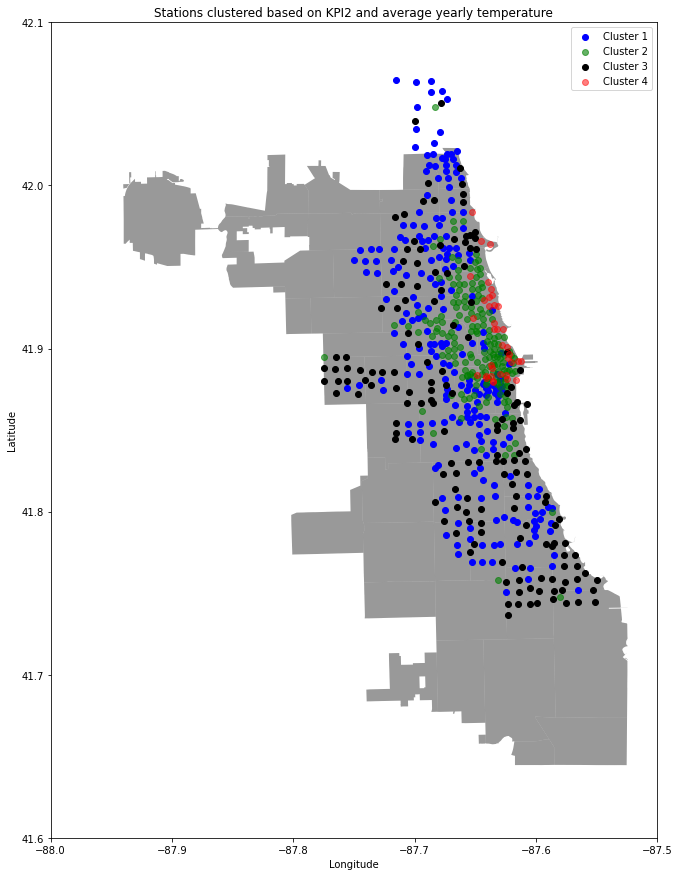

In [200]:
#Read the location data - this is the same pattern as above, see above for a more detailed description

chic2 = geopandas.read_file('../data/Geodata/geo_export_47a238d3-5bf0-4900-bed9-7bd4e1bc537b.shp')

geometry2 = [Point(xy) for xy  in zip(kpi2_station_temp_loc["Longitude"], kpi2_station_temp_loc["Latitude"])]

#Set the coordinates to standard 
crs2 = {'init':'EPSG:4326'}

#create a geopanda dataframe with defined coordinates and geometry
geo_df2 = geopandas.GeoDataFrame(kpi2_station_temp_loc, crs = crs2, geometry = geometry2)

#Create individual sub-frames for each class
stations_0 = geo_df2[geo_df2["class_temp"] == 0]
stations_1 = geo_df2[geo_df2["class_temp"] == 1]
stations_2 = geo_df2[geo_df2["class_temp"] == 2]
stations_3 = geo_df2[geo_df2["class_temp"] == 3]

fig, ax = plt.subplots(figsize=(15, 15))

chic2.to_crs(epsg=4326).plot(ax=ax, color="black", alpha=0.4)

ax.set_xlim(-88, -87.5)
ax.set_ylim(41.6, 42.1)
stations_0.plot(ax = ax, color = "blue", label = "Cluster 1")
stations_1.plot(ax = ax, color = "green", label = "Cluster 2", alpha = 0.6)
stations_2.plot(ax = ax, color = "black", label = "Cluster 3")
stations_3.plot(ax = ax, color = "red", label = "Cluster 4", alpha = 0.5)
plt.title("Stations clustered based on KPI2 and average yearly temperature")
plt.legend()
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

## 3.5.5 Investigation of the clusters based on the number of starting rides

We will introduce an alternative to the KPI 2 for two reasons. Firstly, KPI 2 is relatively complex conceptually and thus not that easy to understand. Secondly, we want to gain a different perspective and see, what clusters arise then. Thus, we will simply use the total number of starting rides per station over the year 2019 as input feature here. 


In [113]:
#We now calculate the number of starting rides per station, in order to yield an alternative measure to the KPI2 metric. 
rides_starting = bike_weather.groupby("start_station_id").count()
rides_starting.reset_index(inplace = True)
rides_starting = rides_starting[["start_station_id", "start_time"]]
rides_starting.rename(columns = {"start_time": "starting_rides"}, inplace = True)
rides_starting.head(3)

,start_station_id,starting_rides
0,1,1
1,2,10920
2,3,26279


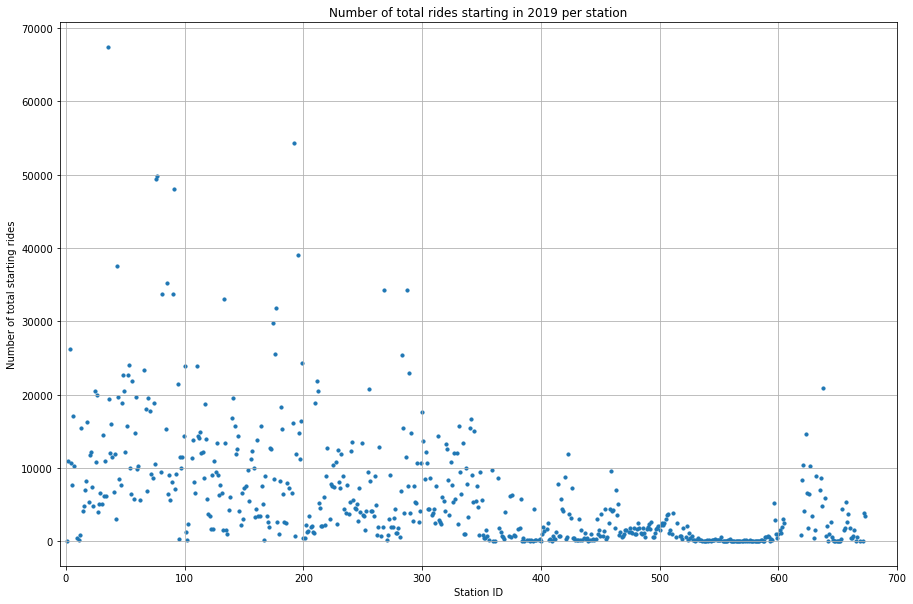

In [114]:
#Here, we plot the data accordingly, illustrating the total number of starting rides per station in 2019.
rides_starting.rename(columns = {"start_station_id": "Station_id"}, inplace = True)
fig1 = plt.figure(figsize = (15,10))
plt.scatter(rides_starting["Station_id"], rides_starting["starting_rides"], s = 10)
plt.grid(True)
plt.xlim(-5,700)
plt.xlabel("Station ID")
plt.ylabel("Number of total starting rides")
plt.title("Number of total rides starting in 2019 per station")
plt.show()

#### Cluster iteration

Then, we will again iterate the clusters. We select three clusters via the elbow-method. 


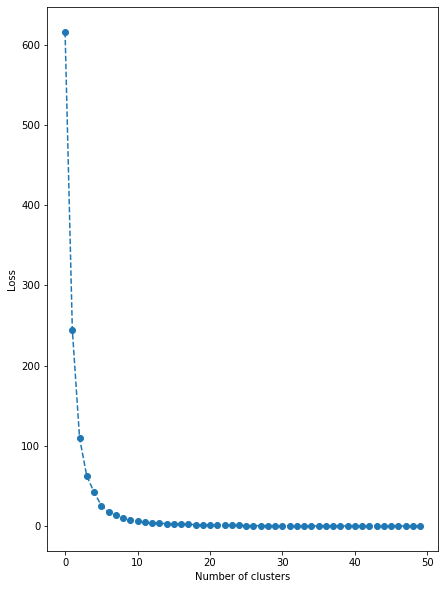

In [115]:
#Afterwards, we again iterate through feasible hyper parameters. 
iterate_clusters(rides_starting["starting_rides"].values.reshape(-1,1), 50, True)

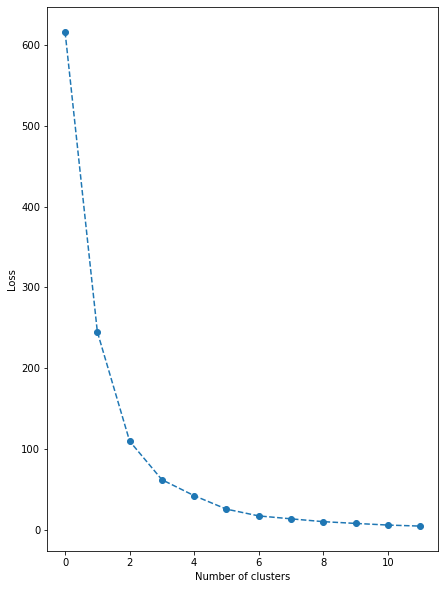

In [116]:
#We reduce the scope to be able to evaluate the "ellbow"
iterate_clusters(rides_starting["starting_rides"].values.reshape(-1,1), 12, True)

#### Plot the clusters based on the number of starting rides

The red cluster stands slightly out as the difference of the distribution of the number of starting rides for that cluster is higher than the difference between the blue and the green cluster. 


In [177]:
#Now, we apply K-Means with three target clusters, just as before. 
scaler = StandardScaler()
scaler.fit(rides_starting["starting_rides"].values.reshape(-1,1))
scaled = scaler.transform(rides_starting["starting_rides"].values.reshape(-1,1))
model = KMeans(3, random_state=1)
model.fit(scaled)
rides_starting["class"] = model.predict(scaled)

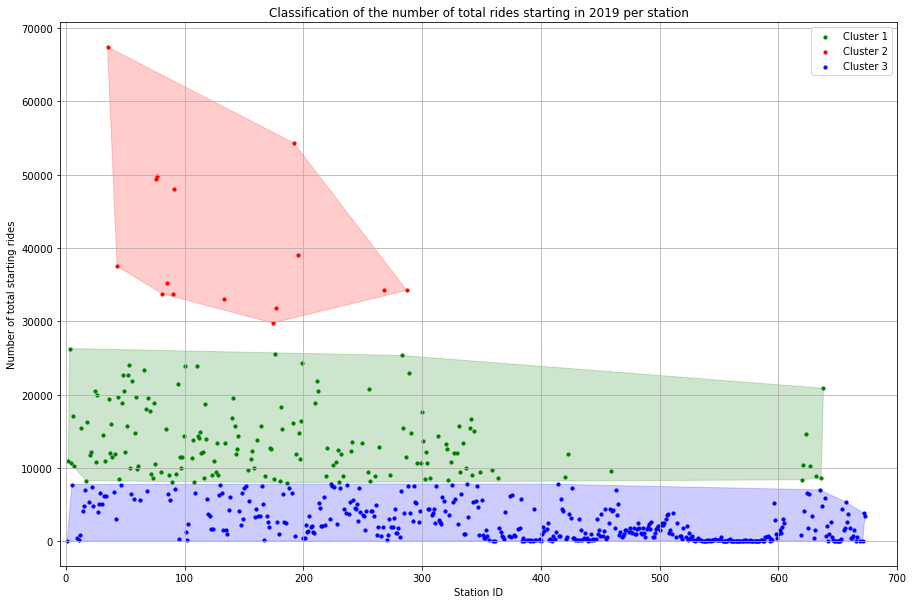

In [197]:
#We plot the result of the classification. 
#rides_starting.rename(columns = {"start_station_id": "Station_id"}, inplace = True)

fig1 = plt.figure(figsize = (15, 10))
plt.scatter(rides_starting[rides_starting["class"] == 0]["Station_id"], rides_starting[rides_starting["class"] == 0]["starting_rides"], color = "green", label = "Cluster 1", s = 10)
plt.scatter(rides_starting[rides_starting["class"] == 1]["Station_id"], rides_starting[rides_starting["class"] == 1]["starting_rides"], color = "red", label = "Cluster 2", s = 10)
plt.scatter(rides_starting[rides_starting["class"] == 2]["Station_id"], rides_starting[rides_starting["class"] == 2]["starting_rides"], color = "blue", label = "Cluster 3", s = 10)
plt.grid(True)
#Plot the convex hull to illustrate the cluster better
for (i, color) in zip(range(3), ["green", "red", "blue"]): 
    points = rides_starting[rides_starting["class"]==i][["Station_id", "starting_rides"]].values
    hull = ConvexHull(points)
    x_hull = np.append(points[hull.vertices,0], points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
    points[hull.vertices,1][0])
    # plot shape
    plt.fill(x_hull, y_hull, alpha=0.2, c= color)
#plt.ylim(0.0, 0.7)
plt.xlim(-5,700)
plt.xlabel("Station ID")
plt.ylabel("Number of total starting rides")
plt.title("Classification of the number of total rides starting in 2019 per station")
plt.legend()
plt.show()

## 3.5.6 Investigation of the clusters based on the number of starting rides

In the graph below we plot the average number of starting rides per hour over the year 2019. Clearly and as already observed in the descriptive part of the assignment, the commuter pattern can be seen - all three graphs peak at around 8 and 17 o' clock, respectively. Interestingly, comparing the blue and the red cluster, it becomes clear that both peaks for the red cluster are roughly the same value, while the 17 o' clock peak for the blue cluster is significantly higher than the 8 o'clock peak. However, it is difficult to deduce something related to the type of trips/customers based solely on that observation.
Interestingly, although the red clustered stations above account for the highest number of starting rides, the "mediocre" cluster in green stands out significantly in the figure below.

/Users/Bjorn/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4441: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


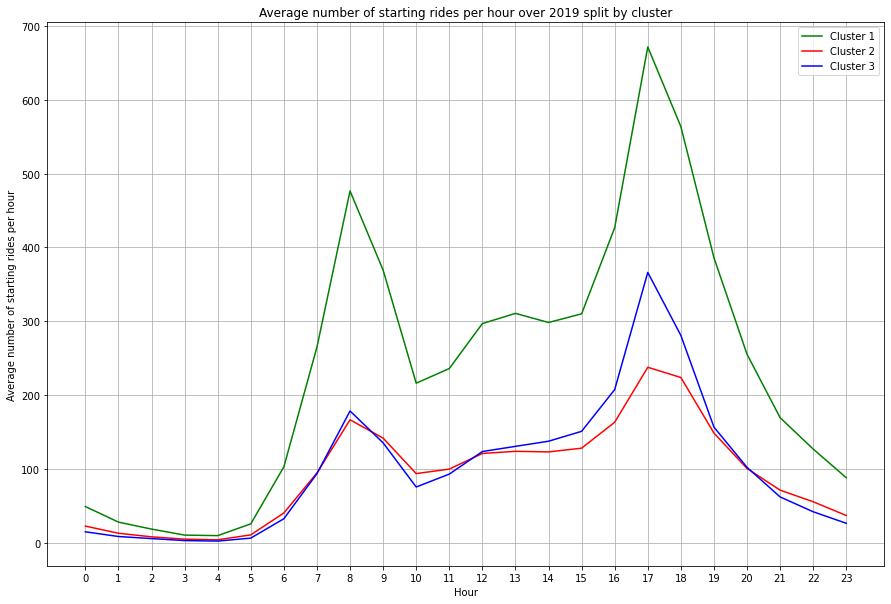

In [181]:
#Now, we want to investigate the activity at the respective stations according to the number of starting rides per station,
#split by the three clusters to see if they exhibit distinct patterns. 

#We start by selecting the relevant columns
divvy = bike_weather [["full_hour_start", "start_station_id", "duration_min"]]
#We merge the data to combine transactional and station data and the respective cluster classes
divvy.rename(columns = {"start_station_id": "Station_id"}, inplace = True)

divvy = divvy.merge(kpi2_station[["Station_id", "class"]], on = "Station_id")

#We group the data by starting hour and class and count the numebr of starting rides to be able to 
#calculate the mean later on
divvy_g = divvy.groupby(["full_hour_start", "class"]).count()
divvy_g.reset_index(inplace = True)
divvy_g["hour"] = list(map(lambda x: x.hour, divvy_g["full_hour_start"]))
#We then again group by the hour and the class to yield the mean of starting rides per class 
divvy_g = divvy_g.groupby(["class", "hour"]).mean()
divvy_g.reset_index(inplace = True)

#We plot the average number of stations per class per hour over the year
fig1 = plt.figure(figsize = (15,10))
plt.plot(divvy_g[divvy_g["class"] == 0]["hour"], divvy_g[divvy_g["class"] == 0]["duration_min"], color = "green", label = "Cluster 1")
plt.plot(divvy_g[divvy_g["class"] == 1]["hour"], divvy_g[divvy_g["class"] == 1]["duration_min"],  color = "red", label = "Cluster 2")
plt.plot(divvy_g[divvy_g["class"] == 2]["hour"], divvy_g[divvy_g["class"] == 2]["duration_min"],  color = "blue", label = "Cluster 3")
plt.grid(True)
plt.xlabel("Hour")
plt.xticks(range(0, 24))
plt.ylabel("Average number of starting rides per hour")
plt.title("Average number of starting rides per hour over 2019 split by cluster")
plt.legend()
plt.show()




#### Geospatial plotting of the stations clustered based on the number of starting rides

Interestingly, when creating the same geospatial plot as above (then based on KPI 2 values), the number of red stations seems to be smaller, however the sites were those are located is similar to the clustering based on KPI 2. The blue stations seem to be predominant compared to the green ones and the diffusion of those two station types does not be as high as based on KPI 2. This might be due to the fact that KPI 2 disects the different activities on each station more thoroughly and thus yields a more specific, distinguishable image. Nevertheless, the three-ring-structure as above can still be observed. Hence, both KPI 2 and the number of starting rides per station yield, overall, the same distribution of stations and thus, seem to be reasonable measures. 


/Users/Bjorn/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


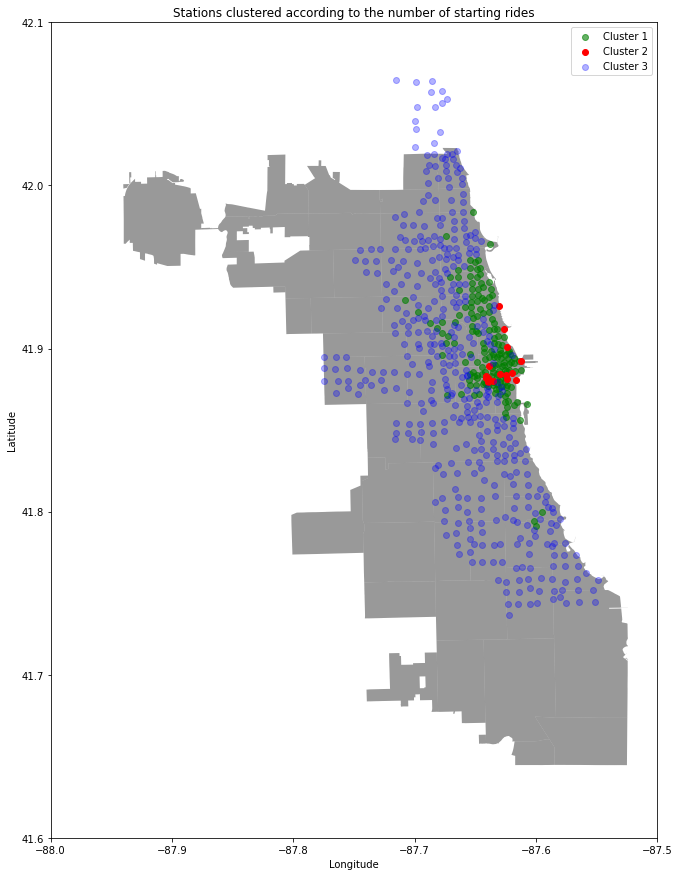

In [201]:
#We again plot the stations clustered on the map, see above for a more detailed description. 

rides_starting_loc = rides_starting.merge(location[["Station_id", "Latitude", "Longitude"]], on = "Station_id")

#read the first map of Chicago

chic2 = geopandas.read_file('../data/Geodata/geo_export_47a238d3-5bf0-4900-bed9-7bd4e1bc537b.shp')

geometry2 = [Point(xy) for xy  in zip(rides_starting_loc["Longitude"], rides_starting_loc["Latitude"])]

#Set the coordinates to standard 
crs2 = {'init':'EPSG:4326'}

#create a geopanda dataframe with defined coordinates and geometry
geo_df2 = geopandas.GeoDataFrame(rides_starting_loc, crs = crs2, geometry = geometry2)

#Now, plot the data for the top stations in red, the bottom stations in blue and all other stations in light black

stations_0 = geo_df2[geo_df2["class"] == 0]
stations_1 = geo_df2[geo_df2["class"] == 1]
stations_2 = geo_df2[geo_df2["class"] == 2]

fig, ax = plt.subplots(figsize=(15, 15))

chic2.to_crs(epsg=4326).plot(ax=ax, color="black", alpha=0.4)

ax.set_xlim(-88, -87.5)
ax.set_ylim(41.6, 42.1)
stations_0.plot(ax = ax, color = "green", label = "Cluster 1", alpha = 0.6)
stations_1.plot(ax = ax, color = "red", label = "Cluster 2", )
stations_2.plot(ax = ax, color = "blue", label = "Cluster 3", alpha = 0.3)
plt.title("Stations clustered according to the number of starting rides")
plt.legend()
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

## 3.5.7 Adding the average duration of the rides as input feature

Here, we will keep the number of starting rides as activity measure and additionally add the average duration of the rides starting per station. The plot below is illustrating the result of this plotting. 


In [121]:
#Now, we want to investigate the influence of the average duration of the rides per station and merge the
#required data accordingly. 
bike_dur = bike_weather[["start_station_id", "duration_sec", "max_temp"]]
bike_dur.rename(columns = {"start_station_id": "Station_id"}, inplace = True)
bike_dur = bike_dur.groupby("Station_id").mean()
bike_dur.reset_index(inplace = True)
bike_dur.head(3)

/Users/Bjorn/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4441: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


,Station_id,duration_sec,max_temp
0,1,555.000000,9.400000
1,2,1858.509707,20.571229
2,3,1787.277941,20.749577


In [122]:
#Combine the frames
bikes_dur_start = bike_dur.merge(rides_starting, on = "Station_id")
bikes_dur_start.head()

,Station_id,duration_sec,max_temp,starting_rides,class
0,1,555.000000,9.400000,1,1
1,2,1858.509707,20.571229,10920,2
2,3,1787.277941,20.749577,26279,2
3,4,1666.266207,20.960997,10597,2
4,5,1106.721711,17.632582,7715,1


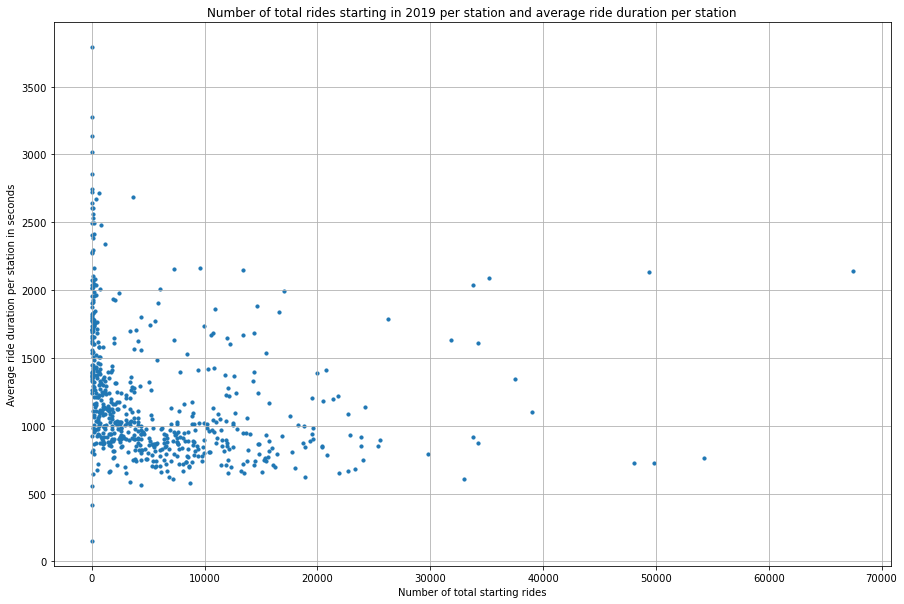

In [123]:
#We plot the average ride duration per station against the total number of starting rides per station
fig1 = plt.figure(figsize = (15,10))
plt.scatter(bikes_dur_start["starting_rides"], bikes_dur_start["duration_sec"], s = 10)
plt.grid(True)
#plt.ylim(0.0, 0.7)
#plt.xlim(-5,10)
plt.xlabel("Number of total starting rides")
plt.ylabel("Average ride duration per station in seconds")
plt.title("Number of total rides starting in 2019 per station and average ride duration per station")
plt.show()

#### Iterating the number of clusters

Business as usual, we apply the elbow method to investigate the appropriate number of clusters and select four, because we want to break down the outskirt-rings of the stations observed previously. 


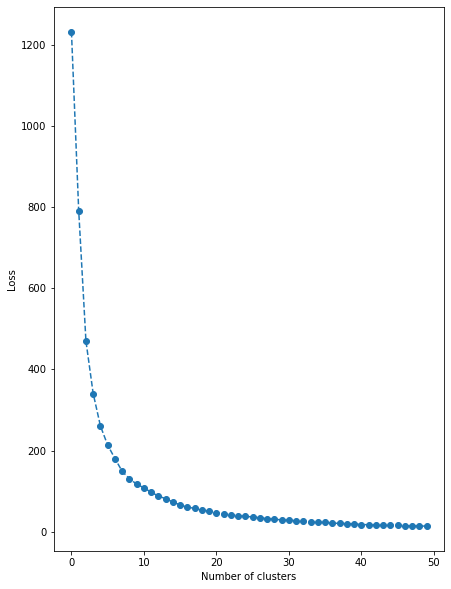

In [124]:
#Again, iterate different hyperparameter values
iterate_clusters(bikes_dur_start[["starting_rides", "duration_sec"]], 50, True)

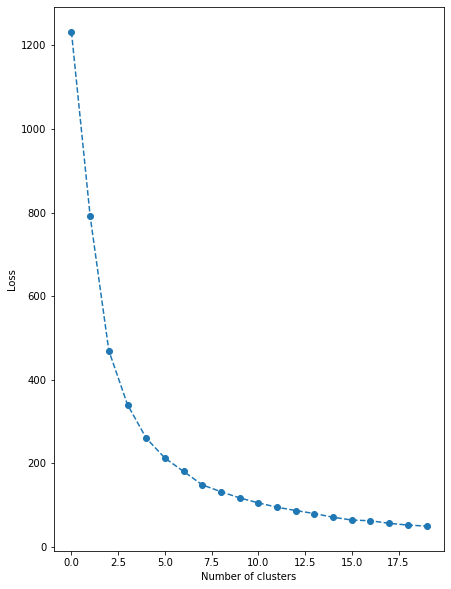

In [125]:
#Reduce the scope to investigate the "ellbow"
iterate_clusters(bikes_dur_start[["starting_rides", "duration_sec"]], 20, True)

#### Plotting the stations clustered based on the number and duration of starting rides

The red cluster stands out as it shows the least proximity to the group of the other three clusters. The yellow and green cluster are relatively similar in terms of their total number of starting rides but seem to exhibit significant differences in terms of the average ride duration starting at the respective stations.


In [184]:
#We scale the data and cluster it
scaler = StandardScaler()
scaler.fit(bikes_dur_start[["starting_rides", "duration_sec"]])
scaled = scaler.transform(bikes_dur_start[["starting_rides", "duration_sec"]])
model = KMeans(4, random_state=1)
model.fit(scaled)
bikes_dur_start["class"] = model.predict(scaled)

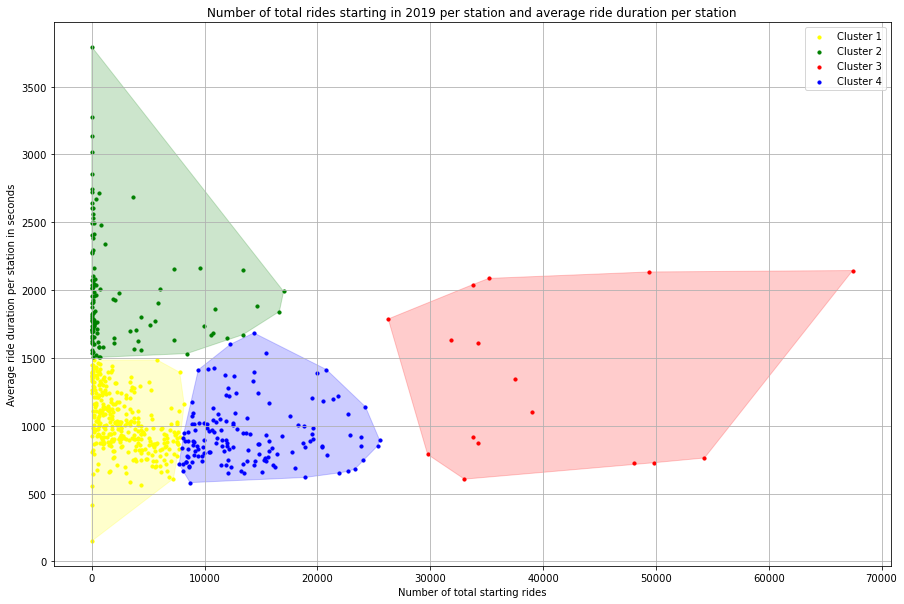

In [198]:
#We plot the results of the clustering
fig1 = plt.figure(figsize = (15, 10))
plt.scatter(bikes_dur_start[bikes_dur_start["class"] == 0]["starting_rides"], bikes_dur_start[bikes_dur_start["class"] == 0]["duration_sec"], color = "yellow", label = "Cluster 1", s = 10)
plt.scatter(bikes_dur_start[bikes_dur_start["class"] == 1]["starting_rides"], bikes_dur_start[bikes_dur_start["class"] == 1]["duration_sec"], color = "green", label = "Cluster 2", s = 10)
plt.scatter(bikes_dur_start[bikes_dur_start["class"] == 2]["starting_rides"], bikes_dur_start[bikes_dur_start["class"] == 2]["duration_sec"], color = "red", label = "Cluster 3", s = 10)
plt.scatter(bikes_dur_start[bikes_dur_start["class"] == 3]["starting_rides"], bikes_dur_start[bikes_dur_start["class"] == 3]["duration_sec"], color = "blue", label = "Cluster 4", s = 10)
plt.grid(True)
#Plot the convex hull to illustrate the cluster better
for (i, color) in zip(range(4), ["yellow", "green", "red", "blue"]): 
    points = bikes_dur_start[bikes_dur_start["class"]==i][["starting_rides", "duration_sec"]].values
    hull = ConvexHull(points)
    x_hull = np.append(points[hull.vertices,0], points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
    points[hull.vertices,1][0])
    # plot shape
    plt.fill(x_hull, y_hull, alpha=0.2, c= color)
#plt.ylim(0.0, 0.7)
#plt.xlim(-5,700)
plt.xlabel("Number of total starting rides")
plt.ylabel("Average ride duration per station in seconds")
plt.title("Number of total rides starting in 2019 per station and average ride duration per station")
plt.legend()
plt.show()

#### Geospatial illustrations of the clusters based on the number of starting rides and their duration

There are relatively few red stations. Comparing their locations again with a Chicago representation on Google Maps shows that they cannot be attributed that clearly to recreational sites anymore, thus, an interpretation of common geospatial characteristics is difficult. The yellow ring was already exhibited in the illustrations above. Interestingly, the former "outskirts" ring, that is the ring now comprised by the green and yellow stations, exhibits a new structure: The green stations seem to form a circle around the yellow stations and thus, around the city. This makes sense, as the green stations exhibit roughly the same activity as the yellow stations, however they showed a higher average riding duration. This allows the following conclusion: The rides from the green outskirt ring seem to be heading towards the center of the city, as their average ride duration is the highest compared to all other clusters. The other clusters do not exhibit this behavior. Thus, it can be concluded that the green ring comprises stations that can be considered "housing" area, from where people start and end their rides before/after commuting to work. This distinction cannot be made for example contemplating the yellow and blue stations as their average duration is roughly the same and thus, one cannot deduce information about the direction of the respective rides starting at those stations. 


/Users/Bjorn/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


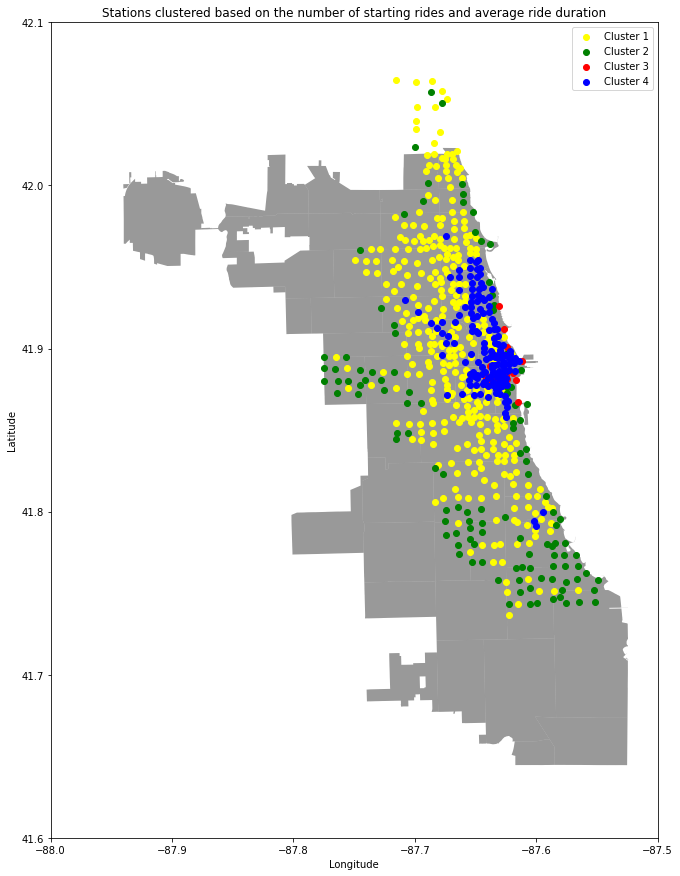

In [204]:
#We map the stations according to their above yielded clusters

bikes_dur_start_loc = bikes_dur_start.merge(location[["Station_id", "Latitude", "Longitude"]], on = "Station_id")

#read the first map of Chicago

chic2 = geopandas.read_file('../data/Geodata/geo_export_47a238d3-5bf0-4900-bed9-7bd4e1bc537b.shp')

geometry2 = [Point(xy) for xy  in zip(rides_starting_loc["Longitude"], rides_starting_loc["Latitude"])]

#Set the coordinates to standard 
crs2 = {'init':'EPSG:4326'}

#create a geopanda dataframe with defined coordinates and geometry
geo_df2 = geopandas.GeoDataFrame(bikes_dur_start_loc, crs = crs2, geometry = geometry2)

#Now, plot the data for the top stations in red, the bottom stations in blue and all other stations in light black

stations_0 = geo_df2[geo_df2["class"] == 0]
stations_1 = geo_df2[geo_df2["class"] == 1]
stations_2 = geo_df2[geo_df2["class"] == 2]
stations_3 = geo_df2[geo_df2["class"] == 3]

fig, ax = plt.subplots(figsize=(15, 15))

chic2.to_crs(epsg=4326).plot(ax=ax, color="black", alpha=0.4)

ax.set_xlim(-88, -87.5)
ax.set_ylim(41.6, 42.1)
stations_0.plot(ax = ax, color = "yellow", label = "Cluster 1")
stations_1.plot(ax = ax, color = "green", label = "Cluster 2")
stations_2.plot(ax = ax, color = "red", label = "Cluster 3")
stations_3.plot(ax = ax, color = "blue", label = "Cluster 4")

plt.title("Stations clustered based on the number of starting rides and average ride duration")
plt.legend()
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()
#Interpretation: Roter Ring um CITYYYY

# 3.6 Summary of the most important findings

It is important to keep in mind that the main target of clustering is to find structures in the data that is not known beforehand and that might not even exist. Therefore, many results of the application of the clustering algorithms are more of a descriptive nature than a utterly new finding. However, besides those descriptive features, certain interesting insights could be revealed which are summarized in the following:

#### In terms of clustering based on the trip duration:

- The aggregation of over 3 million data samples for the application of the K-Mean and Gaussian Mixture models is necessary to obtain reasonable execution times and meaningful visualizations for our transactional data samples. A 'trip' thus describes the average of the duration times of a specific hour and lead to a reduction of data samples from over 3 million to under 8760.
- Duration as a basic input feature is considered alone and in combination with temperature and rainfall probability. </li>
- The clustering with duration as a single input feature clearly divided the data into short trips (<14 min.), medium trips (< 22 min.) and long trips (> 22 min.). The GMN adds a new prespective and marks extrema as one cluster (very short trips and long trips) and shifts the focus to the medium trips.
- The clustering with duration and temperature lead to the following differentiations:
    - Long trips with mainly high temperatures
    - Trips with cold temperatues (< 0°C) with short to medium duration times
    - Short trip durations with medium temperatures (< 15 °C)
    - Medium trip durations with mainly medium temperatures (< 15 °C)
    - Short trip durations with high temperatures (> 15 °C)
    - Medium trip durations with high  temperatures (> 15 °C) 
- The clustering with duration, temperature and precip mainly highlights the rain trips.
- GMN with the advantage to capture elliptical structures does not add additional usefull information (cluster results) for the duration and temperature clustering or the duration, temperature and precip clustering and therefore does not outperform the K-Mean results.

#### In terms of clustering based on the revenue:

- In terms of revenue clustering, it seems to be reasonable to distinguish three ride types, where one (red) cluster "collects" all the higher valued (in terms of revenue) rides. However interestingly, this type of rides is responsible for nearly no revenue during winter, autumn and spring, whereas it contributes the absolute majority during summer and additionally the absolute majority of the total revenue over 2019. This allows the conclusion that those rides that are relatively long and take place during the summer (probably leisure rides) are a major factor in terms of revenue for the bike sharing system.

#### In terms of clustering the stations:

- Clustering the rides based on geospatial and start time input features indicates the importance of commuters for the ride sharing system.
- The two most important customer types based on the clustering analysis are the commuters and the leisure riders that use the bikes during summer.
- The clear three-ring-structure when clustering the stations that was already roughly identified in the descriptive part of this assignment could be backed by the clustering results
- The stations with exhibit the highest values for KPI 2 and which are grouped in one (red) cluster seem to be mainly located close to recreational sites, thus, heavy usage comes significantly from leisure riders. A smaller proportion of the red stations seems to be located in business areas or similar and not close to recreational areas. The other two rings cannot be properly distinguished just by geospatial factors. Investigating the development of the average KPI 2 value over the year for the different clusters stresses the significance of the "red" stations for the bike sharing system and thus, the relevance of leisure riders for the system. However, also the variance is higher for this red category, indicating that the utilization of those stations might be harder to foresee.
- Adding the average temperature per year of starting rides per station does not provide useful additional insights into the stations.
- Both clustering based on KPI2 and based on the total number of starting rides yields roughly the same three-ring structure, which indicates that both measures are reasonable and that the selection of KPI 2 in the descriptive part was appropriate.
- Adding the average duration of the rides to the total number of starting rides yields an additional ring that runs around all other stations.  The rides from this outskirt ring seem to be heading towards the center of the city, as their average ride duration is the highest compared to all other clusters. The other clusters do not exhibit this behavior. Thus, it can be concluded that the green ring comprises stations that can be considered "housing" area, from where people start and end their rides before/after commuting to work.